<a href="https://colab.research.google.com/github/soyeunju/ESAA/blob/main/ESAA/25-1/Project/ESAA_OB2_Project_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **필요한 라이브러리 불러오기**

In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
plt.rc('font', family='NanumBarunGothic')
plt.rcParams['axes.unicode_minus'] = False # 마이너스 부호 깨짐 방지

In [ ]:
# 설치
!pip install geopandas selenium beautifulsoup4 osmnx folium
!pip install fiona
!pip install selenium



---



# **천안시 인구 데이터 분석**

## **연령별 인구 시각화**

사용한 통계 자료 출처: https://www.cheonan.go.kr/cop/bbs/BBSMSTR_000000001101/selectBoardArticle.do

96000 여명이라서 1000명 조사면 1%정도

In [ ]:
old = pd.read_csv('/content/인구수.csv')

In [ ]:
old_ = old[old['5세계급별'] != '계']

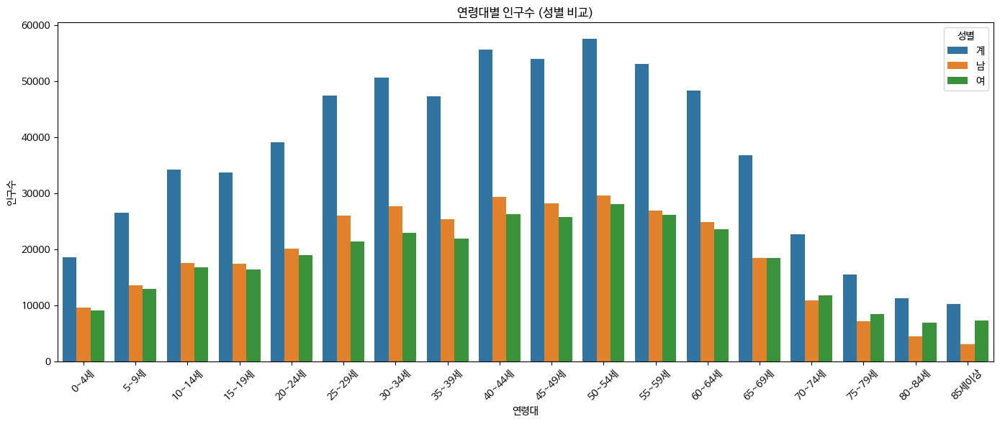

In [ ]:
# long format 변환
old_melted = pd.melt(old_,
                     id_vars='5세계급별',
                     value_vars=['계', '남', '여'],
                     var_name='성별',
                     value_name='인구수')

# 쉼표 제거하고 숫자로 변환
old_melted['인구수'] = old_melted['인구수'].str.replace(',', '').astype(int)

# 그래프
plt.figure(figsize=(14, 6))
sns.barplot(data=old_melted, x='5세계급별', y='인구수', hue='성별')

plt.xticks(rotation=45)
plt.title('연령대별 인구수 (성별 비교)')
plt.xlabel('연령대')
plt.ylabel('인구수')
plt.legend(title='성별')
plt.tight_layout()
plt.show()

추측할 수 있는 것: 40세부터 60세까지가 천안의 전체 인구 중 많은 인구를 차지하기에 시간이 흐를 수록 노인의 비율이 증가할 것. 우리는 젊어질 수 없으나 늙을 수는 있기에 노인 복지를 생각할 필요성이 있어 보임.

## **최근 5개년 간의 노인 인구 변화 추이**

노인 및 전체 연령 5개년 간의 인구 변화 추이 참고 데이터 : https://www.cheonan.go.kr/cop/bbs/BBSMSTR_000000001101/selectBoardArticle.do     
엑셀 데이터를 따로 가공하여 csv 변환 후 불러옴.

In [ ]:
# 노인 데이터 추출
senior_ages = ['65~69세', '70~74세', '75~79세', '80~84세', '85세이상']

# 복사본 생성 (경고 방지)
senior = old_[old_['5세계급별'].isin(senior_ages)].copy()

# 문자열 → 숫자 변환
senior['계'] = senior['계'].str.replace(',', '').astype(int)
senior['남'] = senior['남'].str.replace(',', '').astype(int)
senior['여'] = senior['여'].str.replace(',', '').astype(int)

In [ ]:
# 합계 계산
total_t = senior['계'].sum()
total_m = senior['남'].sum()
total_f = senior['여'].sum()

# 출력
print(f"고령자 총합 (계): {total_t:,}")
print(f"고령자 총합 (남): {total_m:,}")
print(f"고령자 총합 (여): {total_f:,}")

고령자 총합 (계): 96,359
고령자 총합 (남): 43,713
고령자 총합 (여): 52,646


In [ ]:
# 전체 인구의 성별 인구 총합 구하기
total = old[old['5세계급별'] == '계'].copy()

total['계'] = total['계'].str.replace(',', '').astype(int)
total['남'] = total['남'].str.replace(',', '').astype(int)
total['여'] = total['여'].str.replace(',', '').astype(int)

total = total.drop(columns=['5세계급별'])

total_계 = total['계'][0]
total_남 = total['남'][0]
total_여 = total['여'][0]

In [ ]:
# 노인 비율
계 = total_t / total_계
남 = total_m / total_남
여 = total_f / total_여

rate = pd.DataFrame({
    '계': [계],
    '남': [남],
    '여': [여]
})
rate

,계,남,여
0,0.145565,0.128742,0.16328


현재 천안 전체 인구의 노인 비율은 14.56%, <br>
남성 인구의 노인 비율은 12.87%, <br>
여성 인구의 노인 비율은 16.33%다.

국제연합(UN)의 기준에 따르면 전체 인구에서 65세 이상이 차지하는 비율인 고령자 인구 비율이 7% 이상이면 고령화 사회, 14% 이상이면 고령 사회, 20% 이상이면 초고령 사회로 구분된다.

그리고 천안의 노인 비율은 14퍼센트 이상이기 때문에 고령사회로 분류된다고 할 수 있다.

In [ ]:
ts = pd.read_csv('/content/인구수추이.csv')
ts['인구수'] = ts['인구수'].str.replace(',', '').astype(int)
ts['65세 이상'] = ts['65세 이상'].str.replace(',', '').astype(int)
ts

,연도,성별,인구수,65세 이상
0,2021,계,657503,74163
1,2021,남,335917,32534
2,2021,여,321586,41629
3,2022,계,657214,78515
4,2022,남,336296,34776
5,2022,여,320918,43739
6,2023,계,658932,83204
7,2023,남,337515,37176
8,2023,여,321417,46028
9,2024,계,658320,89144


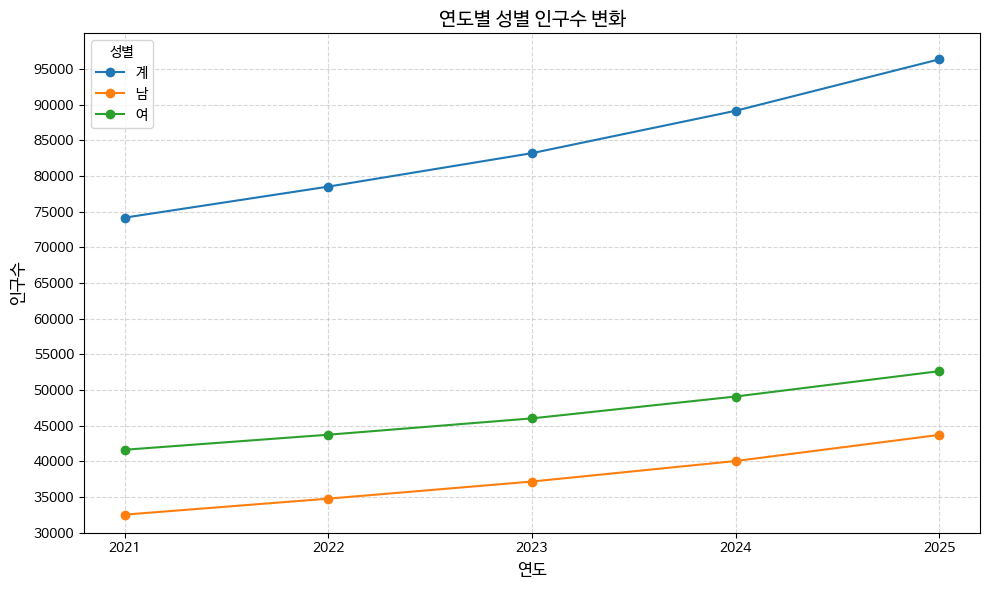

In [ ]:
# 시간에 따른 성별 별 인구 변화 추이 시각화
plt.figure(figsize=(10, 6))

for gender in ts['성별'].unique():
    subset = ts[ts['성별'] == gender]
    plt.plot(subset['연도'], subset['65세 이상'], marker='o', label=gender)

plt.ylim(30000,100000)
plt.yticks(np.arange(30000, 100000, 5000))

plt.title('연도별 성별 인구수 변화', fontsize=14)
plt.xlabel('연도', fontsize=12)
plt.ylabel('인구수', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title='성별')
plt.xticks([2021, 2022, 2023, 2024, 2025])
plt.tight_layout()
plt.show()

천안시는 2021년부터 2025년까지 꾸준히 65세 이상의 인구가 증가해왔다.   

## **연령대별 인구 변화 추이 확인**

In [ ]:
# 연령대별 인구 추이를 확인
ts_all = pd.read_csv('/content/나이별 인구 추이.csv')

cols = ts_all.columns.difference(['연도', '성별'])
for col in cols:
    if ts_all[col].dtype == 'object':
        ts_all[col] = ts_all[col].str.replace(',', '').astype(int)

ts_all

,연도,성별,19세미만,20∼29,30∼39,40∼49,50∼59,60∼69,70∼79,80∼89,90∼99,100이상
0,2021,계,128240,95714,103263,111684,102887,67529,30319,15541,2243,83
1,2021,남,66017,50354,54973,57934,52823,34174,13756,5375,493,18
2,2021,여,62223,45360,48290,53750,50064,33355,16563,10166,1750,65
3,2022,계,123603,93753,100429,111961,104823,71893,31767,16459,2461,65
4,2022,남,63584,49701,53558,58299,53684,36478,14673,5760,549,10
5,2022,여,60019,44052,46871,53662,51139,35415,17094,10699,1912,55
6,2023,계,120088,91456,98607,112252,106375,77270,32867,17274,2661,82
7,2023,남,61769,48714,52816,58502,54369,39290,15328,6132,585,10
8,2023,여,58319,42742,45791,53750,52006,37980,17539,11142,2076,72
9,2024,계,115681,88924,96871,110702,109802,80924,34656,17802,2881,77


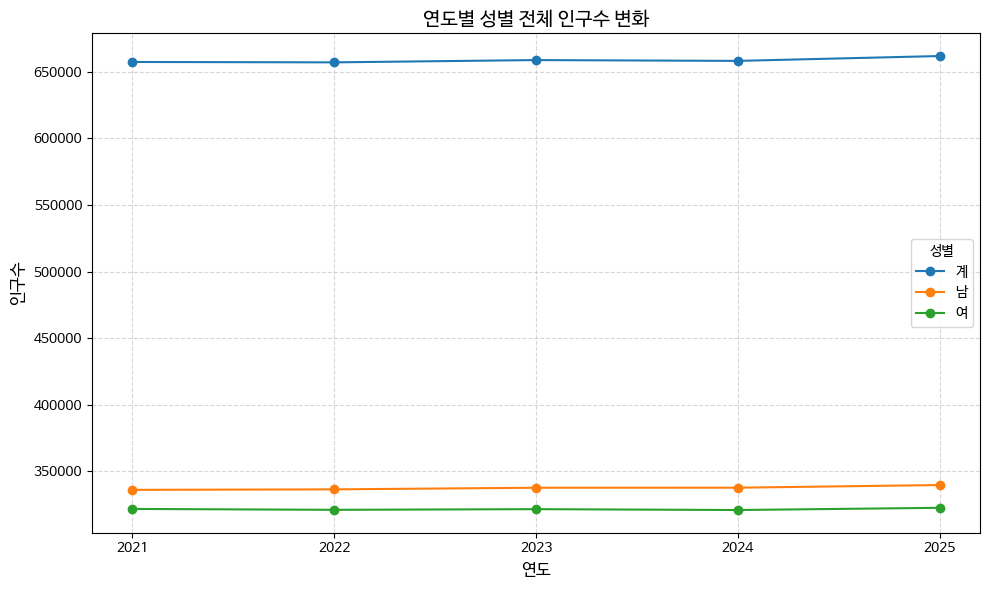

In [ ]:
# 계, 남, 여 전체 보기

plt.figure(figsize=(10, 6))

for gender in ts_all['성별'].unique():
    subset = ts_all[ts_all['성별'] == gender]
    # 각 연령대 인구 합산
    subset = subset.copy()
    subset['전체인구'] = subset.loc[:, '19세미만':'100이상'].sum(axis=1)
    plt.plot(subset['연도'], subset['전체인구'], marker='o', label=gender)

plt.title('연도별 성별 전체 인구수 변화', fontsize=14)
plt.xlabel('연도', fontsize=12)
plt.ylabel('인구수', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title='성별')
plt.xticks([2021, 2022, 2023, 2024, 2025])
plt.tight_layout()
plt.show()

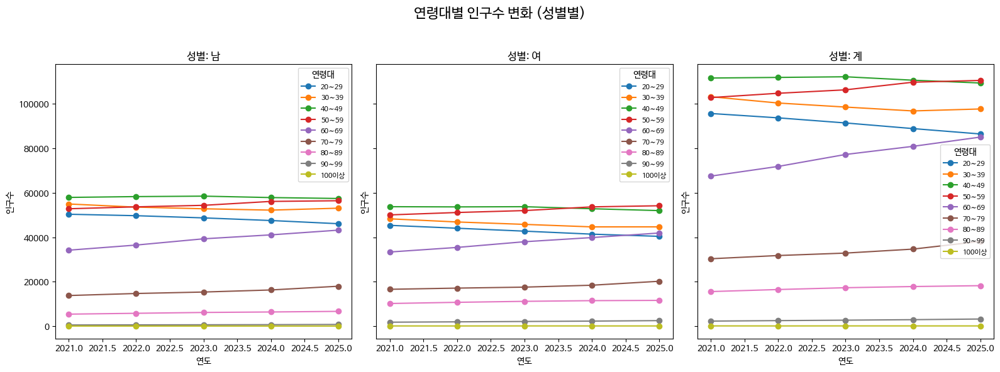

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 연도 숫자형으로 변환
ts_all['연도'] = ts_all['연도'].astype(int)

# 2. 사용할 연령대 열 목록
age_columns = ['20∼29', '30∼39', '40∼49', '50∼59', '60∼69', '70∼79', '80∼89', '90∼99', '100이상']

# 3. 성별 리스트
genders = ['남', '여', '계']

# 4. subplot 설정
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16, 6), sharey=True)
fig.suptitle('연령대별 인구수 변화 (성별별)', fontsize=16)

for i, gender in enumerate(genders):
    ax = axes[i]
    data_gender = ts_all[ts_all['성별'] == gender]

    # 연령대별로 선 그리기
    for col in age_columns:
        ax.plot(data_gender['연도'], data_gender[col], marker='o', label=col)

    ax.set_title(f'성별: {gender}')
    ax.set_xlabel('연도')
    ax.set_ylabel('인구수')
    ax.legend(title='연령대', fontsize=8, title_fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # 제목 공간 확보
plt.show()

## **천안시 행정동 별 노인 인구 비교**

데이터 출처: https://www.cheonan.go.kr/cop/bbs/BBSMSTR_000000001101/selectBoardArticle.do

In [ ]:
town = pd.read_csv('/content/동네별 인구수.csv')
town

,위치,성별,전체,65세 이상
0,천안시,계,661967,96359
1,천안시,남,339539,43713
2,천안시,여,322428,52646
3,동남구,계,260756,48521
4,동남구,남,132144,22056
...,...,...,...,...
97,부성 1동,남,27371,2057
98,부성 1동,여,25470,2454
99,부성 2동,계,63659,3380
100,부성 2동,남,33725,1533


In [ ]:
town_senior = town.drop(columns=['전체'], axis=1)
town_senior

,위치,성별,65세 이상
0,천안시,계,96359
1,천안시,남,43713
2,천안시,여,52646
3,동남구,계,48521
4,동남구,남,22056
...,...,...,...
97,부성 1동,남,2057
98,부성 1동,여,2454
99,부성 2동,계,3380
100,부성 2동,남,1533


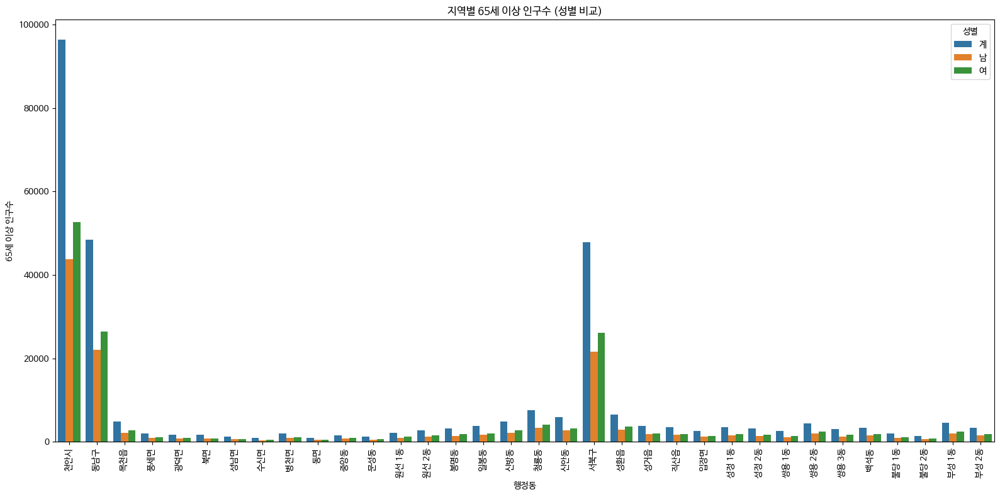

In [ ]:
town_senior['65세 이상'] = town_senior['65세 이상'].astype(str).str.replace(',', '').astype(int)

# 시각화
plt.figure(figsize=(16, 8))
sns.barplot(data=town_senior, x='위치', y='65세 이상', hue='성별')

plt.xticks(rotation=90)
plt.title('지역별 65세 이상 인구수 (성별 비교)')
plt.xlabel('행정동')
plt.ylabel('65세 이상 인구수')
plt.legend(title='성별')
plt.tight_layout()
plt.show()

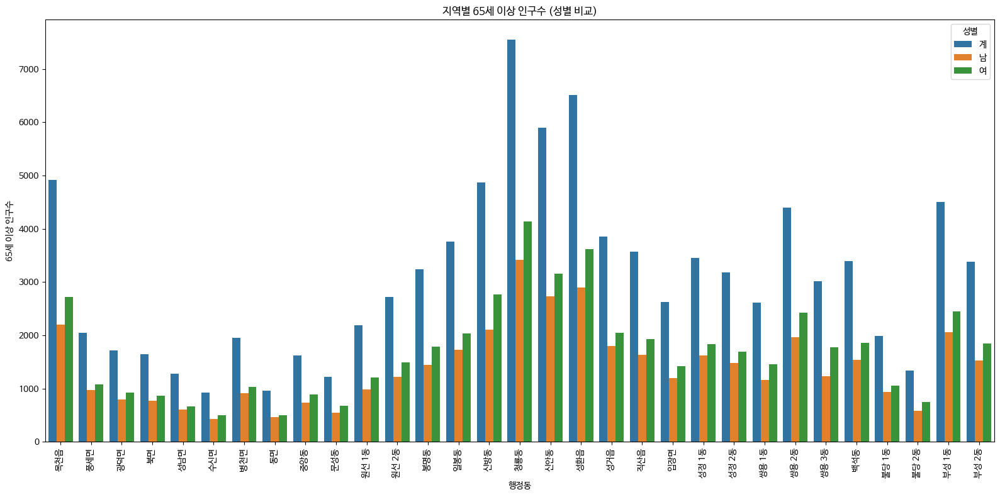

In [ ]:
# 천안시, 동남구, 서북구의 row가 포함되어있으면 시각화한 것이 잘 보이지 않을 것 같아 제하고 다시 시각화

subset = ['천안시', '동남구', '서북구']
town_sn = town_senior[~town_senior['위치'].isin(subset)]
town_sn

# 시각화
plt.figure(figsize=(16, 8))
sns.barplot(data=town_sn, x='위치', y='65세 이상', hue='성별')

plt.xticks(rotation=90)
plt.title('지역별 65세 이상 인구수 (성별 비교)')
plt.xlabel('행정동')
plt.ylabel('65세 이상 인구수')
plt.legend(title='성별')
plt.tight_layout()
plt.show()

목천읍, 신방동, 청룡동, 신안동, 성환읍, 쌍용 2동에 노인인구가 밀집해있음을 확인할 수 있다.

In [ ]:
# 단순히 인원수만 파악할 시

town.groupby('성별').apply(lambda x: x.sort_values('65세 이상', ascending=False).head(8))

/tmp/ipython-input-32-4256778388.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  town.groupby('성별').apply(lambda x: x.sort_values('65세 이상', ascending=False).head(8))


위치 성별      전체  65세 이상   노인인구 비율
성별                                     
계  0   천안시  계  661967   96359  0.145565
   3   동남구  계  260756   48521  0.186078
   57  서북구  계  401211   47838  0.119234
   51  청룡동  계   57860    7550  0.130487
   60  성환읍  계   21833    6512  0.298264
   54  신안동  계   37389    5898  0.157747
   6   목천읍  계   22292    4924  0.220886
   48  신방동  계   42559    4877  0.114594
남  1   천안시  남  339539   43713  0.128742
   4   동남구  남  132144   22056  0.166909
   58  서북구  남  207395   21657  0.104424
   52  청룡동  남   28897    3415  0.118178
   61  성환읍  남   11377    2896  0.254549
   55  신안동  남   18059    2738  0.151614
   7   목천읍  남   11451    2199  0.192036
   49  신방동  남   21918    2104  0.095994
여  2   천안시  여  322428   52646  0.163280
   5   동남구  여  128612   26465  0.205774
   59  서북구  여  193816   26181  0.135082
   53  청룡동  여   28963    4135  0.142768
   62  성환읍  여   10456    3616  0.345830
   56  신안동  여   19330    3160  0.163476
   50  신방동  여   20641    2773  0.134344
   8   목천읍  여   10841    2725  0.251361

인원수만 봤을 때 노인 인구가 많이 사는 구역 top 5        
계 : 청룡동, 성환읍, 신안동, 목천읍, 신방동      
남 : 청룡동, 성환읍, 신안동, 목천읍, 신방동      
여 : 청룡동, 성환읍, 신안동, 신방동, 목천읍

아마 이 지역 인구수가 많아서 그렇게 나오는 것이 아닐까 추측. 밀도로 따졌을 땐 성환읍이 많이 살며 비율도 가장 높음 (다섯 중에서)

아마 이러한 이유로 유빈언니가 말한 포상신고제같은게 나오지 않았나.

In [ ]:
# 행정동 별 노인인구 비율
town['노인인구 비율'] = (town['65세 이상'] / town['전체'])
town

,위치,성별,전체,65세 이상,노인인구 비율
0,천안시,계,661967,96359,0.145565
1,천안시,남,339539,43713,0.128742
2,천안시,여,322428,52646,0.163280
3,동남구,계,260756,48521,0.186078
4,동남구,남,132144,22056,0.166909
...,...,...,...,...,...
97,부성 1동,남,27371,2057,0.075153
98,부성 1동,여,25470,2454,0.096349
99,부성 2동,계,63659,3380,0.053095
100,부성 2동,남,33725,1533,0.045456


In [ ]:
pd.set_option('display.max_rows', None)
town.groupby('성별').apply(lambda x: x.sort_values('노인인구 비율', ascending=False).head(5))

/tmp/ipython-input-21-4058686529.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  town.groupby('성별').apply(lambda x: x.sort_values('노인인구 비율', ascending=False).head(5))


위치 성별    전체  65세 이상   노인인구 비율
성별                                   
계  27   동면  계  1904     961  0.504727
   18  성남면  계  2812    1281  0.455548
   21  수신면  계  2091     920  0.439981
   12  광덕면  계  4004    1722  0.430070
   15   북면  계  4109    1641  0.399367
남  28   동면  남  1037     462  0.445516
   19  성남면  남  1487     612  0.411567
   13  광덕면  남  2019     792  0.392273
   22  수신면  남  1164     425  0.365120
   16   북면  남  2156     774  0.358998
여  29   동면  여   867     499  0.575548
   23  수신면  여   927     495  0.533981
   20  성남면  여  1325     669  0.504906
   14  광덕면  여  1985     930  0.468514
   17   북면  여  1953     867  0.443932

비율로 생각했을 때 행정동 별 노인 인구 비교

계: 동면, 성남면, 수신면, 광덕면, 북면     
남: 동면, 성남면, 광덕면, 수신면, 북면     
여: 동면, 수신면, 성남면, 광덕면, 북면

## **65세 이상 1인가구 비율**


https://kosis.kr/statHtml/statHtml.do?sso=ok&returnurl=https%3A%2F%2Fkosis.kr%3A443%2FstatHtml%2FstatHtml.do%3Fconn_path%3DI4%26list_id%3DA12_2015_1_10_10%26tblId%3DDT_1JC1723%26vw_cd%3DMT_ZTITLE%26lang_mode%3Dko%26orgId%3D101%26

https://kosis.kr/statHtml/statHtml.do?orgId=101&tblId=DT_1PL1502&conn_path=I2

In [ ]:
# 천안시 1인가구 수
one = pd.read_csv('/content/성 및 연령별 1인 가구.csv')
one.head(5)

,행정구역별(시군구),연령별,2023,2023.1,2023.2
0,행정구역별(시군구),연령별,1인가구,남자,여자
1,충청남도,합계,354747,189517,165230
2,충청남도,20세 미만,2791,1314,1477
3,충청남도,20~24,25089,11682,13407
4,충청남도,25~29,34675,21786,12889


In [ ]:
# 데이터 프레임 조정
one = one.rename(columns={
    '2023': '1인가구',
    '2023.1': '남자',
    '2023.2': '여자'
})

one = one.drop(index=0)
one = one[one['행정구역별(시군구)']=='천안시']
one = one.drop(columns=['행정구역별(시군구)'])
one.reset_index(drop=True, inplace=True)
one

,연령별,1인가구,남자,여자
0,합계,111711,61868,49843
1,20세 미만,1510,674,836
2,20~24,12198,5195,7003
3,25~29,15951,9623,6328
4,30~34,13923,9337,4586
5,35~39,9569,6652,2917
6,40~44,8620,6076,2544
7,45~49,7302,4725,2577
8,50~54,8189,5055,3134
9,55~59,7710,4276,3434


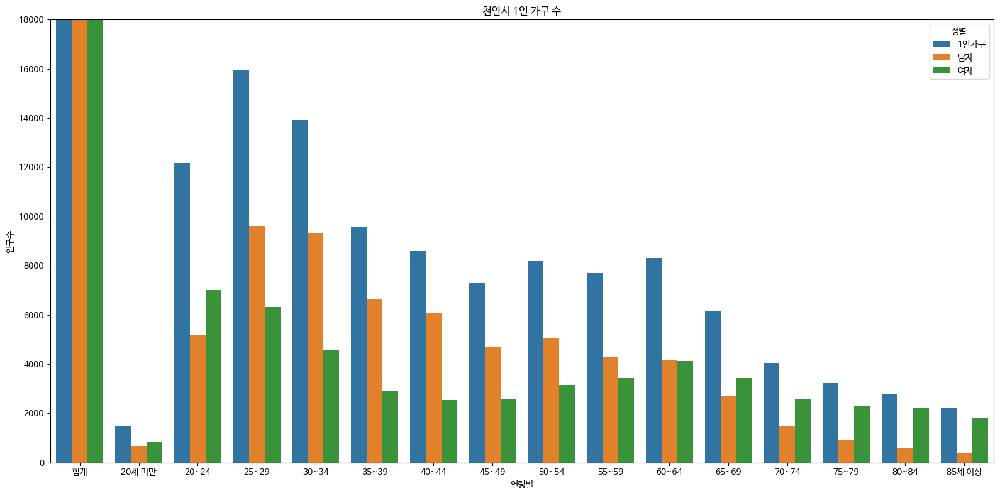

In [ ]:
# 천안시 1인 가구 수

# 숫자형으로 변환 (',' 제거)
cols = ['1인가구', '남자', '여자']
for col in cols:
    one[col] = one[col].astype(str).str.replace(',', '').astype(int)

# melt
one_melted = pd.melt(one, id_vars='연령별', value_vars=cols,
                     var_name='성별', value_name='인구수')

# 시각화
plt.figure(figsize=(16, 8))
plt.ylim(0, 18000)
plt.yticks(range(0, 18001, 2000))

sns.barplot(data=one_melted, x='연령별', y='인구수', hue='성별')
plt.title('천안시 1인 가구 수')
plt.xlabel('연령별')
plt.ylabel('인구수')
plt.tight_layout()
plt.show()

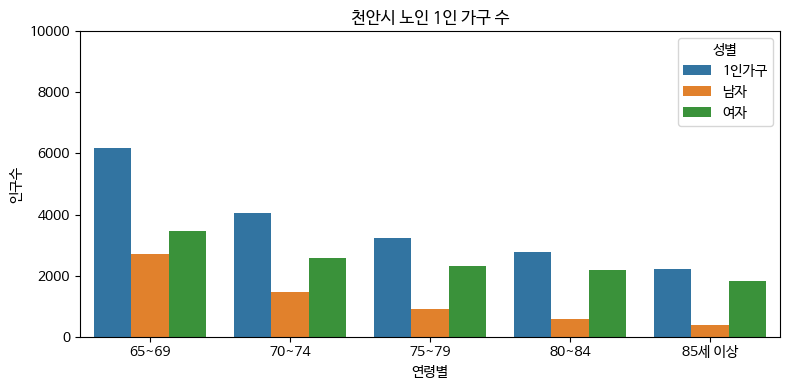

In [ ]:
# 천안시 65세 이상 노인 1인 가구 수


# 숫자형으로 변환 (',' 제거)
cols = ['1인가구', '남자', '여자']
for col in cols:
    one[col] = one[col].astype(str).str.replace(',', '').astype(int)

# melt
one_melted = pd.melt(one, id_vars='연령별', value_vars=cols,
                     var_name='성별', value_name='인구수')

# 노인 인구 추출
one_filtered = one_melted[(one_melted['연령별'] == '65~69') |
                          (one_melted['연령별'] == '70~74') |
                          (one_melted['연령별'] == '75~79') |
                          (one_melted['연령별'] == '80~84') |
                          (one_melted['연령별'] == '85세 이상') ]

# 시각화
plt.figure(figsize=(8,4))
plt.ylim(0, 10000)
plt.yticks(range(0, 10001, 2000))

sns.barplot(data=one_filtered, x='연령별', y='인구수', hue='성별')
plt.title('천안시 노인 1인 가구 수')
plt.xlabel('연령별')
plt.ylabel('인구수')
plt.tight_layout()
plt.show()

In [ ]:
print(one_filtered.groupby('연령별').sum())
print(one_filtered.groupby('성별').sum())

              성별    인구수
연령별                    
65~69   1인가구남자여자  12330
70~74   1인가구남자여자   8096
75~79   1인가구남자여자   6468
80~84   1인가구남자여자   5548
85세 이상  1인가구남자여자   4414
                             연령별    인구수
성별                                     
1인가구  65~6970~7475~7980~8485세 이상  18428
남자    65~6970~7475~7980~8485세 이상   6077
여자    65~6970~7475~7980~8485세 이상  12351


확실히 혼자 사는 노인 남성보다 혼자 사는 노인 여성이 많음.

## **전국 인구 현황**

데이터 출처: https://jumin.mois.go.kr/ageStatMonth.do#none

In [5]:
ppl = pd.read_csv('/content/전국_노인_인구_현황.csv')
ppl.head()

,행정기관,계,총 인구수,연령구간인구수,65~69세,70~74세,75~79세,80~84세,85~89세,90~94세,95~99세,100세 이상
0,전국,계,"51,164,582","10,558,842","3,699,881","2,534,347","1,828,894","1,356,951","781,900","285,385","62,678","8,806"
1,서울특별시,계,"9,325,616","1,860,632","638,318","459,370","344,009","240,439","124,534","42,476","9,989","1,497"
2,부산광역시,계,"3,252,830","800,126","276,849","205,032","145,718","100,994","51,148","16,425","3,525",435
3,대구광역시,계,"2,357,052","506,312","175,405","125,508","88,380","65,576","36,263","12,564","2,338",278
4,인천광역시,계,"3,039,450","555,148","212,701","131,396","92,657","64,259","36,471","13,794","3,330",540


In [6]:
population = ppl.loc[:, '행정기관':'연령구간인구수'].copy()
population.head()

,행정기관,계,총 인구수,연령구간인구수
0,전국,계,"51,164,582","10,558,842"
1,서울특별시,계,"9,325,616","1,860,632"
2,부산광역시,계,"3,252,830","800,126"
3,대구광역시,계,"2,357,052","506,312"
4,인천광역시,계,"3,039,450","555,148"


In [7]:
# 문자형인 인구수 숫자형으로 전환
population['연령구간인구수'] = population['연령구간인구수'].str.replace(',', '').astype(int)
population['총 인구수'] = population['총 인구수'].str.replace(',', '').astype(int)

# 노인 밀집도 구하기
population['rate'] = population['연령구간인구수'] / population['총 인구수']
population.head()

,행정기관,계,총 인구수,연령구간인구수,rate
0,전국,계,51164582,10558842,0.206370
1,서울특별시,계,9325616,1860632,0.199518
2,부산광역시,계,3252830,800126,0.245978
3,대구광역시,계,2357052,506312,0.214807
4,인천광역시,계,3039450,555148,0.182648


In [8]:
sim = population[(population['rate'] >= 0.1) & (population['rate'] <= 0.15)]
sim.head()

,행정기관,계,총 인구수,연령구간인구수,rate
8,세종특별자치시,계,392223,46834,0.119407
26,세종특별자치시,남,195248,21240,0.108785
44,세종특별자치시,여,196975,25594,0.129935


천안시 전체 고령화율(0.14)과 비슷한 곳은 세종특별자치시. 노인 복지 정책을 어떻게 펼치고 있는지 확인해봐도 좋을 것 같음.

In [ ]:
population[population['행정기관'].str.strip() == '충청남도']

,행정기관,계,총 인구수,연령구간인구수,rate
12,충청남도,계,2135890,488861,0.228879
30,충청남도,남,1096214,219092,0.199862
48,충청남도,여,1039676,269769,0.259474


- 천안시가 속한 충청남도에 비해 고령화율이 낮은 편.  



---



# **천안시 복지시설(관내) 인프라 데이터 분석**

- 모든 분야 복지시설 증감 추세
- 복지시설별 전국 평균과 천안시 비교, 노인 복지 관련 복지시설이 차지하는 비중
- 천안시 지도 위에 heatmap 시각화를 통해 복지 시설 분포도 파악
- 행정동 별 노인 인구 ~ 만명당 복지시설 수 시각화
- 복지시설 접근성 분석(노인복지시설까지 평균 이동거리, GIS 분석)
- 노인 주택･공공임대주택 분포와 고령자 밀집도 비교

## **2024 전국 노인복지시설 현황**

1. 주거 기능을 수행하는 노인주거복지시설(양로시설, 노인공동생활가정, 노인복지주택)

    이용 노인 수 **소폭 증가**
    > 2022년 1만 9,355명 → 2023년 1만 9,369명

    시설 수 **감소**
    > 2022년 308개 → 2023년 297개

2. 노인성 질환(치매·중풍 포함) 등으로 인해 도움이 필요한 노인의 요양 기능을 수행하는 노인의료복지시설(노인요양시설, 노인요양공동생활가정)

    이용 노인 수 **4.62% 증가**
    > 2022년 23만 2,235명 → 2023년 24만 2,974명

    시설 수 **70개소 증가**
    > 2022년 6,069개소 → 2023년 6,139개소

3. 건강한 노인들이 취미생활을 위하여 이용하는 노인여가복지시설인 노인복지관, 경로당, 노인 교실 등

    시설 수 **669개소 증가**
    > 2022년도 6만 9,786개소 → 2023년 7만 455개소

4. 가정에서 일상생활을 영위하면서 신체적·정신적 장애로 어려움을 겪고 있는 노인 등을 방문하여 목욕, 식사 등을 제공하는 재가서비스

    이용 노인 수 **17.02% 증가**
    > 2022년 10만 6.857명 → 2023년 12만 5,048명

    시설 수 **2,624개소 증가**
    > 2022년도 1만 3,272개소 → 2023년 1만 5,896개소

출처 : https://www.mohw.go.kr/board.es?mid=a10503010100&bid=0027&act=view&list_no=1482103&tag=&nPage=1


## **장기요양기관 현황**

데이터출처 : KOSIS 시·군·구별 급여종류별 장기요양기관 현황

In [ ]:
# CSV 파일 읽기
df = pd.read_csv('/content/drive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/시·군·구별_급여종류별_장기요양기관_현황.csv', encoding='UTF-8')

# 천안시, 천안시동남구, 천안시서북구 행의 인덱스 찾기
cheonan_idx = df[(df['시·군·구별(1)'] == '충남') & (df['시·군·구별(2)'] == '천안시')].index
dongnam_idx = df[(df['시·군·구별(1)'] == '충남') & (df['시·군·구별(2)'] == '천안시동남구')].index
seobuk_idx = df[(df['시·군·구별(1)'] == '충남') & (df['시·군·구별(2)'] == '천안시서북구')].index

# 천안시 행이 존재하고, 동남구와 서북구 행이 모두 존재하는 경우에만 처리
if len(cheonan_idx) > 0 and len(dongnam_idx) > 0 and len(seobuk_idx) > 0:
    cheonan_row = cheonan_idx[0]
    dongnam_row = dongnam_idx[0]
    seobuk_row = seobuk_idx[0]

    # 천안시 행에서 '-' 또는 빈 값인 컬럼들을 찾아서 동남구+서북구 값으로 채우기
    for col in df.columns:
        if col not in ['시·군·구별(1)', '시·군·구별(2)']:  # 지역명 컬럼은 제외
            cheonan_val = df.loc[cheonan_row, col]
            dongnam_val = df.loc[dongnam_row, col]
            seobuk_val = df.loc[seobuk_row, col]

            # 천안시 데이터가 비어있거나 '-'인 경우
            if pd.isna(cheonan_val) or cheonan_val == '-' or cheonan_val == '':
                # 동남구와 서북구 값이 모두 숫자인 경우 합계 계산
                try:
                    dongnam_num = float(dongnam_val) if dongnam_val not in ['-', '', np.nan] and pd.notna(dongnam_val) else 0
                    seobuk_num = float(seobuk_val) if seobuk_val not in ['-', '', np.nan] and pd.notna(seobuk_val) else 0

                    # 두 값 모두 0이 아닌 경우에만 합계를 계산
                    if dongnam_num != 0 or seobuk_num != 0:
                        df.loc[cheonan_row, col] = int(dongnam_num + seobuk_num)
                except (ValueError, TypeError):
                    # 숫자로 변환할 수 없는 경우 그대로 유지
                    continue

    # 동남구와 서북구 행 삭제
    df = df.drop([dongnam_row, seobuk_row])

    # 인덱스 재설정
    df = df.reset_index(drop=True)

    # 결과 확인
    cheonan_result = df[(df['시·군·구별(1)'] == '충남') & (df['시·군·구별(2)'] == '천안시')]

    # 컬럼명에서 연도 뒤의 ".숫자" 제거
    df.columns = [
        col.split('.')[0] if col not in ['시·군·구별(1)', '시·군·구별(2)'] else col
        for col in df.columns
    ]

    # 결과를 새 파일로 저장
    df.to_csv('processed_data.csv', index=False, encoding='utf-8-sig')

else:
    print("천안시, 천안시동남구, 천안시서북구 행을 모두 찾을 수 없습니다.")
    print("데이터를 확인해 주세요.")

In [ ]:
plt.rcParams['font.family'] = 'NanumBarunGothic'
plt.rcParams['axes.unicode_minus'] = False

# -------------------------
# 1. 데이터 불러오기 및 컬럼 평탄화
# -------------------------
# 파일 읽기
df = pd.read_csv('processed_data.csv',
    header=[0, 1, 2], encoding='utf-8'
)

# 0행 제거
df = df.drop(index=0).reset_index(drop=True)

# MultiIndex 컬럼을 연도_대분류_소분류 형태로 평탄화
df.columns = ['_'.join([str(x) for x in col if x]) for col in df.columns]

df

,시·군·구별(1)_시·군·구별(1)_시·군·구별(1),시·군·구별(2)_시·군·구별(2)_시·군·구별(2),2010_재가_방문요양,2010_재가_방문목욕,2010_재가_방문간호,2010_재가_주야간보호,2010_재가_단기보호,2010_재가_복지용구,2010_노인의료복지시설_노인요양시설,2010_노인의료복지시설_노인전문요양시설,...,2023_재가노인복지시설_단기보호,2023_재가노인복지시설_복지용구,2023_재가장기요양기관_방문요양,2023_재가장기요양기관_방문목욕,2023_재가장기요양기관_방문간호,2023_재가장기요양기관_주야간보호,2023_재가장기요양기관_단기보호,2023_재가장기요양기관_복지용구,2023_노인의료복지시설_노인요양시설,2023_노인의료복지시설_노인요양공동생활가정
0,합계,소계,9164,7294,739,1273,199,1278,1078,450,...,70,560,10011,7562,516,1714,38,1511,4568,1701
1,충남,천안시,64,54,4,14,2,14,8,5,...,2,6,71,53,6,28,-,19,63,23


In [ ]:
# 연도 컬럼만 추출
year_cols = [col for col in df.columns if col.startswith('20')]

# melt로 데이터 변형
df_melt = df.melt(
    id_vars=['시·군·구별(1)_시·군·구별(1)_시·군·구별(1)', '시·군·구별(2)_시·군·구별(2)_시·군·구별(2)'],
    value_vars=year_cols,
    var_name='연도_시설',
    value_name='시설수'
)

# 연도와 시설유형 분리
df_melt['연도'] = df_melt['연도_시설'].str.slice(0, 4).astype(int)
df_melt['시설유형'] = df_melt['연도_시설'].str.slice(5)

# 시설수 숫자형 변환 (결측치는 0으로 처리)
df_melt['시설수'] = pd.to_numeric(df_melt['시설수'], errors='coerce').fillna(0).astype(int)

# 컬럼 이름 정리
df_melt.rename(columns={
    '시·군·구별(1)_시·군·구별(1)_시·군·구별(1)': '시도',
    '시·군·구별(2)_시·군·구별(2)_시·군·구별(2)': '시군구'
}, inplace=True)

# 데이터 확인
print(df_melt.head())

   시도  시군구         연도_시설   시설수    연도     시설유형
0  합계   소계  2010_재가_방문요양  9164  2010  재가_방문요양
1  충남  천안시  2010_재가_방문요양    64  2010  재가_방문요양
2  합계   소계  2010_재가_방문목욕  7294  2010  재가_방문목욕
3  충남  천안시  2010_재가_방문목욕    54  2010  재가_방문목욕
4  합계   소계  2010_재가_방문간호   739  2010  재가_방문간호


## **전국 복지 시설 증감 추세**

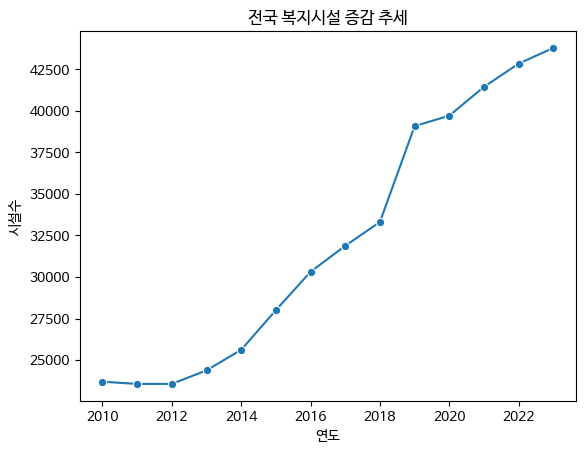

In [ ]:
national_df = df_melt[df_melt['시도'] == '합계']
national_total = national_df.groupby('연도')['시설수'].sum().reset_index()

sns.lineplot(data=national_total, x='연도', y='시설수', marker='o')
plt.title('전국 복지시설 증감 추세')
plt.show()

## **천안시 복지 시설 증감 추세**

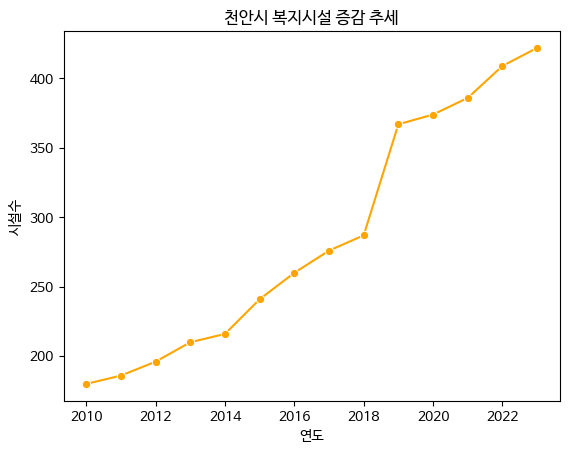

In [ ]:
cheonan_df = df_melt[df_melt['시군구'] == '천안시']
cheonan_total = cheonan_df.groupby('연도')['시설수'].sum().reset_index()

sns.lineplot(data=cheonan_total, x='연도', y='시설수', marker='o', color='orange')
plt.title('천안시 복지시설 증감 추세')
plt.show()

## **복지시설별 전국과 천안시 비교**

In [ ]:
# 천안시/전국 구분된 데이터 생성
national_grouped = df_melt[df_melt['시군구'] != '천안시'].groupby(['연도', '시설유형'], as_index=False).agg({'시설수': 'sum'})
cheonan_grouped = df_melt[df_melt['시군구'] == '천안시'].groupby(['연도', '시설유형'], as_index=False).agg({'시설수': 'sum'})

# 병합: 전국 + 천안
data_merged = pd.merge(
    national_grouped, cheonan_grouped,
    on=['연도', '시설유형'],
    how='left',
    suffixes=('_전국', '_천안')
)

# NaN → 0 처리
data_merged['시설수_천안'] = data_merged['시설수_천안'].fillna(0)

# 천안 비율 계산
data_merged['천안_비율(%)'] = (data_merged['시설수_천안'] / data_merged['시설수_전국']) * 100

# 2023년 필터링
data_2023 = data_merged[data_merged['연도'] == 2023].copy()
national_2023 = national_grouped[national_grouped['연도'] == 2023].copy()
cheonan_2023 = cheonan_grouped[cheonan_grouped['연도'] == 2023].copy()

/tmp/ipython-input-50-2670655831.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipython-input-50-2670655831.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipython-input-50-2670655831.py:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


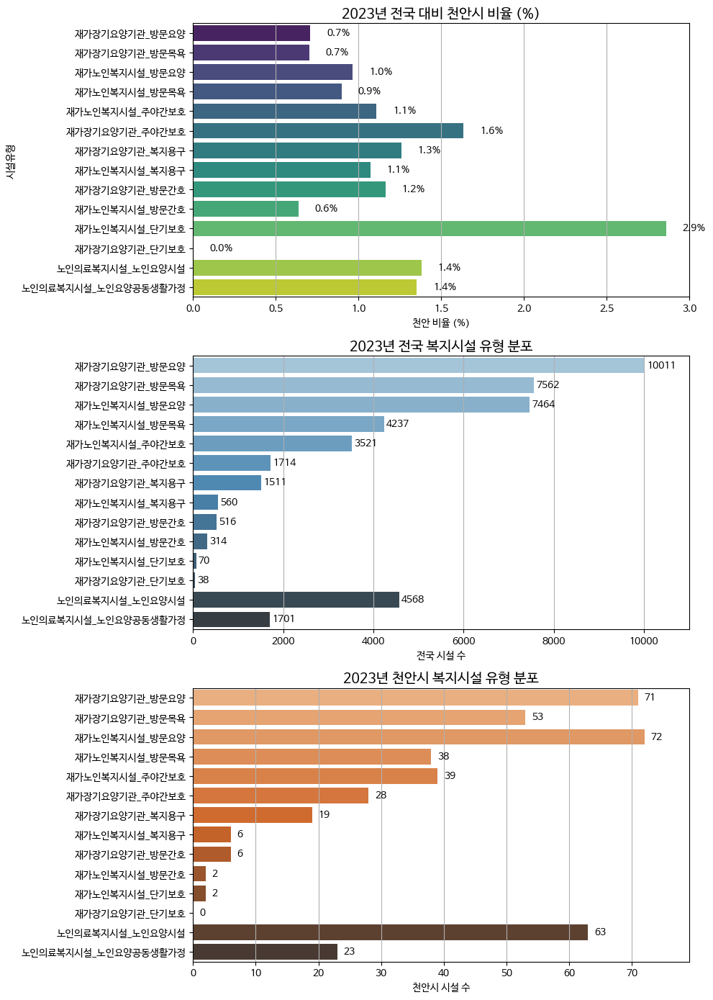

In [ ]:
# 정렬 기준 키워드
priority_keywords = ['재가', '재가노인복지시설', '재가장기요양기관', '노인의료복지시설']

# 기존 시설유형 리스트
all_facilities = national_grouped[national_grouped['연도'] == 2023].sort_values('시설수', ascending=False)['시설유형'].tolist()

# 키워드 우선 정렬 함수
def facility_sort_key(name):
    for i, keyword in enumerate(priority_keywords):
        if name.startswith(keyword):
            return i
    return len(priority_keywords) + all_facilities.index(name)

# 최종 정렬 순서
facility_order = sorted(all_facilities, key=facility_sort_key)

# 카테고리형으로 변환 (순서 지정)
for df in [data_2023, national_2023, cheonan_2023]:
    df['시설유형'] = pd.Categorical(df['시설유형'], categories=facility_order, ordered=True)

# 최대 x축 값 (전체 그래프의 기준으로 사용)
max_x = max(national_2023['시설수'].max(), cheonan_2023['시설수'].max())

# 그래프 설정
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 14), sharey=True)

# (1) 천안 비율
sns.barplot(
    data=data_2023,
    x='천안_비율(%)',
    y='시설유형',
    palette='viridis',
    dodge=False,
    ax=axes[0],
)
axes[0].set_title('2023년 전국 대비 천안시 비율 (%)', fontsize=14)
axes[0].set_xlabel('천안 비율 (%)')
axes[0].set_ylabel('시설유형')
axes[0].grid(axis='x')

# 텍스트 표시
for patch in axes[0].patches:
    width = patch.get_width()
    y = patch.get_y() + patch.get_height() / 2
    axes[0].text(
        width + 0.1, y,
        f"{width:.1f}%",
        va='center'
    )

# (2) 전국 시설유형 분포
sns.barplot(
    data=national_2023,
    x='시설수',
    y='시설유형',
    palette='Blues_d',
    dodge=False,
    ax=axes[1]
)
axes[1].set_title('2023년 전국 복지시설 유형 분포', fontsize=14)
axes[1].set_xlabel('전국 시설 수')
axes[1].set_ylabel('')
axes[1].set_xlim(0, max_x * 1.1)
axes[1].grid(axis='x')

for patch in axes[1].patches:
    width = patch.get_width()
    y = patch.get_y() + patch.get_height() / 2
    axes[1].text(
        width + 50, y,
        f"{int(width)}",
        va='center'
    )

# (3) 천안시 시설유형 분포
sns.barplot(
    data=cheonan_2023,
    x='시설수',
    y='시설유형',
    palette='Oranges_d',
    dodge=False,
    ax=axes[2]
)
axes[2].set_title('2023년 천안시 복지시설 유형 분포', fontsize=14)
axes[2].set_xlabel('천안시 시설 수')
axes[2].set_ylabel('')
max_x_cheonan = cheonan_2023['시설수'].max()
axes[2].set_xlim(0, max_x_cheonan * 1.1)
axes[2].grid(axis='x')

for patch in axes[2].patches:
    width = patch.get_width()
    y = patch.get_y() + patch.get_height() / 2
    axes[2].text(
        width + 1, y,
        f"{int(width)}",
        va='center'
    )

plt.tight_layout()
plt.show()

1. 전국과 천안시 증감 추세 비교

    2023년 기준 천안시 복지시설 수 약 420개

    > 2010년 대비 2.3배 이상 증가

    전국적인 증가 추세와 유사하게 나타남

2. 천안시 복지시설 특징

   재가요양중심 복지 모델에 강점을 보임

    단기보호, 복지구, 방문목욕 등 일부 유형이 매우 적음




## **크롤링**

### **라이브러리 설치, 불러오기**

In [ ]:
# 설치
!pip install geopandas selenium beautifulsoup4 osmnx folium
!pip install fiona
!pip install selenium

In [ ]:
# 라이브러리 import
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
from selenium import webdriver
from bs4 import BeautifulSoup
import folium

### **행정동 중심 좌표 확보**

http://www.gisdeveloper.co.kr/?p=2332

geoservice를 이용한 천안시 행정동 중심 좌표 데이터 추출

코드 : 시도(44), 시군구(133), 읍면동(256)

### **읍면동 중심좌표 불러오기**

geoservice에서 추출하면 **shapefile** 형태로 제공해줌

<shp 파일>

GIS(지리정보체계) 데이터의 독자적인 확장자

여러 개의 파일이 한 묶음으로 저장되어 있음
> shp 파일 포함 최소 3개 존재해야함

**모든 파일의 파일명이 동일해야 함**

[필수 확장자]
- **shp** : Shape File - GIS에 올리는 파일
- **dbf** : DataBase file : 데이터가 들어있는 파일
- **shx** : Index File : 인덱스 파일, 직접 다루는 일은 거의 없음

[기타 확장자]
- **prj** : Projection File - 좌표계 파일
- **cpg** : Encoding File = 언어 인코딩 파일
- sbn & sbx : 공간 인덱스 저장 파일
- xml : shp 파일의 메타 데이터 저장 파일

출처 : https://blog.naver.com/mooming45/223285975205

In [ ]:
import geopandas as gpd

gpd.options.io_engine = "fiona"  # 강제로 fiona 사용

shapefile_path = "/content/drive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/천안시_GIS_데이터/a.shp"
dong_gdf = gpd.read_file(shapefile_path)

# invalid geometry가 있으면 buffer(0)로 고치기
dong_gdf['geometry'] = dong_gdf['geometry'].buffer(0)

print(dong_gdf.head())

     EMD_CD       EMD_ENG_NM EMD_KOR_NM  \
0  44133101      Wachon-dong        와촌동   
1  44133102  Seongjeong-dong        성정동   
2  44133103    Baekseok-dong        백석동   
3  44133104     Dujeong-dong        두정동   
4  44133105  Seongseong-dong        성성동   

                                            geometry  
0  POLYGON ((968569.82 1868327.784, 968562.997 18...  
1  POLYGON ((968861.628 1870013.559, 968860.968 1...  
2  POLYGON ((965336.42 1869364.007, 965337.898 18...  
3  POLYGON ((968212.833 1871254.615, 968237.105 1...  
4  POLYGON ((967902.672 1872631.857, 967906.216 1...  


In [ ]:
import geopandas as gpd

gpd.options.io_engine = "fiona"  # 강제로 fiona 사용

shapefile_path = "/content/drive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/천안시_GIS_데이터/a.shp"
dong_gdf = gpd.read_file(shapefile_path)

# 중심좌표 계산
dong_gdf['centroid'] = dong_gdf.geometry.centroid

# 중심좌표에서 경도/위도 추출
dong_gdf['centroid_x'] = dong_gdf['centroid'].x
dong_gdf['centroid_y'] = dong_gdf['centroid'].y

print(dong_gdf[['centroid_x', 'centroid_y']].head())

      centroid_x    centroid_y
0  968315.553646  1.867846e+06
1  967937.570172  1.869260e+06
2  965792.251361  1.870009e+06
3  968193.159062  1.870642e+06
4  966701.268750  1.871820e+06


### **노인복지시설 좌표 크롤링(Selenium 이용)**

In [ ]:
!pip install selenium

### **시설명 & 상세 주소 크롤링**

In [ ]:
import time
import pandas as pd
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from bs4 import BeautifulSoup

# Selenium 설정
options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')

driver = webdriver.Chrome(options=options)

# 1) 사이트 접속 & '노인복지' 버튼 클릭
driver.get('https://www.cawf.or.kr/map/map2.php')

try:
    btn = WebDriverWait(driver, 10).until(
        EC.element_to_be_clickable((By.XPATH, "//a[contains(@href,'part=노인복지')]"))
    )
    btn.click()
    time.sleep(2)  # 로딩 대기
except Exception as e:
    print("노인복지 버튼 클릭 실패:", e)

# 2) 1~15 페이지 순회
results = []

for page_num in range(1, 16):  # 페이지 1~15
    page_url = f"https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage={page_num}"
    print(f"[{page_num}/15] 페이지 크롤링: {page_url}")

    driver.get(page_url)
    time.sleep(1.5)  # 로딩 대기

    html = driver.page_source
    soup = BeautifulSoup(html, 'html.parser')

    lis = soup.find_all('li')
    for li in lis:
        name_tag = li.find('div', class_='name')
        addr_tag = li.find('dt', text='주소')
        addr_value = addr_tag.find_next_sibling('dd').get_text(strip=True) if addr_tag else None

        if name_tag and addr_value:
            name = name_tag.find('strong').get_text(strip=True)
            results.append({'name': name, 'address': addr_value})

print(f"총 {len(results)} 개의 시설 크롤링 완료")

# 3) DataFrame & 저장
df_crol = pd.DataFrame(results)
print(df)

df_crol.to_csv('welfare_facilities.csv', index=False, encoding='utf-8-sig')
print("CSV 파일로 저장 완료: welfare_facilities.csv")

driver.quit()

[1/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=1


/tmp/ipython-input-56-2498325582.py:45: DeprecationWarning: The 'text' argument to find()-type methods is deprecated. Use 'string' instead.
  addr_tag = li.find('dt', text='주소')


[2/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=2
[3/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=3
[4/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=4
[5/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=5
[6/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=6
[7/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=7
[8/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=8
[9/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=9
[10/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=10
[11/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=11
[12/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=12
[13/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=13
[14/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=14
[15/15] 페이지 크롤링: https://www.cawf.or.kr/map/map2.php?part=노인복지&cpage=15
총 132 개의

### **카카오 API로 시설명 -> 위경도 변환**

In [ ]:
import pandas as pd
import requests
import time

# 1) DataFrame 불러오기
df_crol = pd.read_csv('welfare_facilities.csv')

# 2) 카카오 API 설정
REST_API_KEY = "498d899fd084b23f98e07886d41630fc"
KAKAO_LOCAL_API_URL = "https://dapi.kakao.com/v2/local/search/address.json"

headers = {
    "Authorization": f"KakaoAK {REST_API_KEY}"
}

def get_coords(address):
    """주소로 위도, 경도 반환 함수"""
    params = {"query": address}
    try:
        response = requests.get(KAKAO_LOCAL_API_URL, headers=headers, params=params)
        result = response.json()
        if response.status_code == 200 and result['documents']:
            doc = result['documents'][0]
            return float(doc['y']), float(doc['x'])  # y=위도, x=경도
        else:
            return None, None
    except Exception as e:
        print(f"Error for address {address}: {e}")
        return None, None

# 3) 주소별 위경도 얻기
latitudes = []
longitudes = []

for addr in df_crol['address']:
    lat, lng = get_coords(addr)
    latitudes.append(lat)
    longitudes.append(lng)
    time.sleep(0.3)  # API 호출 제한을 고려한 딜레이 (필요 시 조절)

# 4) DataFrame에 위경도 컬럼 추가
df_crol['latitude'] = latitudes
df_crol['longitude'] = longitudes

# 5) 결과 CSV 저장
df_crol.to_csv('welfare_facilities_with_coords.csv', index=False, encoding='utf-8-sig')

print("위경도 추출 및 저장 완료")

위경도 추출 및 저장 완료


## **도보 10분 커버리지 분석**

### **도보 10분 거리 도달 가능 영역 생성**

In [ ]:
import geopandas as gpd
from shapely.geometry import Point
import folium

df_loc = pd.read_csv('welfare_facilities_with_coords.csv')

# latitude → y, longitude → x 로 컬럼 이름 변경
df_loc.rename(columns={'latitude':'y', 'longitude':'x'}, inplace=True)

# 좌표가 없는 행 제거
df_loc = df_loc.dropna(subset=['x', 'y'])

# 도보 10분 거리 도달 가능 영역 생성
# 시설 좌표 → Point
geometry = [Point(xy) for xy in zip(df_loc['x'], df_loc['y'])]
gdf = gpd.GeoDataFrame(df_loc, geometry=geometry, crs='EPSG:4326')

# UTM으로 변환 (충청남도 천안시 기준: 52N -> EPSG: 32652)
gdf_utm = gdf.to_crs(epsg=32652)

# 도보 10분 ≈ 반경 약 700m 버퍼
gdf_utm['buffer'] = gdf_utm.geometry.buffer(700)

# 다시 WGS84로 (folium 시각화용)
gdf_buffer = gdf_utm.set_geometry('buffer').to_crs(epsg=4326)

### **행정동별 커버리지 계산**

위에서 생성한 각 복지시설에서 도보 10분 버퍼(반경 700m 원)와 행정동의 경계와 버퍼들이 얼마나 겹치는지 계산

겹치는 면적 / 행정동 전체 면적 = 커버리지 비율

•	행정동 전체 중에서 도보 10분 이내에 복지시설이 있는 면적이 차지하는 비율

•	커버리지 0%에 가까우면 → 그 행정동 안에는 도보 10분 이내에 복지시설이 거의 없음

•	커버리지 100%에 가까우면 → 그 행정동 면적 전체가 도보 10분 이내 복지시설로 커버됨

In [ ]:
# 행정동도 UTM으로 변환
dong_gdf_utm = dong_gdf.to_crs(epsg=32652)

# 행정동별 전체 면적
dong_gdf_utm['area'] = dong_gdf_utm.geometry.area

# 각 행정동과 시설 버퍼의 교집합
coverage = []
for idx, dong in dong_gdf_utm.iterrows():
    covered_area = 0
    for _, buf in gdf_utm.iterrows():
        inter = dong.geometry.intersection(buf['buffer'])
        covered_area += inter.area if not inter.is_empty else 0
    coverage_ratio = covered_area / dong['area']
    coverage.append(coverage_ratio)

dong_gdf_utm['coverage_ratio'] = coverage

print(dong_gdf_utm[['coverage_ratio']])

    coverage_ratio
0         3.424024
1         3.846558
2         1.990830
3         3.427948
4         0.389333
5         0.000000
6         3.764584
7         1.586750
8         0.140649
9         1.072083
10        0.854596
11        0.407746
12        0.218403
13        0.277301
14        0.179552


### **외곽·산간 지역 탐색**

In [ ]:
poor_coverage = dong_gdf_utm[dong_gdf_utm['coverage_ratio'] < 0.1]
print(poor_coverage)

     EMD_CD  EMD_ENG_NM EMD_KOR_NM  \
5  44133106  Chaam-dong        차암동   

                                            geometry  \
5  POLYGON ((331499.263 4080696.733, 331500.297 4...   

                         centroid     centroid_x    centroid_y          area  \
5  POINT (965341.038 1872231.798)  965341.038343  1.872232e+06  2.468857e+06   

   coverage_ratio  
5             0.0  


### **folium으로 지도 시각화**

In [ ]:
# 중심 좌표는 천안 대략
m = folium.Map(location=[36.8,127.1], zoom_start=12)

# 시설 버퍼 (파란색 반투명 원)
for _, row in gdf_buffer.iterrows():
    folium.GeoJson(row['buffer'].__geo_interface__,
                   tooltip=row['name'],
                   style_function=lambda x: {
                       'fillColor': 'blue', 'color': 'blue',
                       'fillOpacity': 0.2, 'weight': 1
                   }).add_to(m)

# 시설 마커
for _, row in df_loc.iterrows():
    folium.Marker(location=[row['y'], row['x']],
                  popup=row['name'],
                  icon=folium.Icon(color='blue')).add_to(m)

# 커버리지 낮은 행정동 폴리곤 (붉은색 강조)
poor_coverage = poor_coverage.to_crs(epsg=4326)
for _, row in poor_coverage.iterrows():
    folium.GeoJson(row['geometry'].__geo_interface__,
                   tooltip=f"{row['EMD_KOR_NM']} (커버리지 {row['coverage_ratio']:.1%})",
                   style_function=lambda x: {
                       'fillColor': 'red', 'color': 'red',
                       'fillOpacity': 0.3, 'weight': 1
                   }).add_to(m)

# 지도 저장
m.save('welfare_coverage_map.html')
print("지도 저장 완료: welfare_coverage_map.html")

지도 저장 완료: welfare_coverage_map.html


In [ ]:
from IPython.display import display

display(m)

### **천안시 지도 위에 복지 시설 분포 Heatmap**

In [ ]:
import pandas as pd
import folium
from folium.plugins import HeatMap

df_loc = pd.read_csv('welfare_facilities_with_coords.csv')

# latitude → y, longitude → x 로 컬럼 이름 변경
df_loc.rename(columns={'latitude':'y', 'longitude':'x'}, inplace=True)

# 좌표가 없는 행 제거
df_loc = df_loc.dropna(subset=['x', 'y'])

# 지도 초기화 (천안시 중심 좌표)
m = folium.Map(location=[36.8151, 127.1139], zoom_start=11)

# Heatmap 추가
heat_data = [[row['y'], row['x']] for index, row in df_loc.iterrows()]
HeatMap(heat_data, radius=12).add_to(m)

m.save('cheonan_facilities_heatmap.html')

In [ ]:
m

**생각 정리**

일단 전국적으로도 천안시 내에서도 시설 수 증가, 노인 인구 수 증가함

> 고령화가 진행됨에 따라 수요가 증가하고 있음을 확인할 수 있음

천안시의 경우 재가요양중심 복지 모델에 강점을 보임

그러나 복지시설 다양성에서는 부족한 것 같음

> 강점을 더 살리는 정책 제안을 할지, 약점인 다양성을 높일 수 있는 정책 제안을 할지 고민해봐야 할 것 같음, 근데 다양성을 보자면 전국적으로 비슷한 분포를 보이는거 같긴함 적은데에는 이유가 있는가...?

도보 커버리지에 빨간색 부분 존재 -> 시설이 없음

노인 인구 데이터를 찾아서 노인 거주 현황도 시각화 같이 진행하면 더 의미있는 제안을 도출해낼 수 있을 것 같음

지도상에서 숲? 산? 같은게 많이 보임 -> 찾아보니까 '중앙을 남북으로 가로 지르는 차령산맥의 태조산 줄기를 중심으로 동쪽과 서쪽으로 지역이 분리'([출처] 한국학중앙연구원 - 향토문화전자대전) 되어 있다고 하네요

> 이러한 지리적 특성으로 인해 이동에 어려움을 겪는건 없을지.. 만약 있다면 이분들을 위한 정책 제안도 메리트 있을 듯 합니다



---



# **데이터 가공**

### **천안시_1인 가구수**

- 군구명, 읍면동명 -> 행정코드 맞춰 변형

In [10]:
df = pd.read_csv('/content/지역별_성별_연령별_1인세대수.csv', encoding='cp949')   # 공유폴더/데이터에 있습니다
df.head()

,법정동코드,기준연월,시도명,시군구명,읍면동명,리명,계,남자,여자,0세남자,...,101세여자,102세여자,103세여자,104세여자,105세여자,106세여자,107세여자,108세여자,109세여자,110세이상 여자
0,1111010100,2025-04-30,서울특별시,종로구,청운동,NaN,183,68,115,0,...,0,0,0,0,0,0,0,0,0,0
1,1111010200,2025-04-30,서울특별시,종로구,신교동,NaN,245,81,164,0,...,0,0,0,0,0,0,0,0,0,0
2,1111010300,2025-04-30,서울특별시,종로구,궁정동,NaN,70,26,44,0,...,0,0,0,0,0,0,0,0,0,0
3,1111010400,2025-04-30,서울특별시,종로구,효자동,NaN,88,32,56,0,...,0,0,0,0,0,0,0,0,0,0
4,1111010500,2025-04-30,서울특별시,종로구,창성동,NaN,96,33,63,0,...,0,0,0,0,0,0,0,0,0,0


In [14]:
ad = pd.read_csv('/content/천안시 행정구역.csv')
ad.head()

,구,구분,이름,관할 법정리,주소,우편번호
0,동남구,읍·면,목천읍,"교천리, 교촌리, 남화리, 덕전리, 도장리, 동리, 동평리, 삼성리, 서리, 서흥리...",천안시 동남구 목천읍 서리 1길 41-7(서리 93-1),31231
1,동남구,읍·면,풍세면,"가송리, 남관리, 두남리, 미죽리, 보성리, 삼태리, 용정리, 풍서리",천안시 동남구 풍세면 상정1길 3(풍서리 384-1),31217
2,동남구,읍·면,광덕면,"광덕리, 대덕리, 대평리, 매당리, 무학리, 산원리, 신덕리, 신흥리, 원덕리,지장...",천안시 동남구 광덕면 신흥리3길 33(신흥리 296-1),31221
3,동남구,읍·면,북면,"납안리, 대평리, 매송리, 명덕리, 사담리,상동리, 양곡리, 연춘리, 오곡리, 용암...",천안시 동남구 북면 위례성로 742(오곡리 399-1),31238
4,동남구,읍·면,성남면,"대정리, 대화리, 대흥리, 봉양리, 석곡리, 신덕리, 신사리, 용원리, 화성리",충남 천안시 동남구 성남면 신사대화로 149(신사리 325-1),31245


In [15]:
print(df.shape)
print(ad.shape)

(18625, 231)
(31, 6)


In [16]:
# 조건에 맞는 행 필터링
df_cheonan = df[(df['시도명'] == '충청남도') & (df['시군구명'].str.contains('천안시'))]

In [17]:
# 시도명, 법정동코드, 기준연월 열 삭제
df_cheonan = df_cheonan.drop(columns=['시도명', '법정동코드', '기준연월'])

**중복 집계 동 별도 합산**
- 쌍용동 = 쌍용1동 + 쌍용2동 + 쌍용3동 ((서북구))
- 불당동 = 불당1동 + 불당2동
- 성정동 = (성정1동+와촌동) + 성정2동
- 원성동 = (원성1동+유량동) + 원성2동

In [18]:
# 1. 동 필터링
df_sangyong = df_cheonan[(df_cheonan['시군구명'] == '천안시 서북구') & (df_cheonan['읍면동명'] == '쌍용동')]
df_sangyong2 = df_cheonan[(df_cheonan['시군구명'] == '천안시 동남구') & (df_cheonan['읍면동명'] == '쌍용동')]
df_buldang = df_cheonan[df_cheonan['읍면동명'] == '불당동']
df_sungjung = df_cheonan[df_cheonan['읍면동명'] == '성정동']
df_wonsung = df_cheonan[df_cheonan['읍면동명'] == '원성동']
df_wachon = df_cheonan[df_cheonan['읍면동명'] == '와촌동']
df_yuryang = df_cheonan[df_cheonan['읍면동명'] == '유량동']

# 2. 연령별 컬럼명 생성
age_male_cols = [f"{i}세남자" for i in range(65, 110)] + ['110세이상 남자']
age_female_cols = [f"{i}세여자" for i in range(65, 110)] + ['110세이상 여자']

# 3. 전체 필요한 컬럼 리스트
final_columns = ['시군구명', '읍면동명', '리명', '계', '남자', '여자'] + age_male_cols + age_female_cols

# 4. 정리
df_sangyong = df_sangyong[final_columns]
df_sangyong2 = df_sangyong2[final_columns]
df_buldang = df_buldang[final_columns]
df_sungjung = df_sungjung[final_columns]
df_wonsung = df_wonsung[final_columns]
df_wachon = df_wachon[final_columns]
df_yuryang = df_yuryang[final_columns]

# 5. 고령 남자, 고령 여자, 고령 1인가구수 합계 계산
df_sangyong['고령_남자'] = df_sangyong[age_male_cols].sum(axis=1)
df_sangyong['고령_여자'] = df_sangyong[age_female_cols].sum(axis=1)
df_sangyong['고령_1인가구수'] = df_sangyong['고령_남자'] + df_sangyong['고령_여자']

df_sangyong2['고령_남자'] = df_sangyong2[age_male_cols].sum(axis=1)
df_sangyong2['고령_여자'] = df_sangyong2[age_female_cols].sum(axis=1)
df_sangyong2['고령_1인가구수'] = df_sangyong2['고령_남자'] + df_sangyong2['고령_여자']

df_buldang['고령_남자'] = df_buldang[age_male_cols].sum(axis=1)
df_buldang['고령_여자'] = df_buldang[age_female_cols].sum(axis=1)
df_buldang['고령_1인가구수'] = df_buldang['고령_남자'] + df_buldang['고령_여자']

df_sungjung['고령_남자'] = df_sungjung[age_male_cols].sum(axis=1)
df_sungjung['고령_여자'] = df_sungjung[age_female_cols].sum(axis=1)
df_sungjung['고령_1인가구수'] = df_sungjung['고령_남자'] + df_sungjung['고령_여자']

df_wonsung['고령_남자'] = df_wonsung[age_male_cols].sum(axis=1)
df_wonsung['고령_여자'] = df_wonsung[age_female_cols].sum(axis=1)
df_wonsung['고령_1인가구수'] = df_wonsung['고령_남자'] + df_wonsung['고령_여자']

df_wachon['고령_남자'] = df_wachon[age_male_cols].sum(axis=1)
df_wachon['고령_여자'] = df_wachon[age_female_cols].sum(axis=1)
df_wachon['고령_1인가구수'] = df_wachon['고령_남자'] + df_wachon['고령_여자']

df_yuryang['고령_남자'] = df_yuryang[age_male_cols].sum(axis=1)
df_yuryang['고령_여자'] = df_yuryang[age_female_cols].sum(axis=1)
df_yuryang['고령_1인가구수'] = df_yuryang['고령_남자'] + df_yuryang['고령_여자']

In [19]:
# 1. 문자열 정제 (공백/띄어쓰기 등 제거)
df_cheonan['리명'] = df_cheonan['리명'].str.replace(" ", "").str.strip()
df_cheonan['읍면동명'] = df_cheonan['읍면동명'].str.replace(" ", "").str.strip()
ad['이름'] = ad['이름'].str.replace(" ", "").str.strip()
ad['관할 법정리'] = ad['관할 법정리'].str.replace(" ", "")

# 2. 관할 법정리 리스트화
ad['관할_리_리스트'] = ad['관할 법정리'].str.split(',')

# 3. 결과 누적 리스트
aggregated_rows = []

# 4. 관할 기준으로 df_cheonan에서 필터 & 합산
for _, row in ad.iterrows():
    이름 = row['이름']
    구분 = row['구분']
    관할_리 = row['관할_리_리스트']

    # 조건 1: 읍면동명 == 이름 AND 리명 in 관할_리
    cond1 = (df_cheonan['읍면동명'] == 이름) & (df_cheonan['리명'].isin(관할_리))

    # 조건 2: 읍면동명 in 관할_리 (리명 없을 때 '동' 매칭용)
    cond2 = df_cheonan['읍면동명'].isin(관할_리)

    # 두 조건을 합친다
    matched = df_cheonan[cond1 | cond2]

    numeric_cols = matched.select_dtypes(include='number').columns
    summed = matched[numeric_cols].sum()

    summarized_row = {
        '구': row['구'],
        '구분': 구분,
        '이름': 이름,
        '관할 법정리': row['관할 법정리'],
        **summed
    }

    aggregated_rows.append(summarized_row)

# 5. DataFrame으로 만들기
df_cheonan = pd.DataFrame(aggregated_rows)

In [20]:
# 데이터 가공
# 1. 65세 이상 남자 / 여자 열만 추출
old_male_cols = [col for col in df_cheonan.columns if '세남자' in col and (('이상' in col) or int(col.split('세')[0]) >= 65)]
old_female_cols = [col for col in df_cheonan.columns if '세여자' in col and (('이상' in col) or int(col.split('세')[0]) >= 65)]

# 2. 0~64세 열 삭제 (전체 연령별 열 중에서 65세 미만만 삭제)
all_age_cols = [col for col in df_cheonan.columns if '세' in col]
under65_cols = [col for col in all_age_cols if (
    ('세' in col) and ('이상' not in col) and int(col.split('세')[0]) < 65
)]
df_cheonan.drop(columns=under65_cols, inplace=True)

# 3. 고령 남자 / 여자 수 계산
df_cheonan['고령_남자'] = df_cheonan[old_male_cols].sum(axis=1)
df_cheonan['고령_여자'] = df_cheonan[old_female_cols].sum(axis=1)

# 4. 고령 전체 수 및 비율 계산
df_cheonan['고령_1인가구수'] = df_cheonan['고령_남자'] + df_cheonan['고령_여자']

In [21]:
# 서북구 쌍용동 수정
# 대상 동 이름
target_dongs = ['쌍용1동', '쌍용2동', '쌍용3동']

# 1. 덮어쓸 대상 인덱스 추출
target_idx = df_cheonan[df_cheonan['이름'].isin(target_dongs)].index

# 2. 공통 컬럼 추출 (교집합)
common_cols = df_cheonan.columns.intersection(df_sangyong.columns)

# 3. df_sangyong 값 반복해서 3개 행으로 만듦
repeated_values = pd.DataFrame([df_sangyong.iloc[0][common_cols].values] * len(target_idx),
                               columns=common_cols, index=target_idx)

# 4. 덮어쓰기
df_cheonan.loc[target_idx, common_cols] = repeated_values

In [22]:
# 동남구 쌍용동(봉명동) 수정
# 1. 공통 컬럼 자동 추출
common_cols = df_cheonan.columns.intersection(df_sangyong2.columns)

# 2. 대상 인덱스
target_index = df_cheonan[df_cheonan['이름'] == '봉명동'].index

# 3. 값 더하기
df_cheonan.loc[target_index, common_cols] = (
    df_cheonan.loc[target_index, common_cols].values +
    df_sangyong2[common_cols].values
)

In [23]:
df_cheonan['고령_비율'] = df_cheonan['고령_1인가구수'] / df_cheonan['계']
df_cheonan.head()

,구,구분,이름,관할 법정리,계,남자,여자,65세남자,66세남자,67세남자,...,105세여자,106세여자,107세여자,108세여자,109세여자,110세이상 여자,고령_남자,고령_여자,고령_1인가구수,고령_비율
0,동남구,읍·면,목천읍,"교천리,교촌리,남화리,덕전리,도장리,동리,동평리,삼성리,서리,서흥리,석천리,소사리,...",5067,2787,2280,67,59,53,...,0,0,0,0,0,0,643,1067,1710,0.337478
1,동남구,읍·면,풍세면,"가송리,남관리,두남리,미죽리,보성리,삼태리,용정리,풍서리",2422,1447,975,30,14,15,...,0,0,0,0,0,0,223,343,566,0.233691
2,동남구,읍·면,광덕면,"광덕리,대덕리,대평리,매당리,무학리,산원리,신덕리,신흥리,원덕리,지장리,행정리",1061,530,531,22,14,16,...,0,0,0,0,0,0,201,336,537,0.506126
3,동남구,읍·면,북면,"납안리,대평리,매송리,명덕리,사담리,상동리,양곡리,연춘리,오곡리,용암리,운용리,은지...",1342,745,597,38,26,9,...,0,0,0,0,0,0,252,355,607,0.452310
4,동남구,읍·면,성남면,"대정리,대화리,대흥리,봉양리,석곡리,신덕리,신사리,용원리,화성리",782,432,350,13,14,20,...,0,0,0,0,0,0,170,231,401,0.512788


In [24]:
cheonan_mean_ratio = (df_cheonan['고령_1인가구수'] / df_cheonan['계']).mean()
print("천안시 고령 1인 가구 비율 평균:", round(cheonan_mean_ratio,4))

천안시 고령 1인 가구 비율 평균: 0.2766


**현재 데이터 상태 요약**
- 전국 단위 -> 충청남도 & 천안시 동남구/서북구로 좁힘
- '시도명', '법정동명', '기준연월' 열 삭제
- '천안시 행정구역.csv'에 맞춰 리/동 병합 (컬럼 이름도 행정구역 파일에 맞춤)
- **65세 이상 남자, 여자 열**만 남기고 0~64세 열 모두 삭제
- 기존 계/남자/여자 열은 유지 (추후 삭제 가능)
- 65세 이상 남자, 여자 열을 기준으로 **고령_남자, 고령_여자, 고령_1인가구수, 고령_비율** *(고령_1인가구수/계)* 열 추가
- '천안시 행정구역.csv'에서 '주소', '우편번호' 열은 포함하지 않았음 (세부 지표에서 필요하면 개인적으로 추가 !)

**📢 추가 !!! (0721)**
 - 인구 비율에 따라서 중복 집계된 행정동 인구수 수정
  - 쌍용1동, 쌍용2동, 쌍용3동
  - 불당1동, 불당2동
  - 성정1동+와촌동, 성정2동
  - 원성1동+유량동, 원성2동

In [ ]:
cheonan_pop = pd.read_csv('천안시_노인_인구수.csv')
cheonan_pop.head()

,구,구분,이름,관할 법정리,계,65∼69,70∼74,75∼79,80∼84,85∼89,90∼94,95∼99,100이상
0,동남구,읍·면,목천읍,"교천리, 교촌리, 남화리, 덕전리, 도장리, 동리, 동평리, 삼성리, 서리, 서흥리...",4924,1717,1120,807,637,435,173,27,8
1,동남구,읍·면,풍세면,"가송리, 남관리, 두남리, 미죽리, 보성리, 삼태리, 용정리, 풍서리",2044,783,474,293,244,152,80,16,2
2,동남구,읍·면,광덕면,"광덕리, 대덕리, 대평리, 매당리, 무학리, 산원리, 신덕리, 신흥리, 원덕리,지장...",1722,557,413,286,208,158,82,15,3
3,동남구,읍·면,북면,"납안리, 대평리, 매송리, 명덕리, 사담리,상동리, 양곡리, 연춘리, 오곡리, 용암...",1641,590,367,268,186,156,56,16,2
4,동남구,읍·면,성남면,"대정리, 대화리, 대흥리, 봉양리, 석곡리, 신덕리, 신사리, 용원리, 화성리",1281,387,306,232,173,120,56,7,0


**쌍용동**

In [ ]:
# 독거노인 가구수 (쌍용동)
df_cheonan.loc[df_cheonan['이름'].isin(['쌍용1동', '쌍용2동', '쌍용3동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
23,서북구,행정동명,쌍용1동,쌍용동,11189,5277,5912,720,1959,2679
24,서북구,행정동명,쌍용2동,쌍용동,11189,5277,5912,720,1959,2679
25,서북구,행정동명,쌍용3동,쌍용동,11189,5277,5912,720,1959,2679


In [ ]:
# 노인 가구수 (쌍용동)
cheonan_pop.loc[cheonan_pop['이름'].isin(['쌍용1동', '쌍용2동', '쌍용3동']), ['구', '구분', '이름', '관할 법정리', '계']]

,구,구분,이름,관할 법정리,계
23,서북구,행정동명,쌍용1동,쌍용동,2614
24,서북구,행정동명,쌍용2동,쌍용동,4396
25,서북구,행정동명,쌍용3동,쌍용동,3017


In [ ]:
import math

# 인구수
쌍용1, 쌍용2, 쌍용3 = 2614, 4396, 3017
total = 쌍용1 + 쌍용2 + 쌍용3

# 비율 × 10000 해서 정수화
scale = 10000
r1 = round(쌍용1 / total * scale)
r2 = round(쌍용2 / total * scale)
r3 = round(쌍용3 / total * scale)

# 최대공약수 구해서 나눔
def gcd_three(a, b, c):
    return math.gcd(math.gcd(a, b), c)

g = gcd_three(r1, r2, r3)

# 정수 비율
ratio = (r1 // g, r2 // g, r3 // g)
print(f"{ratio[0]}:{ratio[1]}:{ratio[2]}")

2607:4384:3009


In [ ]:
def distribute_by_ratio(total, ratios):
    """
    총합 total을 ratios 비율로 나눠서, 총합을 유지하면서
    소수점이 큰 값부터 반올림해 가장 정확히 분배된 정수 배열을 반환.

    Parameters:
    - total (int or float): 전체 수량
    - ratios (list or np.array): 분배 비율 리스트 (정규화되지 않아도 됨)

    Returns:
    - np.array of int: 정수로 분배된 결과
    """
    ratios = np.array(ratios, dtype=float)
    ratios /= ratios.sum()  # 정규화

    raw = total * ratios
    floored = np.floor(raw).astype(int)
    diff = int(round(total - floored.sum()))

    residuals = raw - floored
    order = np.argsort(-residuals)  # 소수점 큰 순서

    for i in range(diff):
        floored[order[i]] += 1

    return floored

In [ ]:
# 1. 대상 컬럼
target_columns = ['계', '남자', '여자', '고령_남자', '고령_여자', '고령_1인가구수']

# 2. 각 열마다 비율에 따라 나눠서 재할당
ratios = [2607, 4384, 3009]
target_names = ['쌍용1동', '쌍용2동', '쌍용3동']
target_index = df_cheonan[df_cheonan['이름'].isin(target_names)].index

for col in target_columns:
    total = df_cheonan.loc[target_index[0], col]
    distributed = distribute_by_ratio(total, ratios)
    df_cheonan.loc[target_index, col] = distributed

In [ ]:
# 독거노인 가구수 (쌍용동) 변경 재확인
df_cheonan.loc[df_cheonan['이름'].isin(['쌍용1동', '쌍용2동', '쌍용3동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
23,서북구,행정동명,쌍용1동,쌍용동,2917,1376,1541,188,511,698
24,서북구,행정동명,쌍용2동,쌍용동,4905,2313,2592,316,859,1175
25,서북구,행정동명,쌍용3동,쌍용동,3367,1588,1779,216,589,806


**불당동**

In [ ]:
# 독거노인 가구수 (불당동)
df_cheonan.loc[df_cheonan['이름'].isin(['불당1동', '불당2동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
27,서북구,행정동명,불당1동,불당동,8278,4457,3821,189,411,600
28,서북구,행정동명,불당2동,불당동,8278,4457,3821,189,411,600


In [ ]:
# 노인 가구수 (불당동)
cheonan_pop.loc[cheonan_pop['이름'].isin(['불당1동', '불당2동']), ['구', '구분', '이름', '관할 법정리', '계']]

,구,구분,이름,관할 법정리,계
27,서북구,행정동명,불당1동,불당동,1991
28,서북구,행정동명,불당2동,불당동,1340


In [ ]:
# 인구수
불당1, 불당2 = 1991, 1340
total = 불당1 + 불당2

# 비율 × 10000 해서 정수화
scale = 10000
r1 = round(불당1 / total * scale)
r2 = round(불당2 / total * scale)

# 최대공약수 구해서 나눔
def gcd_two(a, b):
    return math.gcd(math.gcd(a, b))

g = gcd_two(r1, r2)

# 정수 비율
ratio = (r1 // g, r2 // g)
print(f"{ratio[0]}:{ratio[1]}")

5977:4023


In [ ]:
# 1. 대상 컬럼
target_columns = ['계', '남자', '여자', '고령_남자', '고령_여자', '고령_1인가구수']

# 2. 각 열마다 비율에 따라 나눠서 재할당
ratios = [5977, 4023]
target_names = ['불당1동', '불당2동']
target_index = df_cheonan[df_cheonan['이름'].isin(target_names)].index

for col in target_columns:
    total = df_cheonan.loc[target_index[0], col]
    distributed = distribute_by_ratio(total, ratios)
    df_cheonan.loc[target_index, col] = distributed

In [ ]:
# 독거노인 가구수 (불당동) 변경 재확인
df_cheonan.loc[df_cheonan['이름'].isin(['불당1동', '불당2동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
27,서북구,행정동명,불당1동,불당동,4948,2664,2284,113,246,359
28,서북구,행정동명,불당2동,불당동,3330,1793,1537,76,165,241


**성정동** (성정1동+와촌동) + 성정2동

In [ ]:
# 독거노인 가구수 (성정동)
df_cheonan.loc[df_cheonan['이름'].isin(['성정1동', '성정2동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
21,서북구,행정동명,성정1동,"와촌동,성정동",18451,11241,7210,1063,1384,2447
22,서북구,행정동명,성정2동,성정동,17815,10901,6914,1007,1291,2298


In [ ]:
# 노인 가구수 (성정동)
cheonan_pop.loc[cheonan_pop['이름'].isin(['성정1동', '성정2동']), ['구', '구분', '이름', '관할 법정리', '계']]

,구,구분,이름,관할 법정리,계
21,서북구,행정동명,성정1동,"와촌동, 성정동",3457
22,서북구,행정동명,성정2동,성정동,3183


In [ ]:
# 인구수
성정1, 성정2 = 3457, 3183
total = 성정1 + 성정2

# 비율 × 10000 해서 정수화
scale = 10000
r1 = round(성정1 / total * scale)
r2 = round(성정2 / total * scale)

# 최대공약수 구해서 나눔
def gcd_two(a, b):
    return math.gcd(math.gcd(a, b))

g = gcd_two(r1, r2)

# 정수 비율
ratio = (r1 // g, r2 // g)
print(f"{ratio[0]}:{ratio[1]}")

2603:2397


In [ ]:
# 1. 대상 컬럼
target_columns = ['계', '남자', '여자', '고령_남자', '고령_여자', '고령_1인가구수']

# 2. 각 열마다 비율에 따라 나눠서 재할당
ratios = [2603, 2397]
target_names = ['성정1동', '성정2동']
target_index = df_cheonan[df_cheonan['이름'].isin(target_names)].index

for col in target_columns:
    total = df_cheonan.loc[target_index[1], col]
    distributed = distribute_by_ratio(total, ratios)
    df_cheonan.loc[target_index, col] = distributed

In [ ]:
# 독거노인 가구수 (성정동) 변경 재확인 - 임시
df_cheonan.loc[df_cheonan['이름'].isin(['성정1동', '성정2동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
21,서북구,행정동명,성정1동,"와촌동,성정동",9274,5675,3599,524,672,1196
22,서북구,행정동명,성정2동,성정동,8541,5226,3315,483,619,1102


In [ ]:
# 1. 공통 컬럼 자동 추출
common_cols = df_cheonan.columns.intersection(df_wachon.columns)

# 2. 대상 인덱스 (성정1동)
target_index = df_cheonan[df_cheonan['이름'] == '성정1동'].index

# 3. 더하기
df_cheonan.loc[target_index, common_cols] = (
    df_cheonan.loc[target_index, common_cols].values +
    df_wachon[common_cols].values
)

In [ ]:
# 독거노인 가구수 (성정동) 변경 재확인
df_cheonan.loc[df_cheonan['이름'].isin(['성정1동', '성정2동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
21,서북구,행정동명,성정1동,"와촌동,성정동",9910,6015,3895,580,765,1345
22,서북구,행정동명,성정2동,성정동,8541,5226,3315,483,619,1102


**원성동**

In [ ]:
# 독거노인 가구수 (원성동)
df_cheonan.loc[df_cheonan['이름'].isin(['원성1동', '원성2동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
10,동남구,행정동명,원성1동,"원성동,유량동",4433,2415,2018,626,993,1619
11,동남구,행정동명,원성2동,원성동,3964,2135,1829,559,907,1466


In [ ]:
# 노인 가구수 (원성동)
cheonan_pop.loc[cheonan_pop['이름'].isin(['원성1동', '원성2동']), ['구', '구분', '이름', '관할 법정리', '계']]

,구,구분,이름,관할 법정리,계
10,동남구,행정동명,원성1동,"원성동,유량동",2192
11,동남구,행정동명,원성2동,원성동,2716


In [ ]:
# 인구수
원성1, 원성2 = 2192, 2716
total = 원성1 + 원성2

# 비율 × 10000 해서 정수화
scale = 10000
r1 = round(원성1 / total * scale)
r2 = round(원성2 / total * scale)

# 최대공약수 구해서 나눔
def gcd_two(a, b):
    return math.gcd(math.gcd(a, b))

g = gcd_two(r1, r2)

# 정수 비율
ratio = (r1 // g, r2 // g)
print(f"{ratio[0]}:{ratio[1]}")

2233:2767


In [ ]:
# 1. 대상 컬럼
target_columns = ['계', '남자', '여자', '고령_남자', '고령_여자', '고령_1인가구수']

# 2. 각 열마다 비율에 따라 나눠서 재할당
ratios = [2233, 2767]
target_names = ['원성1동', '원성2동']
target_index = df_cheonan[df_cheonan['이름'].isin(target_names)].index

for col in target_columns:
    total = df_cheonan.loc[target_index[1], col]
    distributed = distribute_by_ratio(total, ratios)
    df_cheonan.loc[target_index, col] = distributed

In [ ]:
# 독거노인 가구수 (원성동) 변경 재확인 - 임시
df_cheonan.loc[df_cheonan['이름'].isin(['원성1동', '원성2동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
10,동남구,행정동명,원성1동,"원성동,유량동",1770,953,817,250,405,655
11,동남구,행정동명,원성2동,원성동,2194,1182,1012,309,502,811


In [ ]:
# 1. 공통 컬럼 자동 추출
common_cols = df_cheonan.columns.intersection(df_yuryang.columns)

# 2. 대상 인덱스 (원성1동)
target_index = df_cheonan[df_cheonan['이름'] == '원성1동'].index

# 3. 더하기
df_cheonan.loc[target_index, common_cols] = (
    df_cheonan.loc[target_index, common_cols].values +
    df_wachon[common_cols].values
)

In [ ]:
# 독거노인 가구수 (원성동) 변경 재확인
df_cheonan.loc[df_cheonan['이름'].isin(['원성1동', '원성2동']), ['구', '구분', '이름', '관할 법정리', '계', '남자', '여자', '고령_남자',	'고령_여자', '고령_1인가구수']]

,구,구분,이름,관할 법정리,계,남자,여자,고령_남자,고령_여자,고령_1인가구수
10,동남구,행정동명,원성1동,"원성동,유량동",2406,1293,1113,306,498,804
11,동남구,행정동명,원성2동,원성동,2194,1182,1012,309,502,811


In [ ]:
# 가공된 파일 노인 1인가구 csv 다운로드
from google.colab import files
df_cheonan.to_csv('천안시_노인_1인가구.csv', index=False, encoding='utf-8-sig')
files.download('천안시_노인_1인가구.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>



---

### **천안시_자립형일자리 수행기관**

- 우편번호, 주소 -> 시도명, 시군구명, 읍면동명 변형
- 주소, 상세주소 부여 (수동)

In [ ]:
df_work = pd.read_csv('자립형일자리 수행기관.csv', encoding='cp949')
df_work.head()

,우편번호,운영기관명,기관유형,주소,상세주소
0,134878.0,성가정노인종합복지관,수행기관,서울특별시 강동구고덕동,317-25
1,142870.0,강북노인종합복지관,수행기관,서울특별시 강북구수유동,122
2,157930.0,강서노인종합복지관,수행기관,서울특별시 강서구등촌3동,661-4 1층 복지2과
3,143840.0,광진노인종합복지관,수행기관,서울 광진구 군자동364-15,1층 사무실
4,8289.0,구로노인종합복지관,수행기관,서울특별시 구로구 구로동 25-1 시립구로노인종합복지관,NaN


In [ ]:
# '상세주소' 열에 NaN 값이 있으므로 NaN을 문자열로 처리하거나 무시하는 옵션을 줘야 함
mask = df_work['운영기관명'].str.contains('천안', na=False) | df_work['상세주소'].str.contains('천안', na=False)

df_work_cheonan = df_work[mask]
df_work_cheonan

,우편번호,운영기관명,기관유형,주소,상세주소
82,31155.0,천안시노인종합복지관,수행기관,충청남도 천안시 서북구 미라11길 16번지,본관 1층 노인사회활동지원과
436,31128.0,대한노인회 충남 천안시지회,수행기관,충청남도 천안시 동남구 대흥동 63-58,NaN
998,31188.0,천안시 시니어클럽,수행기관,충청남도 천안시 동남구 사직동 343-145,2층
1250,31223.0,천안실버대학 병설 노인일자리센터,수행기관,NaN,NaN
1306,31212.0,천안시종합사회복지관,수행기관,NaN,NaN
1380,31121.0,제이엠커리어 천안지사,수행기관,NaN,NaN


**직접 주소/상세주소를 찾아 수동으로 데이터 입력**해주기 (https://www.cheonan.go.kr/kor/sub06_05_02_02.do)
- 천안시노인종합복지관: 충청남더 천안시 서북구 쌍용동 1038
- 천안실버대학 병설 노인일자리센터: 충청남도 동남구 광덕면 차령로 4267 / 상세주소: 남천안노인요양원
- 천안시종합사회복지관: 충청남도 천안시 동남구 삼룡동 332-1
- 제이엠커리어 천안지사: 충청남도 천안시 동남구 대흥로 333 / 상세주소: 천광빌딩 나동 4층

In [ ]:
# 천안시노인종합복지관 주소 수정
df_work_cheonan.loc[df_work_cheonan['운영기관명'] == '천안시노인종합복지관', '주소'] = '충청남도 천안시 서북구 쌍용동 1038'

# 천안실버대학 병설 노인일자리센터 주소 및 상세주소 수정
df_work_cheonan.loc[df_work_cheonan['운영기관명'] == '천안실버대학 병설 노인일자리센터', '주소'] = '충청남도 천안시 동남구 광덕면 차령로 4267'
df_work_cheonan.loc[df_work_cheonan['운영기관명'] == '천안실버대학 병설 노인일자리센터', '상세주소'] = '남천안노인요양원'

# 천안시종합사회복지관 주소 수정
df_work_cheonan.loc[df_work_cheonan['운영기관명'] == '천안시종합사회복지관', '주소'] = '충청남도 천안시 동남구 삼룡동 332-1'

# 제이엠커리어 천안지사 주소 및 상세주소 수정
df_work_cheonan.loc[df_work_cheonan['운영기관명'] == '제이엠커리어 천안지사', '주소'] = '충청남도 천안시 동남구 신부동 388-2'
df_work_cheonan.loc[df_work_cheonan['운영기관명'] == '제이엠커리어 천안지사', '상세주소'] = '천광빌딩 나동 4층'

df_work_cheonan

,우편번호,운영기관명,기관유형,주소,상세주소
82,31155.0,천안시노인종합복지관,수행기관,충청남도 천안시 서북구 쌍용동 1038,본관 1층 노인사회활동지원과
436,31128.0,대한노인회 충남 천안시지회,수행기관,충청남도 천안시 동남구 대흥동 63-58,NaN
998,31188.0,천안시 시니어클럽,수행기관,충청남도 천안시 동남구 사직동 343-145,2층
1250,31223.0,천안실버대학 병설 노인일자리센터,수행기관,충청남도 천안시 동남구 광덕면 차령로 4267,남천안노인요양원
1306,31212.0,천안시종합사회복지관,수행기관,충청남도 천안시 동남구 삼룡동 332-1,NaN
1380,31121.0,제이엠커리어 천안지사,수행기관,충청남도 천안시 동남구 신부동 388-2,천광빌딩 나동 4층


In [ ]:
# 1. 슬라이스가 아닌 복사본을 만들어 안전하게 작업
df_work_cheonan = df_work_cheonan[df_work_cheonan['운영기관명'].str.contains('천안', na=False) | df_work_cheonan['상세주소'].str.contains('천안', na=False)].copy()

# 2. 우편번호에서 .0 제거
df_work_cheonan['우편번호'] = df_work_cheonan['우편번호'].astype('Int64')

# 3. 주소에서 '구' 정보 추출
def extract_gu(address):
    if pd.isna(address):
        return None
    match = re.search(r'천안시\s+(동남구|서북구)', address)
    return match.group(1) if match else None

df_work_cheonan['구'] = df_work_cheonan['주소'].apply(extract_gu)

# 4. '이름' 열 추출 - '동' 또는 '면' 또는 '읍' 앞의 한글만 추출
def extract_name(address):
    if pd.isna(address):
        return None
    match = re.search(r'([가-힣]+(동|면|읍))', address)
    return match.group(1) if match else None

df_work_cheonan['이름'] = df_work_cheonan['주소'].apply(extract_name)

# 5. '구분' 열 생성
def get_gubun(name):
    if pd.isna(name):
        return None
    if name.endswith('동'):
        return '행정동명'
    elif name.endswith('면') or name.endswith('읍'):
        return '읍·면'
    return None

df_work_cheonan['구분'] = df_work_cheonan['이름'].apply(get_gubun)

# 6. 열 순서 재정렬
cols = ['구', '구분', '이름'] + [col for col in df_work_cheonan.columns if col not in ['구', '구분', '이름']]
df_work_cheonan = df_work_cheonan[cols]

# 7. 일부 셀 수동으로 값 변경 매핑
df_work_cheonan.loc[df_work_cheonan['이름'] == '대흥동', '이름'] = '중앙동'
df_work_cheonan.loc[df_work_cheonan['이름'] == '사직동', '이름'] = '중앙동'
df_work_cheonan.loc[df_work_cheonan['이름'] == '삼룡동', '이름'] = '청룡동'
df_work_cheonan.loc[df_work_cheonan['이름'] == '신부동', '이름'] = '신안동'

# 확인
df_work_cheonan

,구,구분,이름,우편번호,운영기관명,기관유형,주소,상세주소
82,서북구,행정동명,쌍용동,31155,천안시노인종합복지관,수행기관,충청남도 천안시 서북구 쌍용동 1038,본관 1층 노인사회활동지원과
436,동남구,행정동명,중앙동,31128,대한노인회 충남 천안시지회,수행기관,충청남도 천안시 동남구 대흥동 63-58,NaN
998,동남구,행정동명,중앙동,31188,천안시 시니어클럽,수행기관,충청남도 천안시 동남구 사직동 343-145,2층
1250,동남구,읍·면,광덕면,31223,천안실버대학 병설 노인일자리센터,수행기관,충청남도 천안시 동남구 광덕면 차령로 4267,남천안노인요양원
1306,동남구,행정동명,청룡동,31212,천안시종합사회복지관,수행기관,충청남도 천안시 동남구 삼룡동 332-1,NaN
1380,동남구,행정동명,신안동,31121,제이엠커리어 천안지사,수행기관,충청남도 천안시 동남구 신부동 388-2,천광빌딩 나동 4층


In [ ]:
df_work_cheonan.to_csv('천안시_자립형일자리 수행기관.csv', index=False)

### **천안시_정신건강의학과 요양병원 정신건강복지센터 현황**

- 2023/12/31 기준
- 행정동코드 -> 시도명, 시군구명, 읍면동명 변형

In [ ]:
df_hosp = pd.read_excel('충청남도_정신건강의학과 요양병원 정신건강복지센터 등 현황.xlsx')
df_hosp.head()

,의료기관 현황,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6
0,(기준 : 2023.12.31.),NaN,NaN,NaN,NaN,NaN,NaN
1,순번,시군,종별,의료기관명,의료기관주소(도로명),전화번호,팩스번호
2,1,천안시 동남구,요양병원,프라미스요양병원,"충청남도 천안시 동남구 천안대로 215, 천안효요양병원 B1~3(일부)층 (삼룡동)",041-622-3311,NaN
3,2,천안시 동남구,요양병원,메디움천안요양병원,"충청남도 천안시 동남구 유량로 180 (유량동, 메디움천안요양병원)",041-413-7100,041-413-7111
4,3,천안시 동남구,요양병원,로고스요양병원,충청남도 천안시 동남구 청수로 123-11(구성동),041-410-2100,041-410-2101


In [ ]:
import pandas as pd
import re

# 1. 맨 위 두 줄 삭제
df_hosp = df_hosp.iloc[2:].reset_index(drop=True)

# 2. 열 이름 재설정
df_hosp.columns = ['순번', '시군', '종별', '의료기관명', '의료기관주소(도로명)', '전화번호', '팩스번호']

# 3. '천안시'만 필터링하여 새로운 변수로 저장
df_hosp_cheonan = df_hosp[df_hosp['시군'].str.contains('천안시', na=False)].reset_index(drop=True)

# 4. '구' 열 생성 ('천안시' 제거)
df_hosp_cheonan['구'] = df_hosp_cheonan['시군'].str.replace('천안시 ', '', regex=False)

# 5. 괄호 안 'ㅇㅇ동' 추출하여 '이름' 열 생성
def extract_dong(address):
    if pd.isna(address):
        return None
    # 모든 괄호 안 텍스트 추출
    matches = re.findall(r'\(([^)]+)\)', address)
    for match in matches:
        # 쉼표, 공백, 괄호 속 여러 요소 분리
        for part in re.split(r'[,\s]', match):
            part = part.strip()
            if part.endswith('동'):
                return part
    return None

df_hosp_cheonan['이름'] = df_hosp_cheonan['의료기관주소(도로명)'].apply(extract_dong)

# 읍면 데이터 자동 채우기
addr_col = df_hosp_cheonan['의료기관주소(도로명)'].astype(str)

df_hosp_cheonan.loc[addr_col.str.contains('목천읍', na=False), '이름'] = '목천읍'
df_hosp_cheonan.loc[addr_col.str.contains('병천면', na=False), '이름'] = '병천면'
df_hosp_cheonan.loc[addr_col.str.contains('직산읍', na=False), '이름'] = '직산읍'

# 6. '순번', '시군' 열 삭제
df_hosp_cheonan = df_hosp_cheonan.drop(columns=['순번','시군'])

# 7. 열 순서 재정렬
column_order = ['구', '이름', '종별', '의료기관명', '의료기관주소(도로명)', '전화번호', '팩스번호']
df_hosp_cheonan = df_hosp_cheonan[column_order]

In [ ]:
# 이름 컬럼에서 법정동을 찾아서 행정동으로 대체
def convert_legal_to_admin(legal_name):
    # legal_to_admin에 해당 키가 있다면, 그중 첫 번째 값을 반환
    if legal_name in legal_to_admin:
        return legal_to_admin[legal_name][0]  # 첫 번째 행정동 사용
    else:
        return legal_name  # 없으면 그대로 반환

# 적용
df_hosp_cheonan['이름'] = df_hosp_cheonan['이름'].apply(convert_legal_to_admin)

In [ ]:
df_hosp_cheonan.head()

,구,이름,종별,의료기관명,의료기관주소(도로명),전화번호,팩스번호
0,동남구,청룡동,요양병원,프라미스요양병원,"충청남도 천안시 동남구 천안대로 215, 천안효요양병원 B1~3(일부)층 (삼룡동)",041-622-3311,NaN
1,동남구,원성1동,요양병원,메디움천안요양병원,"충청남도 천안시 동남구 유량로 180 (유량동, 메디움천안요양병원)",041-413-7100,041-413-7111
2,동남구,청룡동,요양병원,로고스요양병원,충청남도 천안시 동남구 청수로 123-11(구성동),041-410-2100,041-410-2101
3,동남구,청룡동,요양병원,선한이웃요양병원,충청남도 천안시 동남구 정골2길 91 (구성동),041-564-5555,041-564-5559
4,동남구,중앙동,요양병원,의료법인 백석의료재단 한사랑요양병원,"충청남도 천안시 동남구 대흥로 228 (대흥동, 삼영빌딩)",041-556-7781,041-556-7782


In [ ]:
df_hosp_cheonan.to_csv('천안시_정신건강의학과_요양병원_정신건강복지센터_현황.csv', index=False)



---



### **천안시_월별경제활동인구**

- 행정동코드 -> 시도명, 시군구명, 읍면동명 변형

In [ ]:
# 데이터 불러오기
df_pop = pd.read_csv('충남시_월별경제활동인구.csv', encoding='cp949')
df_adm = pd.read_excel('전국행정동코드.xlsx')

In [ ]:
df_pop.head()

,기준연월,행정동코드,성별,연령구간,월경제활동인구수
0,201601,44180330,2,22,32
1,201601,44210525,1,62,225
2,201601,44710310,2,10,8
3,201601,44230350,1,52,112
4,201601,44180360,2,41,66


In [ ]:
df_adm.head()

,행정동코드,시도명,시군구명,읍면동명,생성일자,말소일자
0,1100000000,서울특별시,NaN,NaN,19880423,NaN
1,1111000000,서울특별시,종로구,NaN,19880423,NaN
2,1111051500,서울특별시,종로구,청운효자동,20081101,NaN
3,1111053000,서울특별시,종로구,사직동,19880423,NaN
4,1111054000,서울특별시,종로구,삼청동,19880423,NaN


In [ ]:
# 경제활동 데이터에서 '행정동코드' 앞 8자리 추출 (정수형 -> 문자열 변환 후)
df_pop['행정동코드_8자리'] = df_pop['행정동코드'].astype(str).str[:8]

# 행정동 코드 데이터에서도 앞 8자리 추출
df_adm['행정동코드_8자리'] = df_adm['행정동코드'].astype(str).str[:8]

# 중복 제거: 행정동코드_8자리 기준으로 가장 첫 번째 행만 남김
df_adm_unique = df_adm.drop_duplicates(subset='행정동코드_8자리')

In [ ]:
# '행정동코드_8자리' 기준으로 병합
df_merged = pd.merge(df_pop, df_adm_unique[['행정동코드_8자리', '시도명', '시군구명', '읍면동명']],
                     on='행정동코드_8자리', how='left')

# 필요한 열만 선택해서 보기 좋게 정리
columns_to_keep = ['기준연월', '행정동코드', '시도명', '시군구명', '읍면동명',
                   '성별', '연령구간', '월경제활동인구수']
df_month_pop = df_merged[columns_to_keep]

In [ ]:
df_month_pop

,기준연월,행정동코드,시도명,시군구명,읍면동명,성별,연령구간,월경제활동인구수
0,201601,44180330,충청남도,보령시,천북면,2,22,32
1,201601,44210525,충청남도,서산시,동문1동,1,62,225
2,201601,44710310,충청남도,금산군,금성면,2,10,8
3,201601,44230350,충청남도,논산시,부적면,1,52,112
4,201601,44180360,충청남도,보령시,남포면,2,41,66
...,...,...,...,...,...,...,...,...
467091,202310,44825350,충청남도,태안군,원북면,1,22,118
467092,202310,44825350,충청남도,태안군,원북면,1,51,126
467093,202310,44825350,충청남도,태안군,원북면,2,32,26
467094,202310,44825360,충청남도,태안군,이원면,1,51,62


In [ ]:
ad = pd.read_csv('천안시 행정구역.csv')

In [ ]:
# 조건에 맞는 행 필터링
cheonan_month_pop = df_month_pop[
    (df_month_pop['시군구명'] == '천안시 동남구') |
    (df_month_pop['시군구명'] == '천안시 서북구')
]

In [ ]:
# '천안시_행정구역'에 맞춰 데이터 변형
# 1. 시도명 제거
cheonan_month_pop = cheonan_month_pop.drop(columns=['시도명'])

# 2. 시군구명에서 '천안시' 제거 → '동남구', '서북구'만 남기기
cheonan_month_pop['시군구명'] = cheonan_month_pop['시군구명'].str.replace('천안시 ', '').str.strip()

# 3. 시군구명을 '구', 읍면동명을 '이름'으로 컬럼명 변경
cheonan_month_pop.rename(columns={'시군구명': '구'}, inplace=True)
cheonan_month_pop.rename(columns={'읍면동명': '이름'}, inplace=True)

# 4. '이름' 기준으로 '구분' 컬럼 붙이기
# (1) ad에서 이름-구분 매핑 테이블 만들기
name_to_group = ad[['이름', '구분']].drop_duplicates().set_index('이름')['구분']

# (2) 이름 기준 매핑
cheonan_month_pop['구분'] = cheonan_month_pop['이름'].map(name_to_group)

# 5. 원하는 컬럼 순서로 재정렬
cheonan_econ_pop = cheonan_month_pop[[
    '기준연월', '행정동코드', '구', '구분', '이름', '성별', '연령구간', '월경제활동인구수'
]]

In [ ]:
# 가공된 파일 천안 연령별 월별경제활동인구 csv 다운로드
from google.colab import files
cheonan_econ_pop.to_csv('천안시_연령별 월별경제활동인구.csv', index=False, encoding='cp949')
files.download('천안시_연령별 월별경제활동인구.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# 연령구간이 65세 이상인 데이터만 추출
cheonan_econ_elder = cheonan_econ_pop[cheonan_econ_pop['연령구간'] >= 62].copy()

In [ ]:
# 가공된 파일 천안 월별경제활동인구 csv 다운로드
from google.colab import files
cheonan_econ_elder.to_csv('천안시_고령 월별경제활동인구.csv', index=False, encoding='cp949')
files.download('천안시_고령 월별경제활동인구.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **천안시_연령별 월소득평균 현황**

- 행정동코드 -> 시도명, 시군구명, 읍면동명 변형

In [ ]:
# 데이터 불러오기
df_income = pd.read_csv('충남시_연령별 월소득평균 현황.csv', encoding='cp949')
df_income.head()

,기준연월,행정동코드,성별,연령구간,월소득평균
0,201601,44180330,2,22,1553
1,201601,44210525,1,62,2206
2,201601,44710310,2,10,1082
3,201601,44230350,1,52,2976
4,201601,44180360,2,41,2091


In [ ]:
# 월부채평균 데이터에서 '행정동코드' 앞 8자리 추출 (정수형 -> 문자열 변환 후)
df_income['행정동코드_8자리'] = df_income['행정동코드'].astype(str).str[:8]

# '행정동코드_8자리' 기준으로 병합
df_merged = pd.merge(df_income, df_adm_unique[['행정동코드_8자리', '시도명', '시군구명', '읍면동명']],
                     on='행정동코드_8자리', how='left')

# 필요한 열만 선택해서 보기 좋게 정리
columns_to_keep = ['기준연월', '행정동코드', '시도명', '시군구명', '읍면동명',
                   '성별', '연령구간', '월소득평균']
df_month_income = df_merged[columns_to_keep]

In [ ]:
# 조건에 맞는 행 필터링
cheonan_month_income = df_month_income[
    (df_month_income['시군구명'] == '천안시 동남구') |
    (df_month_income['시군구명'] == '천안시 서북구')
]

In [ ]:
# '천안시_행정구역'에 맞춰 데이터 변형
# 1. 시도명 제거
cheonan_month_income = cheonan_month_income.drop(columns=['시도명'])

# 2. 시군구명에서 '천안시' 제거 → '동남구', '서북구'만 남기기
cheonan_month_income['시군구명'] = cheonan_month_income['시군구명'].str.replace('천안시 ', '').str.strip()

# 3. 시군구명을 '구', 읍면동명을 '이름'으로 컬럼명 변경
cheonan_month_income.rename(columns={'시군구명': '구'}, inplace=True)
cheonan_month_income.rename(columns={'읍면동명': '이름'}, inplace=True)

# 4. '이름' 기준으로 '구분' 컬럼 붙이기
# (1) ad에서 이름-구분 매핑 테이블 만들기
# name_to_group = ad[['이름', '구분']].drop_duplicates().set_index('이름')['구분']

# (2) 이름 기준 매핑
cheonan_month_income['구분'] = cheonan_month_income['이름'].map(name_to_group)

# 5. 원하는 컬럼 순서로 재정렬
cheonan_econ_income = cheonan_month_income[[
    '기준연월', '행정동코드', '구', '구분', '이름', '성별', '연령구간', '월소득평균'
]]

In [ ]:
# 가공된 파일 천안 연령별 월소득평균 csv 다운로드
from google.colab import files
cheonan_econ_income.to_csv('천안시_연령별 월소득평균.csv', index=False, encoding='cp949')
files.download('천안시_연령별 월소득평균.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# 연령구간이 65세 이상인 데이터만 추출
cheonan_income_elder = cheonan_econ_income[cheonan_econ_income['연령구간'] >= 62].copy()

In [ ]:
# 가공된 파일 천안 고령 월소득평균 csv 다운로드
from google.colab import files
cheonan_income_elder.to_csv('천안시_고령 월소득평균.csv', index=False, encoding='cp949')
files.download('천안시_고령 월소득평균.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **천안시_연령별 월부채평균 현황**

- 행정동코드 -> 시도명, 시군구명, 읍면동명 변형

In [ ]:
# 데이터 불러오기
df_debt = pd.read_csv('충남시_연령별 월부채평균 현황.csv', encoding='cp949')
df_debt.head()

,기준연월,행정동코드,성별,연령구간,월대출평균잔액
0,201601,44180330,2,22,14674
1,201601,44210525,1,62,79208
2,201601,44710310,2,10,0
3,201601,44230350,1,52,75094
4,201601,44180360,2,41,32132


In [ ]:
# 월부채평균 데이터에서 '행정동코드' 앞 8자리 추출 (정수형 -> 문자열 변환 후)
df_debt['행정동코드_8자리'] = df_debt['행정동코드'].astype(str).str[:8]

# '행정동코드_8자리' 기준으로 병합
df_merged = pd.merge(df_debt, df_adm_unique[['행정동코드_8자리', '시도명', '시군구명', '읍면동명']],
                     on='행정동코드_8자리', how='left')

# 필요한 열만 선택해서 보기 좋게 정리
columns_to_keep = ['기준연월', '행정동코드', '시도명', '시군구명', '읍면동명',
                   '성별', '연령구간', '월대출평균잔액']
df_month_debt = df_merged[columns_to_keep]

In [ ]:
# 조건에 맞는 행 필터링
cheonan_month_debt = df_month_debt[
    (df_month_debt['시군구명'] == '천안시 동남구') |
    (df_month_debt['시군구명'] == '천안시 서북구')
]

In [ ]:
# '천안시_행정구역'에 맞춰 데이터 변형
# 1. 시도명 제거
cheonan_month_debt = cheonan_month_debt.drop(columns=['시도명'])

# 2. 시군구명에서 '천안시' 제거 → '동남구', '서북구'만 남기기
cheonan_month_debt['시군구명'] = cheonan_month_debt['시군구명'].str.replace('천안시 ', '').str.strip()

# 3. 시군구명을 '구', 읍면동명을 '이름'으로 컬럼명 변경
cheonan_month_debt.rename(columns={'시군구명': '구'}, inplace=True)
cheonan_month_debt.rename(columns={'읍면동명': '이름'}, inplace=True)

# 4. '이름' 기준으로 '구분' 컬럼 붙이기
# (1) ad에서 이름-구분 매핑 테이블 만들기
# name_to_group = ad[['이름', '구분']].drop_duplicates().set_index('이름')['구분']

# (2) 이름 기준 매핑
cheonan_month_debt['구분'] = cheonan_month_debt['이름'].map(name_to_group)

# 5. 원하는 컬럼 순서로 재정렬
cheonan_econ_debt = cheonan_month_debt[[
    '기준연월', '행정동코드', '구', '구분', '이름', '성별', '연령구간', '월대출평균잔액'
]]

In [ ]:
# 가공된 파일 천안 연령별 월부채평균 csv 다운로드
from google.colab import files
cheonan_econ_debt.to_csv('천안시_연령별 월부채평균.csv', index=False, encoding='cp949')
files.download('천안시_연령별 월부채평균.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# 연령구간이 65세 이상인 데이터만 추출
cheonan_debt_elder = cheonan_econ_debt[cheonan_econ_debt['연령구간'] >= 62].copy()

In [ ]:
# 가공된 파일 천안 고령 월부채평균 csv 다운로드
from google.colab import files
cheonan_debt_elder.to_csv('천안시_고령 월부채평균.csv', index=False, encoding='cp949')
files.download('천안시_고령 월부채평균.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **천안시_연령별 월신용평균 현황**

- 행정동코드 -> 시도명, 시군구명, 읍면동명 변형

In [ ]:
# 데이터 불러오기
df_credit = pd.read_csv('충남시_연령별 월신용평균 현황.csv', encoding='cp949')
df_credit.head()

,기준연월,행정동코드,성별,연령구간,월신용평점평균
0,201601,44180330,2,22,738
1,201601,44210525,1,62,816
2,201601,44710310,2,10,724
3,201601,44230350,1,52,737
4,201601,44180360,2,41,760


In [ ]:
# 월부채평균 데이터에서 '행정동코드' 앞 8자리 추출 (정수형 -> 문자열 변환 후)
df_credit['행정동코드_8자리'] = df_credit['행정동코드'].astype(str).str[:8]

# '행정동코드_8자리' 기준으로 병합
df_merged = pd.merge(df_credit, df_adm_unique[['행정동코드_8자리', '시도명', '시군구명', '읍면동명']],
                     on='행정동코드_8자리', how='left')

# 필요한 열만 선택해서 보기 좋게 정리
columns_to_keep = ['기준연월', '행정동코드', '시도명', '시군구명', '읍면동명',
                   '성별', '연령구간', '월신용평점평균']
df_month_credit = df_merged[columns_to_keep]

In [ ]:
# 조건에 맞는 행 필터링
cheonan_month_credit = df_month_credit[
    (df_month_credit['시군구명'] == '천안시 동남구') |
    (df_month_credit['시군구명'] == '천안시 서북구')
]

In [ ]:
# '천안시_행정구역'에 맞춰 데이터 변형
# 1. 시도명 제거
cheonan_month_credit = cheonan_month_credit.drop(columns=['시도명'])

# 2. 시군구명에서 '천안시' 제거 → '동남구', '서북구'만 남기기
cheonan_month_credit['시군구명'] = cheonan_month_credit['시군구명'].str.replace('천안시 ', '').str.strip()

# 3. 시군구명을 '구', 읍면동명을 '이름'으로 컬럼명 변경
cheonan_month_credit.rename(columns={'시군구명': '구'}, inplace=True)
cheonan_month_credit.rename(columns={'읍면동명': '이름'}, inplace=True)

# 4. '이름' 기준으로 '구분' 컬럼 붙이기
# (1) ad에서 이름-구분 매핑 테이블 만들기
# name_to_group = ad[['이름', '구분']].drop_duplicates().set_index('이름')['구분']

# (2) 이름 기준 매핑
cheonan_month_credit['구분'] = cheonan_month_credit['이름'].map(name_to_group)

# 5. 원하는 컬럼 순서로 재정렬
cheonan_econ_credit = cheonan_month_credit[[
    '기준연월', '행정동코드', '구', '구분', '이름', '성별', '연령구간', '월신용평점평균'
]]

In [ ]:
# 가공된 파일 천안 연령별 월신용평균 csv 다운로드
from google.colab import files
cheonan_econ_credit.to_csv('천안시_연령별 월신용평균.csv', index=False, encoding='cp949')
files.download('천안시_연령별 월신용평균.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# 연령구간이 65세 이상인 데이터만 추출
cheonan_credit_elder = cheonan_econ_credit[cheonan_econ_credit['연령구간'] >= 62].copy()

In [ ]:
# 가공된 파일 천안 고령 월신용평균 csv 다운로드
from google.colab import files
cheonan_credit_elder.to_csv('천안시_고령 월신용평균.csv', index=False, encoding='cp949')
files.download('천안시_고령 월신용평균.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


### **천안시_연령별 월카드소비평균 현황**

- 행정동코드 -> 시도명, 시군구명, 읍면동명 변형

In [ ]:
# 데이터 불러오기
df_card = pd.read_csv('충남시_연령별 월카드소비평균 현황.csv', encoding='cp949')
df_card.head()

,기준연월,행정동코드,성별,연령구간,월카드총이용금액평균
0,201601,44180330,2,22,626
1,201601,44210525,1,62,529
2,201601,44710310,2,10,221
3,201601,44230350,1,52,902
4,201601,44180360,2,41,1015


In [ ]:
# 월부채평균 데이터에서 '행정동코드' 앞 8자리 추출 (정수형 -> 문자열 변환 후)
df_card['행정동코드_8자리'] = df_card['행정동코드'].astype(str).str[:8]

# '행정동코드_8자리' 기준으로 병합
df_merged = pd.merge(df_card, df_adm_unique[['행정동코드_8자리', '시도명', '시군구명', '읍면동명']],
                     on='행정동코드_8자리', how='left')

# 필요한 열만 선택해서 보기 좋게 정리
columns_to_keep = ['기준연월', '행정동코드', '시도명', '시군구명', '읍면동명',
                   '성별', '연령구간', '월카드총이용금액평균']
df_month_card = df_merged[columns_to_keep]

In [ ]:
# 조건에 맞는 행 필터링
cheonan_month_card = df_month_card[
    (df_month_card['시군구명'] == '천안시 동남구') |
    (df_month_card['시군구명'] == '천안시 서북구')
]

In [ ]:
# '천안시_행정구역'에 맞춰 데이터 변형
# 1. 시도명 제거
cheonan_month_card = cheonan_month_card.drop(columns=['시도명'])

# 2. 시군구명에서 '천안시' 제거 → '동남구', '서북구'만 남기기
cheonan_month_card['시군구명'] = cheonan_month_card['시군구명'].str.replace('천안시 ', '').str.strip()

# 3. 시군구명을 '구', 읍면동명을 '이름'으로 컬럼명 변경
cheonan_month_card.rename(columns={'시군구명': '구'}, inplace=True)
cheonan_month_card.rename(columns={'읍면동명': '이름'}, inplace=True)

# 4. '이름' 기준으로 '구분' 컬럼 붙이기
# (1) ad에서 이름-구분 매핑 테이블 만들기
# name_to_group = ad[['이름', '구분']].drop_duplicates().set_index('이름')['구분']

# (2) 이름 기준 매핑
cheonan_month_card['구분'] = cheonan_month_credit['이름'].map(name_to_group)

# 5. 원하는 컬럼 순서로 재정렬
cheonan_econ_card = cheonan_month_card[[
    '기준연월', '행정동코드', '구', '구분', '이름', '성별', '연령구간', '월카드총이용금액평균'
]]

In [ ]:
# 가공된 파일 천안 연령별 월카드소비평균 csv 다운로드
from google.colab import files
cheonan_econ_card.to_csv('천안시_연령별 월카드소비평균.csv', index=False, encoding='cp949')
files.download('천안시_연령별 월카드소비평균.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# 연령구간이 65세 이상인 데이터만 추출
cheonan_card_elder = cheonan_econ_card[cheonan_econ_card['연령구간'] >= 62].copy()

In [ ]:
# 가공된 파일 천안 고령 월카드소비평균 csv 다운로드
from google.colab import files
cheonan_card_elder.to_csv('천안시_고령 월카드소비평균.csv', index=False, encoding='cp949')
files.download('천안시_고령 월카드소비평균.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **독거노인_연령별 현황(경제수준)**

- 행정동코드 -> 시도명, 시군구명, 읍면동명 변형

df_alone 파일(독거노인_연령별_현황.csv)은 전체/수급권/저소득/일반 4개의 csv 파일로 분리

In [ ]:
# 데이터 불러오기
df_alone = pd.read_csv('독거노인_연령별_현황.csv', encoding='utf-8-sig')
df_alone.head()

,구별(1),구별(2),2019,2019.1,2019.2,2019.3,2019.4,2019.5,2019.6,2019.7,2019.8,2019.9,2019.10,2019.11
0,구별(1),구별(2),합계,합계,합계,국민기초생활보장 수급권자,국민기초생활보장 수급권자,국민기초생활보장 수급권자,저소득노인,저소득노인,저소득노인,일반,일반,일반
1,구별(1),구별(2),계,65~79세,80세 이상,계,65~79세,80세 이상,계,65~79세,80세 이상,계,65~79세,80세 이상
2,합계,소계,17752,12828,4924,3253,2238,1015,1071,494,577,13428,10096,3332
3,동남구,소계,9597,6821,2776,1728,1176,552,675,309,366,7194,5336,1858
4,동남구,목천읍,1135,750,385,201,130,71,68,26,42,866,594,272


In [ ]:
meta_cols = ['구별(1)', '구별(2)']

cols_all = ['2019', '2019.1', '2019.2']
cols_sugup = ['2019.3', '2019.4', '2019.5']
cols_low = ['2019.6', '2019.7', '2019.8']
cols_normal = ['2019.9', '2019.10', '2019.11']

# 필요한 컬럼만 선택해서 각각 데이터프레임 생성
전체 = df_alone[meta_cols + cols_all]
수급 = df_alone[meta_cols + cols_sugup]
저소득 = df_alone[meta_cols + cols_low]
일반 = df_alone[meta_cols + cols_normal]

# 저장
전체.to_csv('독거노인_전체.csv', index=False)
수급.to_csv('독거노인_수급.csv', index=False)
저소득.to_csv('독거노인_저소득.csv', index=False)
일반.to_csv('독거노인_일반.csv', index=False)

####  **국민기초생활보장 수급자**

In [ ]:
df_alone_basic = pd.read_csv('독거노인_수급.csv', encoding='utf-8-sig')
df_alone_basic.head()

,구별(1),구별(2),2019.3,2019.4,2019.5
0,구별(1),구별(2),국민기초생활보장 수급권자,국민기초생활보장 수급권자,국민기초생활보장 수급권자
1,구별(1),구별(2),계,65~79세,80세 이상
2,합계,소계,3253,2238,1015
3,동남구,소계,1728,1176,552
4,동남구,목천읍,201,130,71


In [ ]:
# 기본 데이터 가공
# 1. 헤더로 사용할 컬럼명을 1번 행에서 추출
new_columns = df_alone_basic.iloc[1].tolist()

# 2. 2번 행부터 데이터만 추출
df_alone_basic = df_alone_basic.iloc[2:].copy()

# 3. 새로운 컬럼명 지정
df_alone_basic.columns = new_columns

# 4. '소계' 행 제거 (구별(2) 컬럼이 '소계'인 경우)
df_alone_basic = df_alone_basic[df_alone_basic['구별(2)'] != '소계']

# 5. 인덱스 재설정
df_alone_basic.reset_index(drop=True, inplace=True)

In [ ]:
# '천안시_행정구역.csv'에 맞추기
# 1. 컬럼명 변경
df_alone_basic = df_alone_basic.rename(columns={'구별(1)': '구', '구별(2)': '이름'})

# 2. 불당동 행 추출
bul_row = df_alone_basic[df_alone_basic['이름'] == '불당동'].copy()

# 3. 값 변경 및 복제
bul1 = bul_row.copy()
bul1['이름'] = '불당1동'   # 값은 절반씩 임의로 부여
bul1['65~79세'] = 32
bul1['80세 이상'] = 7

bul2 = bul_row.copy()
bul2['이름'] = '불당2동'
bul2['65~79세'] = 22
bul2['80세 이상'] = 5

# 4. 원래 불당동 행 제거
df_alone_basic = df_alone_basic[df_alone_basic['이름'] != '불당동']

# 5. 새로운 두 행 추가
df_alone_basic = pd.concat([df_alone_basic, bul1, bul2], ignore_index=True)

# 6. 인덱스 정렬
df_alone_basic.reset_index(drop=True, inplace=True)

In [ ]:
df_alone_basic.to_csv('천안시_독거노인_2019_수급.csv', index=False)

#### **저소득**

In [ ]:
df_alone_low = pd.read_csv('독거노인_저소득.csv', encoding='utf-8-sig')
df_alone_low.head()

,구별(1),구별(2),2019.6,2019.7,2019.8
0,구별(1),구별(2),저소득노인,저소득노인,저소득노인
1,구별(1),구별(2),계,65~79세,80세 이상
2,합계,소계,1071,494,577
3,동남구,소계,675,309,366
4,동남구,목천읍,68,26,42


In [ ]:
# 기본 데이터 가공
# 1. 헤더로 사용할 컬럼명을 1번 행에서 추출
new_columns = df_alone_low.iloc[1].tolist()

# 2. 2번 행부터 데이터만 추출
df_alone_low = df_alone_low.iloc[2:].copy()

# 3. 새로운 컬럼명 지정
df_alone_low.columns = new_columns

# 4. '소계' 행 제거 (구별(2) 컬럼이 '소계'인 경우)
df_alone_low = df_alone_low[df_alone_low['구별(2)'] != '소계']

# 5. 인덱스 재설정
df_alone_low.reset_index(drop=True, inplace=True)

In [ ]:
# '천안시_행정구역.csv'에 맞추기
# 1. 컬럼명 변경
df_alone_low = df_alone_low.rename(columns={'구별(1)': '구', '구별(2)': '이름'})

# 2. 불당동 행 추출
bul_row = df_alone_low[df_alone_low['이름'] == '불당동'].copy()

# 3. 값 변경 및 복제
bul1 = bul_row.copy()
bul1['이름'] = '불당1동'
bul1['65~79세'] = 2
bul1['80세 이상'] = 2

bul2 = bul_row.copy()
bul2['이름'] = '불당2동'
bul2['65~79세'] = 1
bul2['80세 이상'] = 1

# 4. 원래 불당동 행 제거
df_alone_low = df_alone_low[df_alone_low['이름'] != '불당동']

# 5. 새로운 두 행 추가
df_alone_low = pd.concat([df_alone_low, bul1, bul2], ignore_index=True)

# 6. 인덱스 정렬
df_alone_low.reset_index(drop=True, inplace=True)

In [ ]:
df_alone_low.to_csv('천안시_독거노인_2019_저소득.csv', index=False)

#### **일반**

In [ ]:
df_alone_normal = pd.read_csv('독거노인_일반.csv', encoding='utf-8-sig')
df_alone_normal.head()

,구별(1),구별(2),2019.9,2019.10,2019.11
0,구별(1),구별(2),일반,일반,일반
1,구별(1),구별(2),계,65~79세,80세 이상
2,합계,소계,13428,10096,3332
3,동남구,소계,7194,5336,1858
4,동남구,목천읍,866,594,272


In [ ]:
# 기본 데이터 가공
# 1. 헤더로 사용할 컬럼명을 1번 행에서 추출
new_columns = df_alone_normal.iloc[1].tolist()

# 2. 2번 행부터 데이터만 추출
df_alone_normal = df_alone_normal.iloc[2:].copy()

# 3. 새로운 컬럼명 지정
df_alone_normal.columns = new_columns

# 4. '소계' 행 제거 (구별(2) 컬럼이 '소계'인 경우)
df_alone_normal = df_alone_normal[df_alone_normal['구별(2)'] != '소계']

# 5. 인덱스 재설정
df_alone_normal.reset_index(drop=True, inplace=True)

In [ ]:
# '천안시_행정구역.csv'에 맞추기
# 1. 컬럼명 변경
df_alone_normal = df_alone_normal.rename(columns={'구별(1)': '구', '구별(2)': '이름'})

# 2. 불당동 행 추출
bul_row = df_alone_normal[df_alone_normal['이름'] == '불당동'].copy()

# 3. 값 변경 및 복제
bul1 = bul_row.copy()
bul1['이름'] = '불당1동'   # 값은 절반씩 임의로 부여
bul1['65~79세'] = 125
bul1['80세 이상'] = 26

bul2 = bul_row.copy()
bul2['이름'] = '불당2동'
bul2['65~79세'] = 84
bul2['80세 이상'] = 16

# 4. 원래 불당동 행 제거
df_alone_normal = df_alone_normal[df_alone_normal['이름'] != '불당동']

# 5. 새로운 두 행 추가
df_alone_normal = pd.concat([df_alone_normal, bul1, bul2], ignore_index=True)

# 6. 인덱스 정렬
df_alone_normal.reset_index(drop=True, inplace=True)

In [ ]:
df_alone_normal.to_csv('천안시_독거노인_2019_일반.csv', index=False)

#### **전체**

In [ ]:
df_alone_all = pd.read_csv('독거노인_전체.csv', encoding='utf-8-sig')
df_alone_all.head()

,구별(1),구별(2),2019,2019.1,2019.2
0,구별(1),구별(2),합계,합계,합계
1,구별(1),구별(2),계,65~79세,80세 이상
2,합계,소계,17752,12828,4924
3,동남구,소계,9597,6821,2776
4,동남구,목천읍,1135,750,385


In [ ]:
# 1. 헤더로 사용할 컬럼명을 1번 행에서 추출
new_columns = df_alone_all.iloc[1].tolist()

# 2. 2번 행부터 데이터만 추출
df_alone_all_clean = df_alone_all.iloc[2:].copy()

# 3. 새로운 컬럼명 지정
df_alone_all_clean.columns = new_columns

# 4. '소계' 행 제거 (구별(2) 컬럼이 '소계'인 경우)
df_alone_all = df_alone_all_clean[df_alone_all_clean['구별(2)'] != '소계']

# 5. 인덱스 재설정
df_alone_all.reset_index(drop=True, inplace=True)

기본적인 데이터 가공 (위)
- 첫 두 행 제거
- 동남구 소계, 서북구 소계 행 제거

'천안시_행정구역.csv' 형태에 맞추기 (아래)
- 컬럼명 변경
- 이 파일이 2019년 자료여서 행정구역 이후에 행정구역 변동이 있었던 것으로 보임
- ** **임의로 불당동** -> **'불당1동'/'불당2동'으로 분리** 후 기존 불당동의 데이터를 각각 **절반씩 부여 (변동가능)**

In [ ]:
# 1. 컬럼명 변경
df_alone_all = df_alone_all.rename(columns={'구별(1)': '구', '구별(2)': '이름'})

# 2. 불당동 행 추출
bul_row = df_alone_all[df_alone_all['이름'] == '불당동'].copy()

# 3. 값 변경 및 복제
bul1 = bul_row.copy()
bul1['이름'] = '불당1동'   # 값은 절반씩 임의로 부여
bul1['65~79세'] = 159
bul1['80세 이상'] = 34

bul2 = bul_row.copy()
bul2['이름'] = '불당2동'
bul2['65~79세'] = 107
bul2['80세 이상'] = 23

# 4. 원래 불당동 행 제거
df_alone_all_clean = df_alone_all[df_alone_all['이름'] != '불당동']

# 5. 새로운 두 행 추가
df_alone_all = pd.concat([df_alone_all_clean, bul1, bul2], ignore_index=True)

# 6. 인덱스 정렬
df_alone_all.reset_index(drop=True, inplace=True)

In [ ]:
df_alone_all.to_csv('천안시_독거노인_2019_전체.csv', index=False)

## **천안시 연령별 인구(노인인구 추출)**

**엑셀 가공 버전**

In [27]:
# 천안시 행정 구역
df = pd.read_csv('/content/천안시 행정구역.csv')
df.head()

,구,구분,이름,관할 법정리,주소,우편번호
0,동남구,읍·면,목천읍,"교천리, 교촌리, 남화리, 덕전리, 도장리, 동리, 동평리, 삼성리, 서리, 서흥리...",천안시 동남구 목천읍 서리 1길 41-7(서리 93-1),31231
1,동남구,읍·면,풍세면,"가송리, 남관리, 두남리, 미죽리, 보성리, 삼태리, 용정리, 풍서리",천안시 동남구 풍세면 상정1길 3(풍서리 384-1),31217
2,동남구,읍·면,광덕면,"광덕리, 대덕리, 대평리, 매당리, 무학리, 산원리, 신덕리, 신흥리, 원덕리,지장...",천안시 동남구 광덕면 신흥리3길 33(신흥리 296-1),31221
3,동남구,읍·면,북면,"납안리, 대평리, 매송리, 명덕리, 사담리,상동리, 양곡리, 연춘리, 오곡리, 용암...",천안시 동남구 북면 위례성로 742(오곡리 399-1),31238
4,동남구,읍·면,성남면,"대정리, 대화리, 대흥리, 봉양리, 석곡리, 신덕리, 신사리, 용원리, 화성리",충남 천안시 동남구 성남면 신사대화로 149(신사리 325-1),31245


In [ ]:
df_pop = pd.read_csv('/content/지역별_노인_인구수.csv')
df_pop

,이름,계,65∼69,70∼74,75∼79,80∼84,85∼89,90∼94,95∼99,100이상
0,목 천 읍,4924,1717,1120,807,637,435,173,27,8
1,풍 세 면,2044,783,474,293,244,152,80,16,2
2,광 덕 면,1722,557,413,286,208,158,82,15,3
3,북 면,1641,590,367,268,186,156,56,16,2
4,성 남 면,1281,387,306,232,173,120,56,7,0
5,수 신 면,920,289,192,146,140,113,35,5,0
6,병 천 면,1948,654,455,321,239,177,84,17,1
7,동 면,961,254,235,159,151,104,45,10,3
8,중 앙 동,1622,508,391,318,224,133,39,8,1
9,문 성 동,1222,483,280,212,136,72,35,4,0


In [ ]:
name = df.iloc[:, :4].copy()
name

,구,구분,이름,관할 법정리
0,동남구,읍·면,목천읍,"교천리, 교촌리, 남화리, 덕전리, 도장리, 동리, 동평리, 삼성리, 서리, 서흥리..."
1,동남구,읍·면,풍세면,"가송리, 남관리, 두남리, 미죽리, 보성리, 삼태리, 용정리, 풍서리"
2,동남구,읍·면,광덕면,"광덕리, 대덕리, 대평리, 매당리, 무학리, 산원리, 신덕리, 신흥리, 원덕리,지장..."
3,동남구,읍·면,북면,"납안리, 대평리, 매송리, 명덕리, 사담리,상동리, 양곡리, 연춘리, 오곡리, 용암..."
4,동남구,읍·면,성남면,"대정리, 대화리, 대흥리, 봉양리, 석곡리, 신덕리, 신사리, 용원리, 화성리"
5,동남구,읍·면,수신면,"발산리, 백자리, 속창리, 신풍리, 장산리, 해정리"
6,동남구,읍·면,병천면,"가전리, 관성리, 도원리, 매성리, 병천리,봉항리, 송정리, 용두리, 탑원리"
7,동남구,읍·면,동면,"광덕리, 구도리, 덕성리, 동산리, 송연리, 수남리, 장송리, 죽계리, 행암리, 화..."
8,동남구,행정동명,중앙동,"대흥동, 오룡동, 사직동, 영성동"
9,동남구,행정동명,문성동,"문화동, 성황동, 원성동"


In [ ]:
df_pop['이름'] = df_pop['이름'].str.replace(" ", "")
name['이름'] = name['이름'].str.replace(" ", "")

print(name['이름'].unique())
print(df_pop['이름'].unique())

['목천읍' '풍세면' '광덕면' '북면' '성남면' '수신면' '병천면' '동면' '중앙동' '문성동' '원성1동' '원성2동'
 '봉명동' '일봉동' '신방동' '청룡동' '신안동' '성환읍' '성거읍' '직산읍' '입장면' '성정1동' '성정2동'
 '쌍용1동' '쌍용2동' '쌍용3동' '백석동' '불당1동' '불당2동' '부성1동' '부성2동']
['목천읍' '풍세면' '광덕면' '북면' '성남면' '수신면' '병천면' '동면' '중앙동' '문성동' '원성1동' '원성2동'
 '봉명동' '일봉동' '신방동' '청룡동' '신안동' '성환읍' '성거읍' '직산읍' '입장면' '성정1동' '성정2동'
 '쌍용1동' '쌍용2동' '쌍용3동' '백석동' '불당1동' '불당2동' '부성1동' '부성2동']


In [ ]:
population = pd.merge(name, df_pop, on='이름', how='left')
population

,구,구분,이름,관할 법정리,계,65∼69,70∼74,75∼79,80∼84,85∼89,90∼94,95∼99,100이상
0,동남구,읍·면,목천읍,"교천리, 교촌리, 남화리, 덕전리, 도장리, 동리, 동평리, 삼성리, 서리, 서흥리...",4924,1717,1120,807,637,435,173,27,8
1,동남구,읍·면,풍세면,"가송리, 남관리, 두남리, 미죽리, 보성리, 삼태리, 용정리, 풍서리",2044,783,474,293,244,152,80,16,2
2,동남구,읍·면,광덕면,"광덕리, 대덕리, 대평리, 매당리, 무학리, 산원리, 신덕리, 신흥리, 원덕리,지장...",1722,557,413,286,208,158,82,15,3
3,동남구,읍·면,북면,"납안리, 대평리, 매송리, 명덕리, 사담리,상동리, 양곡리, 연춘리, 오곡리, 용암...",1641,590,367,268,186,156,56,16,2
4,동남구,읍·면,성남면,"대정리, 대화리, 대흥리, 봉양리, 석곡리, 신덕리, 신사리, 용원리, 화성리",1281,387,306,232,173,120,56,7,0
5,동남구,읍·면,수신면,"발산리, 백자리, 속창리, 신풍리, 장산리, 해정리",920,289,192,146,140,113,35,5,0
6,동남구,읍·면,병천면,"가전리, 관성리, 도원리, 매성리, 병천리,봉항리, 송정리, 용두리, 탑원리",1948,654,455,321,239,177,84,17,1
7,동남구,읍·면,동면,"광덕리, 구도리, 덕성리, 동산리, 송연리, 수남리, 장송리, 죽계리, 행암리, 화...",961,254,235,159,151,104,45,10,3
8,동남구,행정동명,중앙동,"대흥동, 오룡동, 사직동, 영성동",1622,508,391,318,224,133,39,8,1
9,동남구,행정동명,문성동,"문화동, 성황동, 원성동",1222,483,280,212,136,72,35,4,0


In [ ]:
from google.colab import files
population.to_csv('천안시_노인_인구수.csv', index=False, encoding='utf-8-sig')
files.download('천안시_노인_인구수.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**엑셀 미가공 버전**

In [ ]:
data = pd.read_csv('/content/천안전연령별인구.csv')
data

,이름,성별,총계,0∼4,0,1,2,3,4,5∼9,...,92,93,94,95∼99,95,96,97,98,99,100이상
0,천안시,계,661967,18537,3522,3424,3566,3920,4105,26543,...,501,392,246,531,171,159,110,69,22,72
1,천안시,남,339539,9507,1775,1751,1826,2008,2147,13607,...,106,76,38,104,41,29,19,11,4,13
2,천안시,여,322428,9030,1747,1673,1740,1912,1958,12936,...,395,316,208,427,130,130,91,58,18,59
3,동 남 구,계,260756,6184,1233,1115,1218,1243,1375,8656,...,262,201,141,287,94,87,54,38,14,41
4,동 남 구,남,132144,3116,597,570,605,638,706,4427,...,58,37,27,56,21,18,11,3,3,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,부성 1 동,남,27371,960,207,191,189,201,172,956,...,7,3,1,2,0,0,0,1,1,0
98,부성 1 동,여,25470,893,208,165,170,196,154,907,...,10,11,12,11,6,1,2,1,1,2
99,부성 2 동,계,63659,3683,596,707,715,822,843,4857,...,14,14,10,12,3,5,3,1,0,1
100,부성 2 동,남,33725,1877,295,334,379,428,441,2486,...,3,0,1,0,0,0,0,0,0,0


In [ ]:
# 필터링

data = data[data['성별'] == '계']
data = data.drop('성별', axis=1)
remain = ['이름', '65∼69', '70∼74', '75∼79', '80∼84', '85∼89', '90∼94', '95∼99', '100이상']
data = data[remain]

exclude_names = ['천안시', '동 남 구', '서 북 구']
data = data[~data['이름'].isin(exclude_names)]
data = data.reset_index(drop=True)

data

,이름,65∼69,70∼74,75∼79,80∼84,85∼89,90∼94,95∼99,100이상
0,목 천 읍,1717,1120,807,637,435,173,27,8
1,풍 세 면,783,474,293,244,152,80,16,2
2,광 덕 면,557,413,286,208,158,82,15,3
3,북 면,590,367,268,186,156,56,16,2
4,성 남 면,387,306,232,173,120,56,7,0
5,수 신 면,289,192,146,140,113,35,5,0
6,병 천 면,654,455,321,239,177,84,17,1
7,동 면,254,235,159,151,104,45,10,3
8,중 앙 동,508,391,318,224,133,39,8,1
9,문 성 동,483,280,212,136,72,35,4,0


In [ ]:
# 노인 총 인구수 합계 칼럼 생성
# 1. 총계 계산
data['총계'] = data.iloc[:, 1:].sum(axis=1)
data

,이름,65∼69,70∼74,75∼79,80∼84,85∼89,90∼94,95∼99,100이상,총계
0,목 천 읍,1717,1120,807,637,435,173,27,8,4924
1,풍 세 면,783,474,293,244,152,80,16,2,2044
2,광 덕 면,557,413,286,208,158,82,15,3,1722
3,북 면,590,367,268,186,156,56,16,2,1641
4,성 남 면,387,306,232,173,120,56,7,0,1281
5,수 신 면,289,192,146,140,113,35,5,0,920
6,병 천 면,654,455,321,239,177,84,17,1,1948
7,동 면,254,235,159,151,104,45,10,3,961
8,중 앙 동,508,391,318,224,133,39,8,1,1622
9,문 성 동,483,280,212,136,72,35,4,0,1222


In [ ]:
name = df.iloc[:, :4].copy()
name

,구,구분,이름,관할 법정리
0,동남구,읍·면,목천읍,"교천리, 교촌리, 남화리, 덕전리, 도장리, 동리, 동평리, 삼성리, 서리, 서흥리..."
1,동남구,읍·면,풍세면,"가송리, 남관리, 두남리, 미죽리, 보성리, 삼태리, 용정리, 풍서리"
2,동남구,읍·면,광덕면,"광덕리, 대덕리, 대평리, 매당리, 무학리, 산원리, 신덕리, 신흥리, 원덕리,지장..."
3,동남구,읍·면,북면,"납안리, 대평리, 매송리, 명덕리, 사담리,상동리, 양곡리, 연춘리, 오곡리, 용암..."
4,동남구,읍·면,성남면,"대정리, 대화리, 대흥리, 봉양리, 석곡리, 신덕리, 신사리, 용원리, 화성리"
5,동남구,읍·면,수신면,"발산리, 백자리, 속창리, 신풍리, 장산리, 해정리"
6,동남구,읍·면,병천면,"가전리, 관성리, 도원리, 매성리, 병천리,봉항리, 송정리, 용두리, 탑원리"
7,동남구,읍·면,동면,"광덕리, 구도리, 덕성리, 동산리, 송연리, 수남리, 장송리, 죽계리, 행암리, 화..."
8,동남구,행정동명,중앙동,"대흥동, 오룡동, 사직동, 영성동"
9,동남구,행정동명,문성동,"문화동, 성황동, 원성동"


In [ ]:
data['이름'] = data['이름'].str.replace(" ", "")
name['이름'] = name['이름'].str.replace(" ", "")

print(name['이름'].unique())
print(data['이름'].unique())

['목천읍' '풍세면' '광덕면' '북면' '성남면' '수신면' '병천면' '동면' '중앙동' '문성동' '원성1동' '원성2동'
 '봉명동' '일봉동' '신방동' '청룡동' '신안동' '성환읍' '성거읍' '직산읍' '입장면' '성정1동' '성정2동'
 '쌍용1동' '쌍용2동' '쌍용3동' '백석동' '불당1동' '불당2동' '부성1동' '부성2동']
['목천읍' '풍세면' '광덕면' '북면' '성남면' '수신면' '병천면' '동면' '중앙동' '문성동' '원성1동' '원성2동'
 '봉명동' '일봉동' '신방동' '청룡동' '신안동' '성환읍' '성거읍' '직산읍' '입장면' '성정1동' '성정2동'
 '쌍용1동' '쌍용2동' '쌍용3동' '백석동' '불당1동' '불당2동' '부성1동' '부성2동']


In [ ]:
popul = pd.merge(name, data, on='이름', how='left')
popul

,구,구분,이름,관할 법정리,65∼69,70∼74,75∼79,80∼84,85∼89,90∼94,95∼99,100이상,총계
0,동남구,읍·면,목천읍,"교천리, 교촌리, 남화리, 덕전리, 도장리, 동리, 동평리, 삼성리, 서리, 서흥리...",1717,1120,807,637,435,173,27,8,4924
1,동남구,읍·면,풍세면,"가송리, 남관리, 두남리, 미죽리, 보성리, 삼태리, 용정리, 풍서리",783,474,293,244,152,80,16,2,2044
2,동남구,읍·면,광덕면,"광덕리, 대덕리, 대평리, 매당리, 무학리, 산원리, 신덕리, 신흥리, 원덕리,지장...",557,413,286,208,158,82,15,3,1722
3,동남구,읍·면,북면,"납안리, 대평리, 매송리, 명덕리, 사담리,상동리, 양곡리, 연춘리, 오곡리, 용암...",590,367,268,186,156,56,16,2,1641
4,동남구,읍·면,성남면,"대정리, 대화리, 대흥리, 봉양리, 석곡리, 신덕리, 신사리, 용원리, 화성리",387,306,232,173,120,56,7,0,1281
5,동남구,읍·면,수신면,"발산리, 백자리, 속창리, 신풍리, 장산리, 해정리",289,192,146,140,113,35,5,0,920
6,동남구,읍·면,병천면,"가전리, 관성리, 도원리, 매성리, 병천리,봉항리, 송정리, 용두리, 탑원리",654,455,321,239,177,84,17,1,1948
7,동남구,읍·면,동면,"광덕리, 구도리, 덕성리, 동산리, 송연리, 수남리, 장송리, 죽계리, 행암리, 화...",254,235,159,151,104,45,10,3,961
8,동남구,행정동명,중앙동,"대흥동, 오룡동, 사직동, 영성동",508,391,318,224,133,39,8,1,1622
9,동남구,행정동명,문성동,"문화동, 성황동, 원성동",483,280,212,136,72,35,4,0,1222


In [ ]:
from google.colab import files
population.to_csv('천안시_노인_인구수.csv', index=False, encoding='utf-8-sig')
files.download('천안시_노인_인구수.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **경로당 정보**

In [28]:
silver = pd.read_csv('/content/충청남도_경로당정보.csv', encoding='cp949')
silver.head()

,연번,시군,경로당명,소재지(주소),경로당 설치년도,관리자,회원수
0,1,천안시,교천리경로당,천안시 동남구 목천읍 교천3길125,2009,이경희,48
1,2,천안시,교촌1리경로당,천안시 동남구 목천읍 교촌2길22,2006,이경희,42
2,3,천안시,교촌2리경로당,천안시 동남구 목천읍 교촌6길25,1999,이경희,15
3,4,천안시,덕전1리경로당,천안시 동남구 목천읍 덕전1길54,2009,이경희,35
4,5,천안시,덕전2리경로당,천안시 동남구 목천읍 유황골2길 9,2002,이경희,49


In [29]:
# 천안시 필터링
silver = silver[silver['시군'] == '천안시']
silver.head()

,연번,시군,경로당명,소재지(주소),경로당 설치년도,관리자,회원수
0,1,천안시,교천리경로당,천안시 동남구 목천읍 교천3길125,2009,이경희,48
1,2,천안시,교촌1리경로당,천안시 동남구 목천읍 교촌2길22,2006,이경희,42
2,3,천안시,교촌2리경로당,천안시 동남구 목천읍 교촌6길25,1999,이경희,15
3,4,천안시,덕전1리경로당,천안시 동남구 목천읍 덕전1길54,2009,이경희,35
4,5,천안시,덕전2리경로당,천안시 동남구 목천읍 유황골2길 9,2002,이경희,49


In [30]:
# 해당 데이터는 동남구는 천안시 동남구 ~~~
# 서북구는 충청남도 천안시 서북구 ~~~로 기재되어있음을 확인.

silver['소재지(주소)'] = silver['소재지(주소)'].str.replace('충청남도 천안시 서북구 ', '', regex=False).str.strip()
silver['소재지(주소)'] = silver['소재지(주소)'].str.replace('천안시 동남구 ', '', regex=False).str.strip()
silver.head()

,연번,시군,경로당명,소재지(주소),경로당 설치년도,관리자,회원수
0,1,천안시,교천리경로당,목천읍 교천3길125,2009,이경희,48
1,2,천안시,교촌1리경로당,목천읍 교촌2길22,2006,이경희,42
2,3,천안시,교촌2리경로당,목천읍 교촌6길25,1999,이경희,15
3,4,천안시,덕전1리경로당,목천읍 덕전1길54,2009,이경희,35
4,5,천안시,덕전2리경로당,목천읍 유황골2길 9,2002,이경희,49


In [31]:
# 행정구역 칼럼 추가
silver['행정구역'] = silver['소재지(주소)'].str.extract(r'(\S+(읍|면|동|길|로))', expand=False)[0]
silver.head()

,연번,시군,경로당명,소재지(주소),경로당 설치년도,관리자,회원수,행정구역
0,1,천안시,교천리경로당,목천읍 교천3길125,2009,이경희,48,목천읍
1,2,천안시,교촌1리경로당,목천읍 교촌2길22,2006,이경희,42,목천읍
2,3,천안시,교촌2리경로당,목천읍 교촌6길25,1999,이경희,15,목천읍
3,4,천안시,덕전1리경로당,목천읍 덕전1길54,2009,이경희,35,목천읍
4,5,천안시,덕전2리경로당,목천읍 유황골2길 9,2002,이경희,49,목천읍


In [32]:
df = pd.read_csv('/content/천안시 행정구역.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/천안시 행정구역.csv'

In [33]:
# 1. 관할 법정리: 문자열 → 리스트 변환 후 각 항목 strip
df['관할 법정리'] = df['관할 법정리'].apply(
    lambda x: [item.strip() for item in x.split(',')] if isinstance(x, str) else []
)

# 2. 문자열 공백 제거
df['이름'] = df['이름'].str.strip()
silver['행정구역'] = silver['행정구역'].str.strip()

# 3. '행정동' 칼럼 초기화
silver['행정동'] = None

# 4. 1단계: '행정구역'이 df['이름']과 일치하면 그대로 복사
matched = silver['행정구역'].isin(df['이름'])
silver.loc[matched, '행정동'] = silver.loc[matched, '행정구역']

# 5. 2단계: '행정구역'이 관할 법정리 리스트에 속하면 이름으로 매핑
for idx, row in df.iterrows():
    법정리_목록 = row['관할 법정리']
    행정동이름 = row['이름']

    mask = silver['행정구역'].isin(법정리_목록)
    silver.loc[mask, '행정동'] = 행정동이름

# 6. 확인
print(silver[['행정구역', '행정동']].head())

  행정구역  행정동
0  목천읍  목천읍
1  목천읍  목천읍
2  목천읍  목천읍
3  목천읍  목천읍
4  목천읍  목천읍


In [ ]:
# 실버는 은, 은은 Au
Au = pd.read_csv('/content/천안시_경로당.csv')
Au.drop(columns='행정구역', inplace=True)
Au.head()

,연번,시군,경로당명,소재지(주소),경로당 설치년도,관리자,회원수,행정동
0,1,천안시,교천리경로당,목천읍 교천3길125,2009,이경희,48,목천읍
1,2,천안시,교촌1리경로당,목천읍 교촌2길22,2006,이경희,42,목천읍
2,3,천안시,교촌2리경로당,목천읍 교촌6길25,1999,이경희,15,목천읍
3,4,천안시,덕전1리경로당,목천읍 덕전1길54,2009,이경희,35,목천읍
4,5,천안시,덕전2리경로당,목천읍 유황골2길 9,2002,이경희,49,목천읍
...,...,...,...,...,...,...,...,...
747,748,천안시,마름물,오성1길27(두정동),2017,윤영조,26,부성2동
748,749,천안시,레이크2차푸르지오A,"성성9로 14 (성성동, 레이크타운2차@)",2018,윤영조,40,부성2동
749,750,천안시,레이크타운푸르지오,"성성6로 111 (성성동, 레이크타운@)",2018,윤영조,24,부성2동
750,751,천안시,e편한세상스마일시티2차,"스마일시티2로 2(차암동, e편한세상스마일시티2차@)",2022,윤영조,24,부성2동


In [ ]:
Au.to_csv('천안시_경로당정보.csv', index=False)

## **노인여가_복지시설**

In [34]:
ls = pd.read_csv('/content/노인여가_복지시설.csv')
ls.head()

,읍면동별(1),읍면동별(2),2023,2023.1,2023.2,2023.3,2023.4,2023.5,2023.6
0,읍면동별(1),읍면동별(2),합계 시설수 (개),노인복지관,노인복지관,노인복지관,노인복지관,경로당 시설수 (개),노인교실 시설수 (개)
1,읍면동별(1),읍면동별(2),소계,시설수 (개),종사자수 (명),종사자수 (명),종사자수 (명),소계,소계
2,읍면동별(1),읍면동별(2),소계,소계,소계,남,여,소계,소계
3,합계,소계,758,2,37,10,27,751,5
4,동남구,소계,393,1,21,6,15,388,4


In [35]:
# 칼럼명 변경
ls.columns = [
    '읍면동별(1)',
    '읍면동별(2)',
    '시설수 총계',
    '노인복지관 시설수',
    '노인복지관 총 종사자수',
    '남성 종사자수',
    '여성 종사자수',
    '경로당 시설수',
    '노인교실 시설수'
]

ls.head(2)

,읍면동별(1),읍면동별(2),시설수 총계,노인복지관 시설수,노인복지관 총 종사자수,남성 종사자수,여성 종사자수,경로당 시설수,노인교실 시설수
0,읍면동별(1),읍면동별(2),합계 시설수 (개),노인복지관,노인복지관,노인복지관,노인복지관,경로당 시설수 (개),노인교실 시설수 (개)
1,읍면동별(1),읍면동별(2),소계,시설수 (개),종사자수 (명),종사자수 (명),종사자수 (명),소계,소계


In [36]:
leisure = ls.iloc[4:,].copy()

# 각 지역구(동남구/서북구) 소계 삭제

leisure = leisure[leisure['읍면동별(2)'] != '소계']
leisure = leisure.reset_index()
leisure.drop(columns='index', inplace=True)

leisure.head(2)

,읍면동별(1),읍면동별(2),시설수 총계,노인복지관 시설수,노인복지관 총 종사자수,남성 종사자수,여성 종사자수,경로당 시설수,노인교실 시설수
0,동남구,목천읍,42,-,-,-,-,42,-
1,동남구,풍세면,25,-,-,-,-,25,-


In [ ]:
leisure.to_csv('천안시_노인여가_복지시설.csv', index = False)

## **공간정보- 노인대중교통접근성취약지역**

In [ ]:
# 병합할 기준 데이터 불러오기
data = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역/천안시 행정구역.csv')

In [ ]:
data = data[['구','구분','이름']]

주소변환(2시간 소요)

In [37]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [39]:
df1 = pd.read_csv('/content/drive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_공간정보 노인대중교통접근성취약지역.csv', encoding='cp949')

df1.head()

,공간정보,공간아이디,남자(60-64세),여자(60-64세),남자(65-69세),여자(65-69세),남자(70-74세),여자(70-74세),남자(75-79세),여자(75-79세),남자(80-84세),여자(80-84세),남자(85-89세),여자(85-89세),남자(90-94세),여자(90-94세),남자(95-99세),여자(95-99세),남자(100세이상),여자(100세이상)
0,MULTIPOLYGON (((218694.0776824623 370229.22422...,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,MULTIPOLYGON (((210228.51662899548 362982.0548...,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,MULTIPOLYGON (((205857.32886523264 376264.4863...,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,MULTIPOLYGON (((215526.8521158972 363710.01422...,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,MULTIPOLYGON (((213042.10349218 360595.7824936...,17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
import pandas as pd
from shapely import wkt, ops
import pyproj
from tqdm import tqdm

# tqdm 적용
tqdm.pandas()

# 좌표계 설정 (EPSG:5181 → WGS84)
src_crs = pyproj.CRS("EPSG:5181")  # 또는 EPSG:5179
dst_crs = pyproj.CRS("EPSG:4326")
transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True)

# 중심 위경도 추출 함수
def extract_center_latlon(wkt_str):
    try:
        geom = wkt.loads(wkt_str)
        geom_wgs84 = ops.transform(transformer.transform, geom)
        minx, miny, maxx, maxy = geom_wgs84.bounds
        center_lon = (minx + maxx) / 2
        center_lat = (miny + maxy) / 2
        return pd.Series({'lon': center_lon, 'lat': center_lat})
    except:
        return pd.Series({'lon': None, 'lat': None})

# 위경도 열 생성
df1[['lon', 'lat']] = df1['공간정보'].progress_apply(extract_center_latlon)

100%|██████████| 12800/12800 [00:11<00:00, 1094.55it/s]


In [ ]:
import requests

# Kakao REST API 키
KAKAO_API_KEY = 'KakaoAK 498d899fd084b23f98e07886d41630fc'

# 주소 캐시 딕셔너리
address_cache = {}

# 고유 좌표 추출
unique_coords = df1[['lon', 'lat']].drop_duplicates().dropna()

# Kakao 역지오코딩 함수
def kakao_reverse_geocode(lat, lon):
    try:
        url = "https://dapi.kakao.com/v2/local/geo/coord2address.json"
        headers = {"Authorization": KAKAO_API_KEY}
        params = {"x": lon, "y": lat}
        response = requests.get(url, headers=headers, params=params, timeout=5)
        if response.status_code == 200:
            documents = response.json().get('documents')
            if documents:
                return documents[0]['address']['address_name']
    except:
        return None
    return None

# 고유 좌표에 대해 주소 조회
from tqdm import tqdm
for _, row in tqdm(unique_coords.iterrows(), total=len(unique_coords)):
    lat, lon = row['lat'], row['lon']
    key = (lat, lon)
    address_cache[key] = kakao_reverse_geocode(lat, lon)

# 주소 매핑
df1['실주소'] = df1.apply(lambda row: address_cache.get((row['lat'], row['lon'])), axis=1)

100%|██████████| 12800/12800 [2:10:21<00:00,  1.64it/s]


In [ ]:
df1.to_csv('노인대중교통접근성취약지역_주소변환.csv', index=False, encoding='cp949')

**저장된 데이터 불러와서 가공 진행**

In [ ]:
df1 = pd.read_csv('/content/노인대중교통접근성취약지역_주소변환.csv', encoding='cp949')
df1 = df1.dropna(axis=0)
# 천인시만 필터링
df1 = df1[df1['실주소'].str.contains('천안시')]
df1

,공간정보,공간아이디,남자(60-64세),여자(60-64세),남자(65-69세),여자(65-69세),남자(70-74세),여자(70-74세),남자(75-79세),여자(75-79세),...,여자(85-89세),남자(90-94세),여자(90-94세),남자(95-99세),여자(95-99세),남자(100세이상),여자(100세이상),lon,lat,실주소
0,MULTIPOLYGON (((218694.0776824623 370229.22422...,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,127.210113,36.831008,충남 천안시 동남구 목천읍 덕전리 산 35-1
3,MULTIPOLYGON (((215526.8521158972 363710.01422...,15,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,127.173356,36.772317,충남 천안시 동남구 목천읍 응원리 267
4,MULTIPOLYGON (((213042.10349218 360595.7824936...,17,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,127.145471,36.744292,충남 천안시 동남구 풍세면 미죽리 산 11-16
6,MULTIPOLYGON (((216603.21802933697 368317.5119...,21,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,127.186635,36.813675,충남 천안시 동남구 유량동 60-1
7,MULTIPOLYGON (((218806.14954145873 367928.8675...,23,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,127.210191,36.810275,충남 천안시 동남구 목천읍 덕전리 산 79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12795,MULTIPOLYGON (((214733.3422170509 362405.34174...,25796,2,0,0,2,2,0,1,2,...,2,2,0,0,2,2,0,127.164442,36.760573,충남 천안시 동남구 목천읍 삼성리 산 48
12796,MULTIPOLYGON (((217330.66341908905 363120.7651...,25797,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,127.194448,36.766942,충남 천안시 동남구 목천읍 응원리 산 28-3
12797,MULTIPOLYGON (((209764.0133128531 375284.54926...,25799,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,127.108953,36.876693,충남 천안시 서북구 직산읍 양당리 산 40-1
12798,MULTIPOLYGON (((211661.5799131109 375894.72786...,25800,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,127.130246,36.882170,충남 천안시 서북구 직산읍 부송리 산 4


In [ ]:
dong_gdf = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 O/천안시_GIS.csv')

In [ ]:
df1['법정리'] = df1['실주소'].str.extract(r'\s([\uAC00-\uD7A3]+리)')  # 예: "충청남도 천안시 서북구 직산읍 양당리" → 양당리

In [ ]:
# 법정리 → 행정동 매핑
df1['행정동'] = df1['법정리'].map(legal_to_admin)

# list로 된 경우 explode
df1 = df1.explode('행정동')

In [ ]:
# 노인 수 컬럼 추출
age_cols = [col for col in df1.columns if '남자' in col or '여자' in col]
df1['노인수'] = df1[age_cols].sum(axis=1)

# 행정동 + 법정리 단위 노인 수 집계
summary = df1.groupby(['행정동', '법정리'], as_index=False)['노인수'].sum()

In [ ]:
# dong_gdf에서 필요한 컬럼만 선택
dong_cols = ['EMD_KOR_NM', 'geometry', 'centroid', 'centroid_x', 'centroid_y']

# data와 병합
merged = pd.merge(data, dong_gdf[dong_cols], left_on='이름', right_on='EMD_KOR_NM', how='left')

# 필요하면 'EMD_KOR_NM' 컬럼은 삭제 가능
merged.drop(columns=['EMD_KOR_NM'], inplace=True)

In [ ]:
# merged에서 필요한 컬럼만 선택
merged_cols = ['이름', 'geometry', 'centroid', 'centroid_x', 'centroid_y']

# summary와 병합
summary = pd.merge(summary, merged[merged_cols], left_on='행정동', right_on='이름', how='left')
summary.drop(columns=['이름'], inplace=True)

In [ ]:
import geopandas as gpd
from shapely import wkt
import folium
import branca.colormap as cm

# ─────────────────────────────────────────────
# 1. summary의 geometry 컬럼 처리
if summary['geometry'].dtype == object:
    summary['geometry'] = summary['geometry'].apply(wkt.loads)

# 2. summary GeoDataFrame 생성 및 좌표계 설정
summary_gdf = gpd.GeoDataFrame(summary, geometry='geometry', crs='EPSG:5186')

# 3. WGS84 (경위도) 좌표계로 변환
summary_wgs84 = summary_gdf.to_crs(epsg=4326)

# 4. 지도 중심 좌표 계산
center = summary_wgs84.geometry.unary_union.centroid
m = folium.Map(location=[center.y, center.x], zoom_start=11)

# 5. 노인 수 색상 컬러맵 설정
min_pop = summary_wgs84['노인수'].min()
max_pop = summary_wgs84['노인수'].max()
colormap = cm.linear.Reds_09.scale(min_pop, max_pop)
colormap.caption = '노인수'

# 6. 리 단위 노인수에 따라 영역 시각화 + 팝업 추가
for _, row in summary_wgs84.iterrows():
    geometry = row.geometry
    polygons = [geometry] if geometry.geom_type == 'Polygon' else list(geometry.geoms)

    popup_text = f"행정동: {row['행정동']}<br>노인수: {int(row['노인수'])}명"

    for poly in polygons:
        folium.GeoJson(
            data=poly,
            style_function=lambda feature, pop=row['노인수']: {
                'fillColor': colormap(pop),
                'color': 'red',
                'weight': 2,
                'fillOpacity': 0.6,
            },
            tooltip=folium.Tooltip(popup_text),
        ).add_to(m)

# ─────────────────────────────────────────────
# 7. 천안시 전체 외곽 경계 (dong_gdf 기반 파란 테두리 추가)

# dong_gdf의 geometry가 문자열이면 shapely로 변환
if dong_gdf['geometry'].dtype == object:
    dong_gdf['geometry'] = dong_gdf['geometry'].apply(wkt.loads)

# dong_gdf GeoDataFrame 및 좌표계 변환
dong_gdf_geo = gpd.GeoDataFrame(dong_gdf, geometry='geometry', crs='EPSG:5186')
dong_gdf_wgs84 = dong_gdf_geo.to_crs(epsg=4326)

# 천안시 전체 외곽 경계 계산
cheonan_whole_boundary = dong_gdf_wgs84.unary_union

# 파란색 테두리로 지도에 추가
folium.GeoJson(
    data=cheonan_whole_boundary,
    style_function=lambda feature: {
        'fill': False,
        'color': 'blue',
        'weight': 3,
        'opacity': 1,
    },
    name='천안시 전체 경계'
).add_to(m)

# ─────────────────────────────────────────────
# 8. 컬러맵(범례) 추가
colormap.add_to(m)

# 9. 지도 출력
m

In [ ]:
from google.colab import files

# 파일 저장
summary.to_csv('천안시_노인대중교통접근성취약지역.csv', index=False, encoding='utf-8-sig')
files.download('천안시_노인대중교통접근성취약지역.csv')

# 지도 저장
m.save('천안시_노인대중교통접근성취약지역_지도.html')
files.download('천안시_노인대중교통접근성취약지역_지도.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##**공간정보- 노인돌봄기본서비스수행기관**

In [ ]:
df2 = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_공간정보 노인돌봄기본서비스수행기관.csv', encoding='cp949')
df2

,공간정보,시군구,기관명,주소
0,POINT (223280.626 308312.544),계룡시,계룡시노인복지관,충청남도 계룡시 금암동 56
1,POINT (212489.225 331120.029),공주시,공주노인복지센터,충청남도 공주시 금흥동 616-6
2,POINT (243939.535 290234.259),금산군,금산군청,충청남도 금산군 금산읍 상리 25-1
3,POINT (210588.587 298589.151),논산시,논산시청 독거노인돌봄센터,충청남도 논산시 관촉동 19-1
4,POINT (168226.13 377044.722),당진시,당진시노인복지관,충청남도 당진시 수청동 1005
5,POINT (164473.954 317646.293),보령시,보령노인종합복지관,충청남도 보령시 죽정동 703-1
6,POINT (191891.645 308607.658),부여군,부여군청 독거노인유케어센터,충청남도 부여군 부여읍 동남리 725
7,POINT (151943.286 363894.019),서산시,서산석림사회복지관,충청남도 서산시 석림동 463-3
8,POINT (169110.987 290419.63),서천군,서천군노인복지관,충청남도 서천군 종천면 종천리 37-3
9,POINT (199575.684 364826.15),아산시,아산시노인종합복지관,충청남도 아산시 온천동 266-35


In [ ]:
# 천인시만 필터링
df2 = df2[df2['시군구'] == '천안시']
df2

,공간정보,시군구,기관명,주소
11,POINT (211528.506 367295.576),천안시,천안시노인종합복지관,충청남도 천안시 서북구 쌍용동 1038


##**공간정보- 노인복지시설 시설수 파악**

In [ ]:
df3 = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_공간정보 노인복지시설.csv', encoding='cp949')
df3

,공간정보,구분,시군,기능,이름,주소
0,POINT (220601.366 362997.572),노인주거복지시설,천안시,양로시설,천안실버타운,천안시 동남구 목천읍 운전4길 6
1,POINT (220674.372 362764.577),노인주거복지시설,천안시,양로시설,뉴천안실버타운,천안시 동남구 목천읍 운전4길 20
2,POINT (215737.426 363151.422),노인주거복지시설,천안시,노인공동생활가정,동산실버타운,천안시 동남구 목천읍 응원1길 69-35
3,POINT (215737.426 363151.422),노인의료복지시설,천안시,노인요양시설(개정법),동산요양원,천안시 목천읍 응원1길 69-35
4,POINT (221058.346 363434.58),노인의료복지시설,천안시,노인요양시설(개정법),목천요양원,천안시 목천읍 충절로 1156
...,...,...,...,...,...,...
406,POINT (130592.672 360481.907),노인의료복지시설,태안군,노인요양공동생활가정,새롬요양원,태안군 근흥면 낭금길 455-4(마금리)
407,POINT (124053.637 364756.653),노인의료복지시설,태안군,노인요양시설(개정법),벧엘요양원,태안군 소원면 서해로 119-30(모항리)
408,POINT (135647.085 377865.812),노인의료복지시설,태안군,노인요양시설(개정법),사회복지법인 서혜원,태안군 이원면 발전로 939(관리)
409,POINT (135647.085 377865.812),재가노인복지시설,태안군,"단기보호, 주야간보호",사회복지법인 서혜원,태안군 이원면 발전로 939(관리)


In [ ]:
# 천인시만 필터링
df3 = df3[df3['시군'] == '천안시']
df3

,공간정보,구분,시군,기능,이름,주소
0,POINT (220601.366 362997.572),노인주거복지시설,천안시,양로시설,천안실버타운,천안시 동남구 목천읍 운전4길 6
1,POINT (220674.372 362764.577),노인주거복지시설,천안시,양로시설,뉴천안실버타운,천안시 동남구 목천읍 운전4길 20
2,POINT (215737.426 363151.422),노인주거복지시설,천안시,노인공동생활가정,동산실버타운,천안시 동남구 목천읍 응원1길 69-35
3,POINT (215737.426 363151.422),노인의료복지시설,천안시,노인요양시설(개정법),동산요양원,천안시 목천읍 응원1길 69-35
4,POINT (221058.346 363434.58),노인의료복지시설,천안시,노인요양시설(개정법),목천요양원,천안시 목천읍 충절로 1156
...,...,...,...,...,...,...
76,POINT (212433.257 370207.227),노인의료복지시설,천안시,노인요양시설(개정법),효누리요양원,"천안시 서북구 오성로 107, 8층(두정동)"
77,POINT (211395.287 369674.202),노인의료복지시설,천안시,노인요양시설(개정법),늘푸른요양원1,천안시 서북구 늘푸른3길 7-1 201호(두정동)
78,POINT (211395.287 369674.202),노인의료복지시설,천안시,노인요양시설(개정법),늘푸른요양원2,천안시 서북구 늘푸른3길 7-1 301(성정동)
79,POINT (211395.287 369674.202),노인의료복지시설,천안시,노인요양시설(개정법),성모효드림요양원,"천안시 서북구 늘푸른3길 7-1, 401호(두정동)"


In [ ]:
df3['기능'].unique()

array(['양로시설', '노인공동생활가정', '노인요양시설(개정법)', '단기보호, 방문요양, 주야간보호',
       '방문목욕, 방문요양', '노인복지관', '주야간보호, 방문요양, 재가노인지원서비스', '방문요양',
       '노인요양공동생활가정', '주야간보호', '방문목욕, 방문요양, 재가노인지원서비스',
       '방문요양, 주야간보호, 재가노인지원서비스', '재가노인지원서비스',
       '방문목욕, 방문요양, 주야간보호, 재가노인지원서비스'], dtype=object)

In [ ]:
import pandas as pd
from collections import defaultdict

# 1. 이름 → 인덱스 매핑
name_to_index = {name: idx for idx, name in enumerate(data['이름'])}

# 2. 이름별 시설 기능 개수 초기화
name_func_counts = defaultdict(lambda: defaultdict(int))

# 3. 주소 기준으로 legal_to_admin 통해 이름 매칭 후 기능 카운트
for i, row in df3.iterrows():
    address = row['주소']
    func = row['기능']  # 예: '노인요양시설', '노인요양공동생활가정' 등

    for legal, admin_list in legal_to_admin.items():
        if legal in address:
            for admin in admin_list:
                if admin in name_to_index:
                    name_func_counts[admin][func] += 1
            break  # 중복 방지: 하나의 주소에 여러 legal이 걸리지 않도록

# 4. 데이터프레임으로 변환
merged3 = data.copy()

# 5. 고유한 시설 기능 파악
all_funcs = set()
for func_counts in name_func_counts.values():
    all_funcs.update(func_counts.keys())

# 6. 각 시설 기능별 컬럼 채우기
for func in sorted(all_funcs):
    merged3[func] = merged3['이름'].apply(lambda x: name_func_counts[x][func])

# 결측값 0으로 채우기
merged3.fillna(0, inplace=True)

# 정수형 변환
for func in sorted(all_funcs):
    merged3[func] = merged3[func].astype(int)

In [ ]:
# 가공된 파일 csv 다운로드
from google.colab import files
merged3.to_csv('천안시_노인복지시설.csv', index=False, encoding='utf-8-sig')
files.download('천안시_노인복지시설.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**가공 과정**

천안시 필터링 후 기존 데이터 행정동 매핑 진행하고 시설별로 숫자 카운팅하여 csv 생성

**시각화**

In [ ]:
admin_names = data['이름'].dropna().unique()

def find_admin_from_address(addr):
    for name in admin_names:
        if name in addr:
            return name
    return None

# df3에 '행정동' 컬럼 생성
df3['행정동'] = df3['주소'].apply(find_admin_from_address)

# 행정동 매핑 안 된 경우 제거
df3 = df3.dropna(subset=['행정동'])

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely import wkt
import folium
import random
from pyproj import Transformer

# 좌표계 변환 준비
transformer = Transformer.from_crs("EPSG:5181", "EPSG:4326", always_xy=True)

# df3에 geometry 생성 (WKT 파싱)
df3['geometry'] = df3['공간정보'].apply(wkt.loads)

# 좌표 변환 함수 (EPSG:5181 → EPSG:4326)
def convert_point(pt):
    x, y = pt.x, pt.y
    lon, lat = transformer.transform(x, y)
    return lat, lon

df3['latlon'] = df3['geometry'].apply(convert_point)

# 기능별 랜덤 색상 생성 함수
def random_color():
    return "#{:06x}".format(random.randint(0, 0xFFFFFF))

# 기능 종류별로 랜덤 색상 매핑 생성
unique_facilities = df3['기능'].unique()
color_map = {facility: random_color() for facility in unique_facilities}

def get_color(facility_type):
    return color_map.get(facility_type, 'gray')

# 지도 중심 좌표 계산
mean_lat = df3['latlon'].apply(lambda x: x[0]).mean()
mean_lon = df3['latlon'].apply(lambda x: x[1]).mean()

m = folium.Map(location=[mean_lat, mean_lon], zoom_start=11)

# 시설별 CircleMarker 추가 (기능별 랜덤색 적용)
for _, row in df3.iterrows():
    lat, lon = row['latlon']
    folium.CircleMarker(
        location=[lat, lon],
        radius=5,
        color=get_color(row['기능']),
        fill=True,
        fill_opacity=0.7,
        tooltip=f"{row['이름']}<br>기능: {row['기능']}<br>주소: {row['주소']}"
    ).add_to(m)

m

In [ ]:
from google.colab import files

# 지도 저장
m.save('천안시_노인복지시설_지도.html')
files.download('천안시_노인복지시설_지도.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##**공간정보- 노인시설 시설수 파악**

In [ ]:
df4 = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_공간정보 노인시설.csv', encoding='cp949')
df4

,시설구분,시설명,주소,연락처
0,노인요양시설,충무원,천안시 동남구 목천읍 삼방로 731,041-558-7590
1,경로식당,(사)대한노인회천안시지회,천안시 동남구 중앙로 217(신부동 370-6),041-565-0247
2,경로식당,(사)상록회천안지회,천안시 동남구 청수동 266-6,041-562-9294
3,경로식당,(사)충남카톨릭사회복지회 천안 성모의집,천안시 동남구 원성9길 3(원성2동 491-6),041-552-2046
4,경로식당,(사)흙과샘,청양군 화성면 구봉로17번지(산정리231-1),041-943-1669
...,...,...,...,...
665,노인요양시설,효자의 집,천안시 동남구 충절로 535-18 (삼룡동),041-558-7775
666,노인요양시설,효제요양원,당진시 고대면 온동1길 120-20,041-353-8877
667,노인요양공동생활가정,효진원,금산군 금산읍 계진길 58,041-754-7976
668,노인요양시설,휴드림요양원,부여군 외산면 만수로 133,041-836-2223


In [ ]:
# 천인시만 필터링
df4 = df4[df4['주소'].str.contains('천안시')]
df4

,시설구분,시설명,주소,연락처
0,노인요양시설,충무원,천안시 동남구 목천읍 삼방로 731,041-558-7590
1,경로식당,(사)대한노인회천안시지회,천안시 동남구 중앙로 217(신부동 370-6),041-565-0247
2,경로식당,(사)상록회천안지회,천안시 동남구 청수동 266-6,041-562-9294
3,경로식당,(사)충남카톨릭사회복지회 천안 성모의집,천안시 동남구 원성9길 3(원성2동 491-6),041-552-2046
11,노인요양시설,가강요양원,"천안시 서북구 두정중11길 14, 401호(두정동)",041-567-0133
...,...,...,...,...
630,노인요양시설,행복나눔노인요양원,천안시 동남구 태조산길 266 (유량동),041-523-7555
635,노인요양공동생활가정,행복미소의집,"천안시 서북구 백석로 136, 113동 301호",041-555-8755
644,노인요양시설,호서노인전문요양원,천안시 동남구 충절로 535-18 (삼룡동),041-558-7772
654,노인요양시설,효누리요양원,천안시 서북구 오성로 107. 8층,041-555-5570


In [ ]:
df4['시설구분'].unique()

array(['노인요양시설', '경로식당', '노인요양공동생활가정', '재가노인복지시설 단기보호', '재가노인복지시설 방문목욕',
       '재가노인복지시설 방문요양', '재가노인복지시설 주야간보호', '단기보호', '방문요양', '주야간보호',
       '재가노인복지시설 재가노인지원서비스', '재가노인지원서비스', '양로시설', '공동생활가정', '방문목욕',
       '노인복지관'], dtype=object)

In [ ]:
import pandas as pd
from collections import defaultdict

# 1. 이름 → 인덱스 매핑
name_to_index = {name: idx for idx, name in enumerate(data['이름'])}

# 2. 이름별 시설 기능 개수 초기화
name_func_counts = defaultdict(lambda: defaultdict(int))

# 3. 주소 기준으로 legal_to_admin 통해 이름 매칭 후 기능 카운트
for i, row in df4.iterrows():
    address = row['주소']
    func = row['시설구분']

    for legal, admin_list in legal_to_admin.items():
        if legal in address:
            for admin in admin_list:
                if admin in name_to_index:
                    name_func_counts[admin][func] += 1
            break  # 중복 방지: 하나의 주소에 여러 legal이 걸리지 않도록

# 4. 데이터프레임으로 변환
merged4 = data.copy()

# 5. 고유한 시설 기능 파악
all_funcs = set()
for func_counts in name_func_counts.values():
    all_funcs.update(func_counts.keys())

# 6. 각 시설 기능별 컬럼 채우기
for func in sorted(all_funcs):
    merged4[func] = merged4['이름'].apply(lambda x: name_func_counts[x][func])

# 결측값 0으로 채우기
merged4.fillna(0, inplace=True)

# 정수형 변환
for func in sorted(all_funcs):
    merged4[func] = merged4[func].astype(int)

In [ ]:
# 가공된 파일 csv 다운로드
from google.colab import files
merged4.to_csv('천안시_노인시설.csv', index=False, encoding='utf-8-sig')
files.download('천안시_노인시설.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**가공 과정**

천안시 필터링 후 기존 데이터 행정동 매핑 진행하고 시설별로 숫자 카운팅하여 csv 생성

##**공간정보- 노인인구**

**주소변환(2시간 소요)**

In [ ]:
df5 = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_공간정보 노인인구.csv', encoding='cp949')
df5

,공간정보,나이,성별
0,POINT (211863.24 369313.275),80세 ~ 84세,F
1,POINT (211863.24 369313.275),70세 ~ 74세,F
2,POINT (138316.292 362843.505),85세 ~ 89세,F
3,POINT (166462.996 378076.684),85세 ~ 89세,F
4,POINT (166462.996 378076.684),90세 ~ 94세,F
...,...,...,...
96168,POINT (202829.446 318741.55),70세 ~ 74세,M
96169,POINT (208213.031 320403.21),75세 ~ 79세,F
96170,POINT (208186.245 320397.197),80세 ~ 84세,M
96171,POINT (208186.245 320397.197),75세 ~ 79세,F


In [ ]:
import pandas as pd
from shapely import wkt, ops
import pyproj
from tqdm import tqdm

# tqdm 적용
tqdm.pandas()

# 좌표계 설정 (EPSG:5181 → WGS84)
src_crs = pyproj.CRS("EPSG:5181")  # 또는 EPSG:5179
dst_crs = pyproj.CRS("EPSG:4326")
transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True)

# 중심 위경도 추출 함수
def extract_center_latlon(wkt_str):
    try:
        geom = wkt.loads(wkt_str)
        geom_wgs84 = ops.transform(transformer.transform, geom)
        minx, miny, maxx, maxy = geom_wgs84.bounds
        center_lon = (minx + maxx) / 2
        center_lat = (miny + maxy) / 2
        return pd.Series({'lon': center_lon, 'lat': center_lat})
    except:
        return pd.Series({'lon': None, 'lat': None})

# 위경도 열 생성
df5[['lon', 'lat']] = df5['공간정보'].progress_apply(extract_center_latlon)

100%|██████████| 96173/96173 [00:40<00:00, 2375.85it/s]


In [ ]:
import requests

# Kakao REST API 키
KAKAO_API_KEY = 'KakaoAK 498d899fd084b23f98e07886d41630fc'

# 주소 캐시 딕셔너리
address_cache = {}

# 고유 좌표 추출
unique_coords = df5[['lon', 'lat']].drop_duplicates().dropna()

# Kakao 역지오코딩 함수
def kakao_reverse_geocode(lat, lon):
    try:
        url = "https://dapi.kakao.com/v2/local/geo/coord2address.json"
        headers = {"Authorization": KAKAO_API_KEY}
        params = {"x": lon, "y": lat}
        response = requests.get(url, headers=headers, params=params, timeout=5)
        if response.status_code == 200:
            documents = response.json().get('documents')
            if documents:
                return documents[0]['address']['address_name']
    except:
        return None
    return None

# 고유 좌표에 대해 주소 조회
from tqdm import tqdm
for _, row in tqdm(unique_coords.iterrows(), total=len(unique_coords)):
    lat, lon = row['lat'], row['lon']
    key = (lat, lon)
    address_cache[key] = kakao_reverse_geocode(lat, lon)

# 주소 매핑
df5['실주소'] = df5.apply(lambda row: address_cache.get((row['lat'], row['lon'])), axis=1)

100%|██████████| 57790/57790 [6:24:47<00:00,  2.50it/s]


In [ ]:
df5.to_csv('노인인구_주소변환.csv', index=False, encoding='cp949')

In [ ]:
from google.colab import files
df5.to_csv('노인인구_주소변환.csv', index=False, encoding='utf-8-sig')
files.download('노인인구_주소변환.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**저장된 데이터 불러와서 가공 진행**

In [ ]:
df5 = pd.read_csv('/content/노인인구_주소변환.csv', encoding='utf-8-sig')
df5 = df5.dropna(axis=0)
# 천인시만 필터링
df5 = df5[df5['실주소'].str.contains('천안시')]
df5

,공간정보,나이,성별,lon,lat,실주소
0,POINT (211863.24 369313.275),80세 ~ 84세,F,127.132969,36.822413,충남 천안시 서북구 성정동 823
1,POINT (211863.24 369313.275),70세 ~ 74세,F,127.132969,36.822413,충남 천안시 서북구 성정동 823
934,POINT (218404.523 363661.497),70세 ~ 74세,F,127.206150,36.771379,충남 천안시 동남구 목천읍 신계리 300-1
1512,POINT (214301.344 367512.304),80세 ~ 84세,F,127.160262,36.806150,충남 천안시 동남구 원성동 506-2
3655,POINT (218450.22 363698.151),70세 ~ 74세,F,127.206662,36.771709,충남 천안시 동남구 목천읍 신계리 291-10
...,...,...,...,...,...,...
96080,POINT (211553.128 368646.01),65세 ~ 69세,M,127.129483,36.816404,충남 천안시 동남구 봉명동 144-6
96081,POINT (211571.627 368911.526),65세 ~ 69세,M,127.129694,36.818796,충남 천안시 동남구 봉명동 161-24
96082,POINT (211509.61 368603.865),65세 ~ 69세,M,127.128994,36.816024,충남 천안시 동남구 봉명동 180
96083,POINT (211499.97 368725.694),60세 ~ 64세,M,127.128888,36.817122,충남 천안시 동남구 봉명동 165-1


In [ ]:
df5['나이'].unique()

array(['80세 ~ 84세', '70세 ~ 74세', '75세 ~ 79세', '85세 ~ 89세', '90세 ~ 94세',
       '65세 ~ 69세', '95세 ~ 99세', '60세 ~ 64세', '100세 ~ 104세', '45세 ~ 49세',
       '55세 ~ 59세', '50세 ~ 54세', '105세 ~ 109세', '40세 ~ 44세', '0세 ~ 4세',
       '35세 ~ 39세'], dtype=object)

In [ ]:
from collections import defaultdict
import pandas as pd
import re

# 1. 이름 → 인덱스 매핑 (data에 '이름' 칼럼이 있어야 함)
name_to_index = {name: idx for idx, name in enumerate(data['이름'])}

# 2. 이름별 나이대 개수 초기화
name_func_counts = defaultdict(lambda: defaultdict(int))

# 3. 주소 기준으로 legal_to_admin 통해 이름 매칭 후 카운팅
for i, row in df5.iterrows():
    address = row['실주소']
    age_group = row['나이']

    for legal, admin_list in legal_to_admin.items():
        if legal in address:
            for admin in admin_list:
                if admin in name_to_index:
                    name_func_counts[admin][age_group] += 1
            break  # 중복 매칭 방지

# 4. data DataFrame 복사
merged5 = data.copy()

# 5. 고유 나이대 수집 및 정렬
all_age_groups = set()
for counts in name_func_counts.values():
    all_age_groups.update(counts.keys())

def parse_age_key(x):
    nums = re.findall(r'\d+', x)
    return int(nums[0]) if nums else 9999

sorted_age_groups = sorted(all_age_groups, key=parse_age_key)

# 6. 나이대별 컬럼 추가
for age in sorted_age_groups:
    merged5[age] = merged5['이름'].apply(lambda x: name_func_counts[x][age] if x in name_func_counts else 0)

# 7. 전체 노인수 컬럼 추가
merged5['전체 노인수'] = merged5[sorted_age_groups].sum(axis=1)

# 8. 컬럼 순서 정리
basic_cols = ['구', '구분', '이름']
final_columns = basic_cols + ['전체 노인수'] + sorted_age_groups
merged5 = merged5[final_columns]

# 9. 결측값 0으로 채우고 정수형 변환
merged5.fillna(0, inplace=True)
for age in sorted_age_groups + ['전체 노인수']:
    merged5[age] = merged5[age].astype(int)

In [ ]:
# 가공된 파일 csv 다운로드
from google.colab import files
merged5.to_csv('천안시_노인인구수.csv', index=False, encoding='utf-8-sig')
files.download('천안시_노인인구수.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>



---



# **세부지표**

## **인구**

### **고령화지수**

In [48]:
rural = pd.read_csv('/content/drive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역/천안시 행정구역.csv')
rural = rural[['구','구분','이름']]

In [41]:
# 데이터 불러오기
pop = pd.read_csv("/content/천안_동네별_인구수.csv")
pop.head()

,위치,성별,전체,65세 이상
0,천안시,계,661967,96359
1,천안시,남,339539,43713
2,천안시,여,322428,52646
3,동남구,계,260756,48521
4,동남구,남,132144,22056


In [42]:
# 총계만 필터링
town = pop[pop['성별'] == '계'].copy()

# 천안시, 동남구, 서북구 행, 성별 열 삭제
town = town.drop(columns=['성별'])
town = town.drop(town[(town['위치'] == '천안시') | (town['위치'] == '동남구') | (town['위치'] == '서북구')].index)
town = town.reset_index(drop=True)
town.head()

,위치,전체,65세 이상
0,목천읍,22292,4924
1,풍세면,10401,2044
2,광덕면,4004,1722
3,북면,4109,1641
4,성남면,2812,1281


In [43]:
town['전체'] = town['전체'].astype(int)
town['65세 이상'] = town['65세 이상'].astype(int)

# 고령화율 칼럼
town['고령화율(단위: 퍼센트)'] = round((town['65세 이상'] / town['전체']) * 100, 1)

# 사회 구분
def classify_society(row):
    rate = row['고령화율(단위: 퍼센트)']
    if rate < 7:
        return '해당 없음'
    elif rate < 14:
        return '고령화 사회'
    elif rate < 20:
        return '고령 사회'
    else:
        return '초고령 사회'

town['사회 구분'] = town.apply(classify_society, axis=1)

town.head()

,위치,전체,65세 이상,고령화율(단위: 퍼센트),사회 구분
0,목천읍,22292,4924,22.1,초고령 사회
1,풍세면,10401,2044,19.7,고령 사회
2,광덕면,4004,1722,43.0,초고령 사회
3,북면,4109,1641,39.9,초고령 사회
4,성남면,2812,1281,45.6,초고령 사회


In [44]:
town = town.rename(columns={'위치': '이름'})
# 아 황당해 왜 동네별 인구수 데이터에 원성1동이 아니라 원선 1동 원선 2동으로 되어있을까요
# 데이터 이름 변경

town['이름'] = town['이름'].replace({
    '원선 1동': '원성1동',
    '원선 2동': '원성2동'
})
town.head()

,이름,전체,65세 이상,고령화율(단위: 퍼센트),사회 구분
0,목천읍,22292,4924,22.1,초고령 사회
1,풍세면,10401,2044,19.7,고령 사회
2,광덕면,4004,1722,43.0,초고령 사회
3,북면,4109,1641,39.9,초고령 사회
4,성남면,2812,1281,45.6,초고령 사회


In [50]:
rural['이름'] = rural['이름'].str.lower().str.replace(' ', '').str.strip()
town['이름'] = town['이름'].str.lower().str.replace(' ', '').str.strip()

aging = pd.merge(rural, town, on='이름', how='left')
aging.head()

,구,구분,이름,전체,65세 이상,고령화율(단위: 퍼센트),사회 구분
0,동남구,읍·면,목천읍,22292,4924,22.1,초고령 사회
1,동남구,읍·면,풍세면,10401,2044,19.7,고령 사회
2,동남구,읍·면,광덕면,4004,1722,43.0,초고령 사회
3,동남구,읍·면,북면,4109,1641,39.9,초고령 사회
4,동남구,읍·면,성남면,2812,1281,45.6,초고령 사회


In [ ]:
aging.to_csv('천안시_고령화지수.csv', index=False)

### **고령자 밀집도 지수**

In [ ]:
# 병합할 기준 데이터 불러오기
data = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역/천안시 행정구역.csv')
data = data[['구','구분','이름']]
final_merged = data.copy()

In [ ]:
# 인구수
population = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/인구/천안_동네별_인구수.csv')
# 성별이 '계'인 행만 필터링
pop_filtered = population[population['성별'] == '계'].copy()
# '위치'가 '천안시', '동남구', '서북구'인 행들 제외(drop)
drop_locations = ['천안시', '동남구', '서북구']
pop_filtered = pop_filtered[~pop_filtered['위치'].isin(drop_locations)].reset_index(drop=True)

In [ ]:
# 고령자 비율 = 고령자수 / 전체인구
final_merged['고령자비율'] = pop_filtered['65세 이상'] / pop_filtered['전체']
# 정규화
final_merged['고령자밀집도지수'] = final_merged['고령자비율'] / final_merged['고령자비율'].max()

### **천안시 독거 노인가구 증감율**

- 고령_1인가구수 행정동별 비교 2019년 -> 2025년

**df_alone1 = 천안시_노인_1인가구.csv** (2025/4/30 기준)

**df_alone2 = 천안시_독거노인_2019_전체.csv** (2019년 기준)

In [ ]:
df_alone1 = pd.read_csv('천안시_노인_1인가구.csv', encoding='utf-8-sig')
df_alone2 = pd.read_csv('천안시_독거노인_2019_전체.csv', encoding='utf-8-sig')
# 컬럼명 변경
df_alone2 = df_alone2.rename(columns={'계': '계_2019', '65~79세': '65~79세_2019', '80세 이상': '80세 이상_2019'})
df_alone2.head()

,구,이름,계_2019,65~79세_2019,80세 이상_2019
0,동남구,목천읍,1135,750,385
1,동남구,풍세면,348,217,131
2,동남구,광덕면,448,277,171
3,동남구,북면,414,266,148
4,동남구,성남면,308,192,116


In [ ]:
# 1. 새 데이터프레임 생성
df_alone1_clean = df_alone1[['구', '이름', '고령_1인가구수']].copy()

# 2. 컬럼 순서 정리
df_alone1_clean = df_alone1_clean.rename(columns={'고령_1인가구수': '계_2025'})
df_alone1 = df_alone1_clean[['구', '이름', '계_2025']]

- df_alone1(2025년) + df_alone2(2019년) 데이터 병합
- 각각 행정동(읍면동)별로 독거 노인가구 증감 수치 컬럼 추가

In [ ]:
# 1. 병합
df_alone3 = pd.merge(
    df_alone1,
    df_alone2,
    on=['구', '이름'],
    how='inner'
)

# 2. 증감 컬럼 계산
df_alone3['계_증감'] = df_alone3['계_2025'] - df_alone3['계_2019']

# 3. 컬럼 순서 재배치
cols_order = [
     '계_증감', '계_2025', '계_2019',
     '65~79세_2019', '80세 이상_2019'
]
df_alone3 = df_alone3[['구', '이름'] + cols_order]

In [ ]:
df_alone3.head()

,구,이름,계_증감,계_2025,계_2019,65~79세_2019,80세 이상_2019
0,동남구,목천읍,575,1710,1135,750,385
1,동남구,풍세면,218,566,348,217,131
2,동남구,광덕면,89,537,448,277,171
3,동남구,북면,193,607,414,266,148
4,동남구,성남면,93,401,308,192,116


In [ ]:
# 상위 10개
top10_alone = df_alone3.sort_values('계_증감', ascending=False).head(10)[['구', '이름', '계_2025', '계_2019', '계_증감']]

# 하위 10개
bottom10_alone = df_alone3.sort_values('계_증감', ascending=True).head(10)[['구', '이름', '계_2025', '계_2019', '계_증감']]

**상위 행정동**

In [ ]:
# 독거노인 증감 상위 10개 행정동
top10_alone

,구,이름,계_2025,계_2019,계_증감
9,동남구,문성동,1894,292,1602
14,동남구,신방동,1459,776,683
15,동남구,청룡동,1752,1086,666
24,서북구,쌍용2동,1175,518,657
0,동남구,목천읍,1710,1135,575
21,서북구,성정1동,1345,790,555
17,서북구,성환읍,1941,1401,540
16,동남구,신안동,1377,837,540
18,서북구,성거읍,1104,681,423
19,서북구,직산읍,1111,700,411


**하위 행정동**

In [ ]:
# 독거노인 증감 하위 10개 행정동
bottom10_alone

,구,이름,계_2025,계_2019,계_증감
29,서북구,부성1동,299,602,-303
30,서북구,부성2동,230,352,-122
28,서북구,불당2동,241,323,-82
27,서북구,불당1동,359,323,36
7,동남구,동면,330,285,45
25,서북구,쌍용3동,806,746,60
5,동남구,수신면,291,221,70
2,동남구,광덕면,537,448,89
4,동남구,성남면,401,308,93
8,동남구,중앙동,708,552,156


- **부성동(부성1동, 부성2동), 불당2동**은 다른 행정동들과 달리 유일하게 **독거노인의 수가 감소**했다

In [ ]:
df_alone3.to_csv('천안시_독거노인_증감인원.csv', index=False)

### **천안시 경제수준별 독거 노인가구 비율**

- 고령_1인가구_비율 = (읍면동별 65세 이상 1인 가구 수) / (읍면동 전체 1인가구 수)

**천안시_노인_1인가구.csv** (2025/04/03 기준)


In [ ]:
df_alone1 = pd.read_csv('천안시_노인_1인가구.csv', encoding='utf-8-sig')
df_alone1.head()

,구,구분,이름,관할 법정리,계,남자,여자,65세남자,66세남자,67세남자,...,105세여자,106세여자,107세여자,108세여자,109세여자,110세이상 여자,고령_남자,고령_여자,고령_1인가구수,고령_비율
0,동남구,읍·면,목천읍,"교천리,교촌리,남화리,덕전리,도장리,동리,동평리,삼성리,서리,서흥리,석천리,소사리,...",5067,2787,2280,67,59,53,...,0,0,0,0,0,0,643,1067,1710,0.337478
1,동남구,읍·면,풍세면,"가송리,남관리,두남리,미죽리,보성리,삼태리,용정리,풍서리",2422,1447,975,30,14,15,...,0,0,0,0,0,0,223,343,566,0.233691
2,동남구,읍·면,광덕면,"광덕리,대덕리,대평리,매당리,무학리,산원리,신덕리,신흥리,원덕리,지장리,행정리",1061,530,531,22,14,16,...,0,0,0,0,0,0,201,336,537,0.506126
3,동남구,읍·면,북면,"납안리,대평리,매송리,명덕리,사담리,상동리,양곡리,연춘리,오곡리,용암리,운용리,은지...",1342,745,597,38,26,9,...,0,0,0,0,0,0,252,355,607,0.452310
4,동남구,읍·면,성남면,"대정리,대화리,대흥리,봉양리,석곡리,신덕리,신사리,용원리,화성리",782,432,350,13,14,20,...,0,0,0,0,0,0,170,231,401,0.512788


In [ ]:
df_alone1_ratio = df_alone1[['구', '구분', '이름', '계', '남자', '여자', '고령_남자', '고령_여자', '고령_1인가구수', '고령_비율']]
df_alone1_ratio.head()

,구,구분,이름,계,남자,여자,고령_남자,고령_여자,고령_1인가구수,고령_비율
0,동남구,읍·면,목천읍,5067,2787,2280,643,1067,1710,0.337478
1,동남구,읍·면,풍세면,2422,1447,975,223,343,566,0.233691
2,동남구,읍·면,광덕면,1061,530,531,201,336,537,0.506126
3,동남구,읍·면,북면,1342,745,597,252,355,607,0.452310
4,동남구,읍·면,성남면,782,432,350,170,231,401,0.512788


In [ ]:
# 독거 노인가구 비율 상위 10개 행정동(읍면동)
df_alone_sorted = df_alone1_ratio.sort_values(by='고령_비율', ascending=False)
top_10 = df_alone_sorted.head(10)
top_10

,구,구분,이름,계,남자,여자,고령_남자,고령_여자,고령_1인가구수,고령_비율
7,동남구,읍·면,동면,629,350,279,147,183,330,0.524642
4,동남구,읍·면,성남면,782,432,350,170,231,401,0.512788
2,동남구,읍·면,광덕면,1061,530,531,201,336,537,0.506126
3,동남구,읍·면,북면,1342,745,597,252,355,607,0.452310
8,동남구,행정동명,중앙동,1718,999,719,319,389,708,0.412107
5,동남구,읍·면,수신면,710,442,268,111,180,291,0.409859
20,서북구,읍·면,입장면,2170,1300,870,335,506,841,0.387558
17,서북구,읍·면,성환읍,5155,2901,2254,724,1217,1941,0.376528
11,동남구,행정동명,원성2동,2194,1182,1012,309,502,811,0.369828
10,동남구,행정동명,원성1동,2406,1293,1113,306,498,804,0.365215


**고령자의 비율이 50%**를 넘는 행정동
- 동남구 동면
- 동남구 성남면
- 동남구 광덕면

> 동남구가 고령자의 비율이 더 높은 것으로 보여진다



In [ ]:
df_alone1_ratio.to_csv('천안시_독거노인_비율.csv', index=False)

#### **국민기초생활보장 수급자**

In [ ]:
df_alone_all = pd.read_csv('천안시_독거노인_2019_전체.csv', encoding='utf-8-sig')
df_alone_basic = pd.read_csv('천안시_독거노인_2019_수급.csv', encoding='utf-8-sig')
df_alone_basic.head()

,구,이름,계,65~79세,80세 이상
0,동남구,목천읍,201,130,71
1,동남구,풍세면,35,23,12
2,동남구,광덕면,51,31,20
3,동남구,북면,52,33,19
4,동남구,성남면,28,14,14


In [ ]:
# 1. 칼럼 이름 바꾸기
df_alone_basic = df_alone_basic.rename(columns={'계': '계_수급', '65~79세': '65~79세_수급', '80세 이상': '80세 이상_수급'})
df_alone_all = df_alone_all.rename(columns={'계': '계_전체', '65~79세': '65~79세_전체', '80세 이상': '80세 이상_전체'})

# 2. 병합
df_alone4 = pd.merge(
    df_alone_basic,
    df_alone_all,
    on=['구', '이름'],
    how='inner'
)

# 3. 비율 컬럼 계산
df_alone4['계_비율'] = df_alone_basic['계_수급']/df_alone_all['계_전체']
df_alone4['65~79세_비율'] = df_alone_basic['65~79세_수급']/df_alone_all['65~79세_전체']
df_alone4['80세이상_비율'] = df_alone_basic['80세 이상_수급']/df_alone_all['80세 이상_전체']

In [ ]:
df_alone4_ratio = df_alone4[['구', '이름', '계_비율', '65~79세_비율', '80세이상_비율']]
df_alone4_ratio.head()

,구,이름,계_비율,65~79세_비율,80세이상_비율
0,동남구,목천읍,0.177093,0.173333,0.184416
1,동남구,풍세면,0.100575,0.105991,0.091603
2,동남구,광덕면,0.113839,0.111913,0.116959
3,동남구,북면,0.125604,0.124060,0.128378
4,동남구,성남면,0.090909,0.072917,0.120690


In [ ]:
# 기초생활보장 수급 독거 노인가구 비율 상위 10개 행정동(읍면동)
df_alone4_ratio.sort_values(by='계_비율', ascending=False).head(10)

,구,이름,계_비율,65~79세_비율,80세이상_비율
25,서북구,쌍용3동,0.399464,0.390805,0.419643
21,서북구,성정1동,0.302532,0.285251,0.364162
22,서북구,성정2동,0.277922,0.260135,0.337079
15,동남구,청룡동,0.268877,0.220073,0.424710
8,동남구,중앙동,0.233696,0.217391,0.295652
11,동남구,원성2동,0.227113,0.210773,0.276596
9,동남구,문성동,0.215753,0.264574,0.057971
12,동남구,봉명동,0.215659,0.219298,0.202532
26,서북구,백석동,0.206226,0.157635,0.388889
29,서북구,불당1동,0.204334,0.201258,0.205882


- **쌍용3동**은 전체 독거 노인가구 중 기초생활보장 수급자가 거의 40%로 매우 높은 비중을 차지하고 있다
- **성정동(성정1동, 성정2동)** 역시 전체 독거 노인가구 중 30% 가까이가 기초생활보장 수급자이며, 특히 80세이상이 더 많은 비중을 차지하는 것으로 보인다.
- 대부분의 행정동에서 '80세 이상'에서 기초생활보장 수급자 비율이 더 높은 것을 통해, **나이가 들수록 독거노인의 경제적 고립도가 더욱 높아짐**을 알 수 있다.

In [ ]:
df_alone4_ratio.to_csv('천안시_독거노인_2019_수급자_비율.csv', index=False)

#### **저소득**

In [ ]:
df_alone_low = pd.read_csv('천안시_독거노인_2019_저소득.csv', encoding='utf-8-sig')
df_alone_low.head()

,구,이름,계,65~79세,80세 이상
0,동남구,목천읍,68,26,42
1,동남구,풍세면,37,11,26
2,동남구,광덕면,22,7,15
3,동남구,북면,54,23,31
4,동남구,성남면,12,4,8


In [ ]:
# 1. 칼럼 이름 바꾸기
df_alone_low = df_alone_low.rename(columns={'계': '계_저소득', '65~79세': '65~79세_저소득', '80세 이상': '80세 이상_저소득'})
df_alone_all = df_alone_all.rename(columns={'계': '계_전체', '65~79세': '65~79세_전체', '80세 이상': '80세 이상_전체'})

# 2. 병합
df_alone5 = pd.merge(
    df_alone_low,
    df_alone_all,
    on=['구', '이름'],
    how='inner'
)

# 3. 비율 컬럼 계산
df_alone5['계_비율'] = df_alone_low['계_저소득']/df_alone_all['계_전체']
df_alone5['65~79세_비율'] = df_alone_low['65~79세_저소득']/df_alone_all['65~79세_전체']
df_alone5['80세이상_비율'] = df_alone_low['80세 이상_저소득']/df_alone_all['80세 이상_전체']

In [ ]:
df_alone5_ratio = df_alone5[['구', '이름', '계_비율', '65~79세_비율', '80세이상_비율']]
df_alone5_ratio.head()

,구,이름,계_비율,65~79세_비율,80세이상_비율
0,동남구,목천읍,0.059912,0.034667,0.109091
1,동남구,풍세면,0.106322,0.050691,0.198473
2,동남구,광덕면,0.049107,0.025271,0.087719
3,동남구,북면,0.130435,0.086466,0.209459
4,동남구,성남면,0.038961,0.020833,0.068966


In [ ]:
# 저소득 독거 노인가구 비율 상위 10개 행정동(읍면동)
df_alone5_ratio.sort_values(by='계_비율', ascending=False).head(10)

,구,이름,계_비율,65~79세_비율,80세이상_비율
13,동남구,일봉동,0.137031,0.080087,0.311258
3,동남구,북면,0.130435,0.086466,0.209459
14,동남구,신방동,0.127577,0.083478,0.253731
19,서북구,직산읍,0.120000,0.087649,0.202020
1,동남구,풍세면,0.106322,0.050691,0.198473
21,서북구,성정1동,0.094937,0.040519,0.289017
8,동남구,중앙동,0.094203,0.077803,0.156522
26,서북구,백석동,0.085603,0.044335,0.240741
18,서북구,성거읍,0.085169,0.053150,0.179191
12,동남구,봉명동,0.075549,0.073684,0.082278


- 기초생활보장 수급자에 비해서는 전반적인 비율이 낮으 것으로 보여진다.
- 다만 65~79세는 모두 10% 미만의 비율을 보인 반면, **80세 이상은 전체 독거노인 가구의 20-30% 정도가 저소득자**인 경우가 많았다.  

In [ ]:
df_alone5_ratio.to_csv('천안시_독거노인_2019_저소득_비율.csv', index=False)

#### **일반**

In [ ]:
df_alone_normal = pd.read_csv('천안시_독거노인_2019_일반.csv', encoding='utf-8-sig')
df_alone_normal.head()

,구,이름,계,65~79세,80세 이상
0,동남구,목천읍,866,594,272
1,동남구,풍세면,276,183,93
2,동남구,광덕면,375,239,136
3,동남구,북면,308,210,98
4,동남구,성남면,268,174,94


In [ ]:
# 1. 칼럼 이름 바꾸기
df_alone_normal = df_alone_normal.rename(columns={'계': '계_일반', '65~79세': '65~79세_일반', '80세 이상': '80세 이상_일반'})
df_alone_all = df_alone_all.rename(columns={'계': '계_전체', '65~79세': '65~79세_전체', '80세 이상': '80세 이상_전체'})

# 2. 병합
df_alone6 = pd.merge(
    df_alone_normal,
    df_alone_all,
    on=['구', '이름'],
    how='inner'
)

# 3. 비율 컬럼 계산
df_alone6['계_비율'] = df_alone_normal['계_일반']/df_alone_all['계_전체']
df_alone6['65~79세_비율'] = df_alone_normal['65~79세_일반']/df_alone_all['65~79세_전체']
df_alone6['80세이상_비율'] = df_alone_normal['80세 이상_일반']/df_alone_all['80세 이상_전체']

In [ ]:
df_alone6_ratio = df_alone6[['구', '이름', '계_비율', '65~79세_비율', '80세이상_비율']]
df_alone6_ratio.head()

,구,이름,계_비율,65~79세_비율,80세이상_비율
0,동남구,목천읍,0.762996,0.792000,0.706494
1,동남구,풍세면,0.793103,0.843318,0.709924
2,동남구,광덕면,0.837054,0.862816,0.795322
3,동남구,북면,0.743961,0.789474,0.662162
4,동남구,성남면,0.870130,0.906250,0.810345


In [ ]:
# 일반 독거 노인가구 비율 상위 10개 행정동(읍면동)
df_alone6_ratio.sort_values(by='계_비율', ascending=False).head(10)

,구,이름,계_비율,65~79세_비율,80세이상_비율
27,서북구,부성1동,0.888704,0.885463,0.898649
24,서북구,쌍용2동,0.874517,0.899743,0.798450
7,동남구,동면,0.873684,0.878453,0.865385
4,동남구,성남면,0.870130,0.906250,0.810345
17,서북구,성환읍,0.865096,0.868554,0.856796
2,동남구,광덕면,0.837054,0.862816,0.795322
23,서북구,쌍용1동,0.831461,0.877395,0.705263
20,서북구,입장면,0.816388,0.843182,0.762557
10,동남구,원성1동,0.810976,0.817175,0.793893
1,동남구,풍세면,0.793103,0.843318,0.709924


In [ ]:
df_alone6_ratio.to_csv('천안시_독거노인_2019_일반_비율.csv', index=False)

65~79세 노인 비율 비교하기

In [ ]:
# Step 1: 그룹 이름 추가
df_alone4_ratio['그룹'] = '기초생활수급자'
df_alone5_ratio['그룹'] = '저소득자'
df_alone6_ratio['그룹'] = '일반'

# Step 2: 필요한 열만 선택
cols = ['구', '이름', '65~79세_비율', '그룹']
df_all = pd.concat([
    df_alone4_ratio[cols],
    df_alone5_ratio[cols],
    df_alone6_ratio[cols]
])

# Step 3: 행정동별로 가장 높은 비율인 그룹만 선택
df_top = df_all.sort_values('65~79세_비율', ascending=False).drop_duplicates(subset=['구', '이름'])

# Step 4: 보기 좋게 비율 포맷 정리
df_top['최고 비율'] = (df_top['65~79세_비율'] * 100).round(1).astype(str) + '%'

# Step 5: 최종 표 정리
final_65_79_df = df_top[['구', '이름', '그룹', '최고 비율']].reset_index(drop=True)

# 결과 출력
final_65_79_df

/tmp/ipython-input-38-2358254278.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_alone4_ratio['그룹'] = '기초생활수급자'
/tmp/ipython-input-38-2358254278.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_alone5_ratio['그룹'] = '저소득자'
/tmp/ipython-input-38-2358254278.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

,구,이름,그룹,최고 비율
0,동남구,성남면,일반,90.6%
1,서북구,쌍용2동,일반,90.0%
2,서북구,부성1동,일반,88.5%
3,동남구,동면,일반,87.8%
4,서북구,쌍용1동,일반,87.7%
5,서북구,성환읍,일반,86.9%
6,동남구,광덕면,일반,86.3%
7,동남구,풍세면,일반,84.3%
8,서북구,입장면,일반,84.3%
9,동남구,수신면,일반,83.5%


**80세 이상 노인 비율 비교하기**

In [ ]:
# Step 1: 그룹 이름 추가
df_alone4_ratio['그룹'] = '기초생활수급자'
df_alone5_ratio['그룹'] = '저소득자'
df_alone6_ratio['그룹'] = '일반'

# Step 2: 필요한 열만 선택
cols = ['구', '이름', '80세이상_비율', '그룹']
df_all = pd.concat([
    df_alone4_ratio[cols],
    df_alone5_ratio[cols],
    df_alone6_ratio[cols]
])

# Step 3: 행정동별로 가장 높은 비율인 그룹만 선택
df_top = df_all.sort_values('80세이상_비율', ascending=False).drop_duplicates(subset=['구', '이름'])

# Step 4: 보기 좋게 비율 포맷 정리
df_top['최고 비율'] = (df_top['80세이상_비율'] * 100).round(1).astype(str) + '%'

# Step 5: 최종 표 정리
final_80_df = df_top[['구', '이름', '그룹', '최고 비율']].reset_index(drop=True)

# 결과 출력
final_80_df

/tmp/ipython-input-39-1256703669.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_alone4_ratio['그룹'] = '기초생활수급자'
/tmp/ipython-input-39-1256703669.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_alone5_ratio['그룹'] = '저소득자'
/tmp/ipython-input-39-1256703669.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

,구,이름,그룹,최고 비율
0,서북구,부성1동,일반,89.9%
1,동남구,문성동,일반,87.0%
2,동남구,동면,일반,86.5%
3,서북구,성환읍,일반,85.7%
4,동남구,성남면,일반,81.0%
5,서북구,쌍용2동,일반,79.8%
6,동남구,광덕면,일반,79.5%
7,동남구,원성1동,일반,79.4%
8,동남구,병천면,일반,77.2%
9,서북구,입장면,일반,76.3%


- 당연하게도 일반적인 경제수준의 독거노인이 가장 많으나, 80세 이상 독거 노인 중 **청룡동, 백석동, 성정1동**은 예외로 기초생활수급자의 비율이 가장 높아 독거 노인들의 경제 수준이 낮다고 유추할 수 있다

#### **전체**

- 2019년 기준 전체 독거 노인들의 행정동별 경제수준을 한 번에 보면 다음과 같다

In [ ]:
# 각 데이터프레임에서 '계_비율'만 추출하고 이름 바꾸기
df_total_ratio = df_alone4_ratio[['구', '이름', '계_비율']].rename(columns={'계_비율': '수급자_비율'})
df_total_ratio = df_total_ratio.merge(
    df_alone5_ratio[['구', '이름', '계_비율']].rename(columns={'계_비율': '저소득자_비율'}),
    on=['구', '이름'], how='outer'
).merge(
    df_alone6_ratio[['구', '이름', '계_비율']].rename(columns={'계_비율': '일반_비율'}),
    on=['구', '이름'], how='outer'
)

# 확인
df_total_ratio

,구,이름,수급자_비율,저소득자_비율,일반_비율
0,동남구,광덕면,0.113839,0.049107,0.837054
1,동남구,동면,0.094737,0.031579,0.873684
2,동남구,목천읍,0.177093,0.059912,0.762996
3,동남구,문성동,0.215753,0.044521,0.739726
4,동남구,병천면,0.168016,0.070850,0.761134
5,동남구,봉명동,0.215659,0.075549,0.708791
6,동남구,북면,0.125604,0.130435,0.743961
7,동남구,성남면,0.090909,0.038961,0.870130
8,동남구,수신면,0.176471,0.067873,0.755656
9,동남구,신방동,0.127577,0.127577,0.744845


**주목할만한 행정동**
- 동남구 문성동: 기초생활수급자 약 22%
- 동남구 봉명동: 기초생활수급자 약 22%
- 동남구 원성2동: 기초생활수급자 약 23%
- 동남구 중앙동: 기초생활수급자 약 23%
- 동남구 청룡동: 기초생활수급자 약 27%
- 서북구 백석동: 기초생활수급자 약 21%
- 서북구 불당1,2동: 기초생활수급자 약 20%
- **서북구 성정1동: 기초생활수급자 약 30%**
- **서북구 성정2동: 기초생활수급자 약 28%**
- **서북구 쌍용3동: 기초생활수급자 약 40%**

In [ ]:
df_total_ratio.to_csv('천안시_독거노인_2019_경제수준_비율.csv', index=False)



---



## **경제**

### **노인 경제자립도 지수**

- 노인_경제활동_비율 = (고령 취업자 수) / (고령 인구 수)

In [ ]:
cheonan_econ = pd.read_csv('천안시_고령 월별경제활동인구.csv', encoding='cp949')
cheonan_pop = pd.read_csv('천안시_노인_인구수.csv')

In [ ]:
cheonan_econ.head()

,기준연월,행정동코드,구,구분,이름,성별,연령구간,월경제활동인구수
0,201601,44131510,동남구,행정동명,중앙동,2,62,81
1,201601,44131560,동남구,행정동명,일봉동,2,62,207
2,201601,44133250,서북구,읍·면,성환읍,1,62,383
3,201601,44131510,동남구,행정동명,중앙동,1,70,106
4,201601,44133250,서북구,읍·면,성환읍,1,70,354


In [ ]:
cheonan_pop.head()

,구,구분,이름,관할 법정리,계,65∼69,70∼74,75∼79,80∼84,85∼89,90∼94,95∼99,100이상
0,동남구,읍·면,목천읍,"교천리, 교촌리, 남화리, 덕전리, 도장리, 동리, 동평리, 삼성리, 서리, 서흥리...",4924,1717,1120,807,637,435,173,27,8
1,동남구,읍·면,풍세면,"가송리, 남관리, 두남리, 미죽리, 보성리, 삼태리, 용정리, 풍서리",2044,783,474,293,244,152,80,16,2
2,동남구,읍·면,광덕면,"광덕리, 대덕리, 대평리, 매당리, 무학리, 산원리, 신덕리, 신흥리, 원덕리,지장...",1722,557,413,286,208,158,82,15,3
3,동남구,읍·면,북면,"납안리, 대평리, 매송리, 명덕리, 사담리,상동리, 양곡리, 연춘리, 오곡리, 용암...",1641,590,367,268,186,156,56,16,2
4,동남구,읍·면,성남면,"대정리, 대화리, 대흥리, 봉양리, 석곡리, 신덕리, 신사리, 용원리, 화성리",1281,387,306,232,173,120,56,7,0


**천안시 노인 인구수.csv**
- 천안시_고령 월별경제활동인구.csv에 맞춰 인구수 연령 구간을 65~69, 70이상으로 바꾸기
- 관할 법정리 컬럼 삭제

In [ ]:
# 1. '관할 법정리' 열 삭제
cheonan_pop = cheonan_pop.drop(columns=['관할 법정리'])

# 2. 70세 이상 열 합산 → '70세이상' 열로 만들기
age_cols_70up = ['70∼74', '75∼79', '80∼84', '85∼89', '90∼94', '95∼99', '100이상']
cheonan_pop['70세이상'] = cheonan_pop[age_cols_70up].sum(axis=1)

# 기존 연령대 열 삭제하고 '70세이상'만 남기기
cheonan_pop = cheonan_pop.drop(columns=age_cols_70up)

In [ ]:
cheonan_pop.head()

,구,구분,이름,계,65∼69,70세이상
0,동남구,읍·면,목천읍,4924,1717,3207
1,동남구,읍·면,풍세면,2044,783,1261
2,동남구,읍·면,광덕면,1722,557,1165
3,동남구,읍·면,북면,1641,590,1051
4,동남구,읍·면,성남면,1281,387,894


**천안시 고령 월별경제활동인구.csv**
- 가장 최근 기준연월인 202310 데이터를 필터링하여 기준 (전체를 평균하는 것보단 가장 최근 경제활동인구를 파악하는게 나을 것이라 판단)
- 성별 구분 없애기
- 연령구간 이름을 62->'65~69', 70->'70세이상'으로 변경

In [ ]:
# 1. 기준연월이 202310인 데이터만 필터링
econ_202310 = cheonan_econ[cheonan_econ['기준연월'] == 202310]

# 2. 성별 합치기 (필요한 열만 남기고 groupby)
econ_grouped = (
    econ_202310
    .groupby(['구', '구분', '이름', '연령구간'])['월경제활동인구수']
    .sum()
    .reset_index()
)

# 3. 연령구간 값 변환
econ_grouped['연령구간'] = econ_grouped['연령구간'].map({
    62: '65~69',
    70: '70세이상'
})

# 4. 원하는 열만 유지
cheonan_econ = econ_grouped[['구', '구분', '이름', '연령구간', '월경제활동인구수']]

In [ ]:
cheonan_econ.head()

,구,구분,이름,연령구간,월경제활동인구수
0,동남구,읍·면,광덕면,65~69,372
1,동남구,읍·면,광덕면,70세이상,509
2,동남구,읍·면,동면,65~69,173
3,동남구,읍·면,동면,70세이상,301
4,동남구,읍·면,목천읍,65~69,1197


**노인 경제활동 비율 계산하기**

In [ ]:
# 1. cheonan_pop을 연령구간별로 녹이기 (melt)
pop_melted = cheonan_pop.melt(
    id_vars=['구', '구분', '이름', '계'],
    value_vars=['65∼69', '70세이상'],
    var_name='연령구간',
    value_name='고령인구수'
)

# 연령구간 명칭 통일
pop_melted['연령구간'] = pop_melted['연령구간'].replace({'65∼69': '65~69'})

# 2. cheonan_econ과 merge
econ_elder_ratio = pd.merge(pop_melted, cheonan_econ, on=['구', '구분', '이름', '연령구간'], how='left')

# 3. 월경제활동인구수와 고령인구수를 숫자형으로 변환
econ_elder_ratio['월경제활동인구수'] = pd.to_numeric(econ_elder_ratio['월경제활동인구수'], errors='coerce')
econ_elder_ratio['고령인구수'] = pd.to_numeric(econ_elder_ratio['고령인구수'], errors='coerce')

# NaN이 있으면 0으로 채움 (혹시 숫자 변환 실패한 값이 있는 경우)
econ_elder_ratio['월경제활동인구수'] = econ_elder_ratio['월경제활동인구수'].fillna(0)
econ_elder_ratio['고령인구수'] = econ_elder_ratio['고령인구수'].fillna(0)

# 0으로 나누는 것 방지
econ_elder_ratio['경제활동참가율'] = econ_elder_ratio.apply(
    lambda row: row['월경제활동인구수'] / row['고령인구수'] if row['고령인구수'] > 0 else 0,
    axis=1
)

# 4. 비율 계산
econ_elder_ratio['경제활동참가율'] = econ_elder_ratio['월경제활동인구수'] / econ_elder_ratio['고령인구수']

In [ ]:
econ_elder_ratio.head()

,구,구분,이름,계,연령구간,고령인구수,월경제활동인구수,경제활동참가율
0,동남구,읍·면,목천읍,4924,65~69,1717,1197,0.697146
1,동남구,읍·면,풍세면,2044,65~69,783,354,0.452107
2,동남구,읍·면,광덕면,1722,65~69,557,372,0.667864
3,동남구,읍·면,북면,1641,65~69,590,386,0.654237
4,동남구,읍·면,성남면,1281,65~69,387,291,0.751938


**경제활동참가율 하위 10개 행정동**

In [ ]:
# 경제활동참가율 하위 10개
lowest_10 = econ_elder_ratio.sort_values('경제활동참가율').head(10)
lowest_10[['구', '구분', '이름', '연령구간', '경제활동참가율']]

,구,구분,이름,연령구간,경제활동참가율
32,동남구,읍·면,풍세면,70세이상,0.331483
35,동남구,읍·면,성남면,70세이상,0.401566
36,동남구,읍·면,수신면,70세이상,0.413629
38,동남구,읍·면,동면,70세이상,0.425743
37,동남구,읍·면,병천면,70세이상,0.435858
33,동남구,읍·면,광덕면,70세이상,0.436910
1,동남구,읍·면,풍세면,65~69,0.452107
51,서북구,읍·면,입장면,70세이상,0.456261
42,동남구,행정동명,원성2동,70세이상,0.458721
44,동남구,행정동명,일봉동,70세이상,0.465825


In [ ]:
# 같은 '이름' 별로 평균 경제활동참가율 계산
mean_by_name = econ_elder_ratio.groupby('이름')['경제활동참가율'].mean().reset_index().sort_values('경제활동참가율')
mean_by_name.head(10)  # 하위 10개만 예시 출력

,이름,경제활동참가율
30,풍세면,0.391795
17,수신면,0.540725
0,광덕면,0.552387
1,동면,0.553422
9,북면,0.566890
5,병천면,0.569611
25,일봉동,0.570336
24,원성2동,0.571525
18,신방동,0.576261
13,성남면,0.576752


- 70세이상이 전체 노인 인구중에서 65~69세구간에 비해 경제활동참가율이 낮다
- **풍세면**은 70세이상의 연령구간에서 가장 낮은 경제활동참가율, 65~69세의 연령구간에서 하위 7위의 경제활동참가율을 보이며 경제자립도가 낮은 지역으로 판단할 수 있다


In [ ]:
# 연령구간을 열로 바꾸고 피벗
econ_elder_ratio = econ_elder_ratio.pivot_table(
    index=['구', '구분', '이름'],
    columns='연령구간',
    values=['고령인구수', '월경제활동인구수', '경제활동참가율']
)

# 열 이름 정리
econ_elder_ratio.columns = [
    f"{col[0]}_{col[1].replace('~', '_').replace('세 이상', '70이상')}"
    for col in econ_elder_ratio.columns
]

# 인덱스 초기화
econ_elder_ratio = econ_elder_ratio.reset_index()

# 경제활동참가율_전체 계산
econ_elder_ratio['경제활동참가율_전체'] = (
    (econ_elder_ratio['월경제활동인구수_65_69'] + econ_elder_ratio['월경제활동인구수_70세이상']) /
    (econ_elder_ratio['고령인구수_65_69'] + econ_elder_ratio['고령인구수_70세이상'])
)

In [ ]:
econ_elder_ratio['등급'] = pd.qcut(
    econ_elder_ratio['경제활동참가율_전체'],
    q=5,
    labels=['F', 'D', 'C', 'B', 'A']
)

In [ ]:
econ_elder_ratio.groupby('등급')['경제활동참가율_전체'].mean().sort_index(ascending=False)

/tmp/ipython-input-23-1454708061.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  econ_elder_ratio.groupby('등급')['경제활동참가율_전체'].mean().sort_index(ascending=False)


,경제활동참가율_전체
등급,
A,0.636509
B,0.593226
C,0.575096
D,0.552395
F,0.491643


In [ ]:
econ_elder_ratio['등급'].value_counts().sort_index()

,count
등급,
F,7
D,6
C,6
B,6
A,6


In [ ]:
# 등급별로 그룹화하여 '이름' 목록 출력
for grade in ['A', 'B', 'C', 'D', 'F']:
    print(f"\n▶ 등급 {grade}에 해당하는 행정동:")
    display(econ_elder_ratio.loc[econ_elder_ratio['등급'] == grade, ['이름', '경제활동참가율_전체']])



▶ 등급 A에 해당하는 행정동:


,이름,경제활동참가율_전체
11,신안동,0.686673
21,백석동,0.646226
24,불당1동,0.614264
26,성정1동,0.620191
28,쌍용1동,0.630451
29,쌍용2동,0.621247



▶ 등급 B에 해당하는 행정동:


,이름,경제활동참가율_전체
8,문성동,0.590016
9,봉명동,0.588453
16,청룡동,0.590993
20,직산읍,0.587791
25,불당2동,0.597015
27,성정2동,0.605090



▶ 등급 C에 해당하는 행정동:


,이름,경제활동참가율_전체
12,원성1동,0.583942
15,중앙동,0.570284
18,성환읍,0.566646
22,부성1동,0.581024
23,부성2동,0.576923
30,쌍용3동,0.571760



▶ 등급 D에 해당하는 행정동:


,이름,경제활동참가율_전체
2,목천읍,0.554021
4,북면,0.542352
10,신방동,0.558745
14,일봉동,0.547290
17,성거읍,0.559709
19,입장면,0.552250



▶ 등급 F에 해당하는 행정동:


,이름,경제활동참가율_전체
0,광덕면,0.511614
1,동면,0.493236
3,병천면,0.525667
5,성남면,0.507416
6,수신면,0.493478
7,풍세면,0.377691
13,원성2동,0.532401


In [ ]:
econ_elder_ratio.to_csv('천안시_노인 경제자립도 지수_등급.csv', index=False)

**시각화**

In [ ]:
# 행정동별 평균 경제활동참가율 막대 그래프
# 실행하면 자꾸 한글이 깨져서 뒀습니다.....
plt.figure(figsize=(12, 6))
sns.barplot(data=mean_by_name, x='경제활동참가율', y='이름', palette='coolwarm')
plt.title('행정동별 고령자 경제활동참가율 평균')
plt.xlabel('경제활동참가율')
plt.ylabel('행정동')
plt.tight_layout()
plt.show()



---



### **노인 금융취약도 지수**

$$
\text{금융취약도지수} = \left( \frac{\text{월대출평균잔액}}{\text{월소득평균}} \right) + \left( 1 - \frac{\text{월신용평점평균}}{1000} \right)
$$




※ 참고  대한민국 주요 금융사/카드사 기준:

| 신용점수      | 등급     | 해석             |
| --------- | ------ | -------------- |
| 900\~1000 | 1등급    | 우수             |
| 800\~899  | 2등급    | 양호             |
| 600\~799  | 3\~4등급 | 평균             |
| 600 미만    | 5등급 이하 | 금융취약 또는 불량 가능성 |

- 따라서 1 - 신용/1000 값이:
  - 0.2 이하 → 양호 (신용 800 이상)
  - 0.4 이상 → 주의 (신용 600 이하)

| 금융취약도지수        | 해석                       |
| -------------- | ------------------------ |
| **< 0.8**      | 건강한 금융 상태                |
| **0.8 \~ 1.2** | 주의 필요                    |
| **> 1.2**      | **취약** 가능성 높음            |
| **> 1.5**      | **고위험군**, 복지·상담 우선 지원 고려 |

- 지역 간 상대 비교 지표로 쓰일 때는 절대값보다 상위/하위 순위가 더 중요할 수 있음
- 높을수록 금융적으로 불안정함 (부채↑, 소득↓, 신용↓)

In [ ]:
df_income = pd.read_csv('천안시_고령 월소득평균.csv', encoding='cp949')
df_debt = pd.read_csv('천안시_고령 월부채평균.csv', encoding='cp949')
df_credit = pd.read_csv('천안시_고령 월신용평균.csv', encoding='cp949')

In [ ]:
df_income.head()

,기준연월,행정동코드,구,구분,이름,성별,연령구간,월소득평균
0,201601,44131510,동남구,행정동명,중앙동,2,62,1699
1,201601,44131560,동남구,행정동명,일봉동,2,62,1686
2,201601,44133250,서북구,읍·면,성환읍,1,62,2126
3,201601,44131510,동남구,행정동명,중앙동,1,70,1899
4,201601,44133250,서북구,읍·면,성환읍,1,70,2011


In [ ]:
df_debt.head()

,기준연월,행정동코드,구,구분,이름,성별,연령구간,월대출평균잔액
0,201601,44131510,동남구,행정동명,중앙동,2,62,54528
1,201601,44131560,동남구,행정동명,일봉동,2,62,80145
2,201601,44133250,서북구,읍·면,성환읍,1,62,86428
3,201601,44131510,동남구,행정동명,중앙동,1,70,89542
4,201601,44133250,서북구,읍·면,성환읍,1,70,90688


In [ ]:
df_credit.head()

,기준연월,행정동코드,구,구분,이름,성별,연령구간,월신용평점평균
0,201601,44131510,동남구,행정동명,중앙동,2,62,757
1,201601,44131560,동남구,행정동명,일봉동,2,62,787
2,201601,44133250,서북구,읍·면,성환읍,1,62,781
3,201601,44131510,동남구,행정동명,중앙동,1,70,739
4,201601,44133250,서북구,읍·면,성환읍,1,70,760


In [ ]:
# 최대 신용 점수
MAX_CREDIT = 1000

# 1. 행정동별 평균값 계산 (성별/연령 무관 집계)
income_grouped = df_income.groupby(['구', '구분', '이름'])['월소득평균'].mean().reset_index()
debt_grouped = df_debt.groupby(['구', '구분', '이름'])['월대출평균잔액'].mean().reset_index()
credit_grouped = df_credit.groupby(['구', '구분', '이름'])['월신용평점평균'].mean().reset_index()

# 2. 병합
merged = income_grouped.merge(debt_grouped, on=['구', '구분', '이름'])
merged = merged.merge(credit_grouped, on=['구', '구분', '이름'])

# 3. 금융취약도 지수 계산
merged['금융취약도지수'] = (merged['월대출평균잔액'] / merged['월소득평균']) + \
                          (1 - merged['월신용평점평균'] / MAX_CREDIT)

# 4. 소수점 3자리로 정리
merged['금융취약도지수'] = merged['금융취약도지수'].round(3)

# 결과 상위 10개 확인
merged.sort_values(by='금융취약도지수', ascending=False).head(10)

,구,구분,이름,월소득평균,월대출평균잔액,월신용평점평균,금융취약도지수
22,서북구,행정동명,부성1동,2149.606383,119492.595745,802.356383,55.786
23,서북구,행정동명,부성2동,2132.606383,107863.715426,801.675532,50.777
7,동남구,읍·면,풍세면,2294.994681,114478.763298,783.319149,50.099
27,서북구,행정동명,성정2동,1934.132979,94610.055851,767.946809,49.148
16,동남구,행정동명,청룡동,2100.369681,101149.765957,805.896277,48.352
24,서북구,행정동명,불당1동,2758.537500,132169.987500,839.412500,48.074
30,서북구,행정동명,쌍용3동,2296.816489,107713.457447,790.518617,47.106
10,동남구,행정동명,신방동,2073.537234,92370.513298,796.404255,44.751
11,동남구,행정동명,신안동,2186.914894,95559.659574,809.648936,43.886
19,서북구,읍·면,입장면,2060.946809,89564.930851,777.819149,43.680


**부채/소득 - 신용취약도간 불균형 정규화**

In [ ]:
merged['부채_소득비율'] = merged['월대출평균잔액'] / merged['월소득평균']
merged['신용취약도'] = 1 - (merged['월신용평점평균'] / 1000)

In [ ]:
from scipy.stats import zscore

# Z-score 변환
merged['부채_소득비율_z'] = zscore(merged['부채_소득비율'])
merged['신용취약도_z'] = zscore(merged['신용취약도'])
merged.drop(columns=['부채_소득비율', '신용취약도', '금융취약도지수'])

# 두 Z-score의 합산을 새로운 지수로
merged['금융취약도_Z합'] = merged['부채_소득비율_z'] + merged['신용취약도_z']
merged['금융취약도_Z합'] = merged['금융취약도_Z합'].abs()

# 등급화 (값이 클수록 취약 → F가 상위 그룹)
merged['금융취약도_Z_등급'] = pd.qcut(
    merged['금융취약도_Z합'],
    q=5,
    labels=['A', 'B', 'C', 'D', 'F']
)

In [ ]:
# 등급별로 그룹화하여 '이름' 목록 출력
for grade in ['A', 'B', 'C', 'D', 'F']:
    print(f"\n▶ 금융취약도_Z_등급 {grade}에 해당하는 행정동:")
    display(merged.loc[merged['금융취약도_Z_등급'] == grade, ['이름', '금융취약도_Z합']])


▶ 금융취약도_Z_등급 A에 해당하는 행정동:


,이름,금융취약도_Z합
4,북면,0.298892
5,성남면,0.265287
10,신방동,0.172580
14,일봉동,0.070084
16,청룡동,0.304185
17,성거읍,0.166694
18,성환읍,0.253651



▶ 금융취약도_Z_등급 B에 해당하는 행정동:


,이름,금융취약도_Z합
0,광덕면,0.528726
3,병천면,0.493589
6,수신면,0.341268
8,문성동,0.415365
9,봉명동,0.428130
26,성정1동,0.559451



▶ 금융취약도_Z_등급 C에 해당하는 행정동:


,이름,금융취약도_Z합
11,신안동,0.560309
12,원성1동,0.563902
19,입장면,0.845604
20,직산읍,0.784024
23,부성2동,0.872169
30,쌍용3동,0.805030



▶ 금융취약도_Z_등급 D에 해당하는 행정동:


,이름,금융취약도_Z합
2,목천읍,1.215562
7,풍세면,1.595944
13,원성2동,1.174648
21,백석동,0.999240
24,불당1동,1.253339
29,쌍용2동,1.162813



▶ 금융취약도_Z_등급 F에 해당하는 행정동:


,이름,금융취약도_Z합
1,동면,1.621074
15,중앙동,2.135320
22,부성1동,1.620927
25,불당2동,2.662862
27,성정2동,2.142502
28,쌍용1동,1.638020


In [ ]:
merged = merged.rename(columns={'금융취약도_Z합': '금융취약도지수'})

In [ ]:
merged.to_csv('천안시_노인 금융취약도 지수_등급.csv', index=False)



---



### **천안시 고령 월별**
- 월별 -> 가장 최근 데이터 필터링 (202310)

#### **고령 경제활동인구**

In [ ]:
cheonan_econ = pd.read_csv('천안시_고령 월별경제활동인구.csv', encoding='cp949')
cheonan_econ.head()

,기준연월,행정동코드,구,구분,이름,성별,연령구간,월경제활동인구수
0,201601,44131510,동남구,행정동명,중앙동,2,62,81
1,201601,44131560,동남구,행정동명,일봉동,2,62,207
2,201601,44133250,서북구,읍·면,성환읍,1,62,383
3,201601,44131510,동남구,행정동명,중앙동,1,70,106
4,201601,44133250,서북구,읍·면,성환읍,1,70,354


In [ ]:
# 1. 기준연월이 202310인 데이터만 필터링
econ_202310 = cheonan_econ[cheonan_econ['기준연월'] == 202310]

# 2. 성별 합치기 (필요한 열만 남기고 groupby)
econ_grouped = (
    econ_202310
    .groupby(['구', '구분', '이름', '기준연월', '연령구간'])['월경제활동인구수']
    .sum()
    .reset_index()
)

# 3. 연령구간 값 변환
econ_grouped['연령구간'] = econ_grouped['연령구간'].map({
    62: '65~69',
    70: '70세이상'
})

# 4. 원하는 열만 유지
cheonan_econ = econ_grouped[['구', '구분', '이름', '기준연월', '연령구간', '월경제활동인구수']]

In [ ]:
# 연령구간을 열로 바꾸고 피벗
cheonan_econ_pop =cheonan_econ.pivot_table(
    index=['구', '구분', '이름', '기준연월'],
    columns='연령구간',
    values=['월경제활동인구수']
)

# 열 이름 정리
cheonan_econ_pop.columns = [
    f"{col[0]}_{col[1].replace('~', '_').replace('세 이상', '70이상')}"
    for col in cheonan_econ_pop.columns
]

# 인덱스 초기화
cheonan_econ_pop = cheonan_econ_pop.reset_index()

In [ ]:
cheonan_econ_pop.to_csv('천안시_고령 경제활동인구.csv', index=False)

#### **고령 소득평균**

In [ ]:
cheonan_income = pd.read_csv('천안시_고령 월소득평균.csv', encoding='cp949')
cheonan_income.head()

,기준연월,행정동코드,구,구분,이름,성별,연령구간,월소득평균
0,201601,44131510,동남구,행정동명,중앙동,2,62,1699
1,201601,44131560,동남구,행정동명,일봉동,2,62,1686
2,201601,44133250,서북구,읍·면,성환읍,1,62,2126
3,201601,44131510,동남구,행정동명,중앙동,1,70,1899
4,201601,44133250,서북구,읍·면,성환읍,1,70,2011


In [ ]:
# 1. 기준연월이 202310인 데이터만 필터링
income_202310 = cheonan_income[cheonan_income['기준연월'] == 202310]

# 2. 성별 합치기 (필요한 열만 남기고 groupby)
income_grouped = (
    income_202310
    .groupby(['구', '구분', '이름', '기준연월', '연령구간'])['월소득평균']
    .sum()
    .reset_index()
)

# 3. 연령구간 값 변환
income_grouped['연령구간'] = income_grouped['연령구간'].map({
    62: '65~69',
    70: '70세이상'
})

# 4. 원하는 열만 유지
cheonan_income = income_grouped[['구', '구분', '이름', '기준연월', '연령구간', '월소득평균']]

In [ ]:
# 연령구간을 열로 바꾸고 피벗
cheonan_income_pop =cheonan_income.pivot_table(
    index=['구', '구분', '이름', '기준연월'],
    columns='연령구간',
    values=['월소득평균']
)

# 열 이름 정리
cheonan_income_pop.columns = [
    f"{col[0]}_{col[1].replace('~', '_').replace('세 이상', '70이상')}"
    for col in cheonan_income_pop.columns
]

# 인덱스 초기화
cheonan_income_pop = cheonan_income_pop.reset_index()

In [ ]:
cheonan_income_pop.to_csv('천안시_고령 소득평균.csv', index=False)

#### **고령 부채평균**

In [ ]:
cheonan_debt = pd.read_csv('천안시_고령 월부채평균.csv', encoding='cp949')
cheonan_debt.head()

,기준연월,행정동코드,구,구분,이름,성별,연령구간,월대출평균잔액
0,201601,44131510,동남구,행정동명,중앙동,2,62,54528
1,201601,44131560,동남구,행정동명,일봉동,2,62,80145
2,201601,44133250,서북구,읍·면,성환읍,1,62,86428
3,201601,44131510,동남구,행정동명,중앙동,1,70,89542
4,201601,44133250,서북구,읍·면,성환읍,1,70,90688


In [ ]:
# 1. 기준연월이 202310인 데이터만 필터링
debt_202310 = cheonan_debt[cheonan_debt['기준연월'] == 202310]

# 2. 성별 합치기 (필요한 열만 남기고 groupby)
debt_grouped = (
    debt_202310
    .groupby(['구', '구분', '이름', '기준연월', '연령구간'])['월대출평균잔액']
    .sum()
    .reset_index()
)

# 3. 연령구간 값 변환
debt_grouped['연령구간'] = debt_grouped['연령구간'].map({
    62: '65~69',
    70: '70세이상'
})

# 4. 원하는 열만 유지
cheonan_debt = debt_grouped[['구', '구분', '이름', '기준연월', '연령구간', '월대출평균잔액']]

In [ ]:
# 연령구간을 열로 바꾸고 피벗
cheonan_debt_pop =cheonan_debt.pivot_table(
    index=['구', '구분', '이름', '기준연월'],
    columns='연령구간',
    values=['월대출평균잔액']
)

# 열 이름 정리
cheonan_debt_pop.columns = [
    f"{col[0]}_{col[1].replace('~', '_').replace('세 이상', '70이상')}"
    for col in cheonan_debt_pop.columns
]

# 인덱스 초기화
cheonan_debt_pop = cheonan_debt_pop.reset_index()

In [ ]:
cheonan_debt_pop.to_csv('천안시_고령 대출평균.csv', index=False)

#### **고령 신용평균**

In [ ]:
cheonan_credit = pd.read_csv('천안시_고령 월신용평균.csv', encoding='cp949')
cheonan_credit.head()

,기준연월,행정동코드,구,구분,이름,성별,연령구간,월신용평점평균
0,201601,44131510,동남구,행정동명,중앙동,2,62,757
1,201601,44131560,동남구,행정동명,일봉동,2,62,787
2,201601,44133250,서북구,읍·면,성환읍,1,62,781
3,201601,44131510,동남구,행정동명,중앙동,1,70,739
4,201601,44133250,서북구,읍·면,성환읍,1,70,760


In [ ]:
# 1. 기준연월이 202310인 데이터만 필터링
credit_202310 = cheonan_credit[cheonan_credit['기준연월'] == 202310]

# 2. 성별 합치기 (필요한 열만 남기고 groupby)
credit_grouped = (
    credit_202310
    .groupby(['구', '구분', '이름', '기준연월', '연령구간'])['월신용평점평균']
    .sum()
    .reset_index()
)

# 3. 연령구간 값 변환
credit_grouped['연령구간'] = credit_grouped['연령구간'].map({
    62: '65~69',
    70: '70세이상'
})

# 4. 원하는 열만 유지
cheonan_credit = credit_grouped[['구', '구분', '이름', '기준연월', '연령구간', '월신용평점평균']]

In [ ]:
# 연령구간을 열로 바꾸고 피벗
cheonan_credit_pop =cheonan_credit.pivot_table(
    index=['구', '구분', '이름', '기준연월'],
    columns='연령구간',
    values=['월신용평점평균']
)

# 열 이름 정리
cheonan_credit_pop.columns = [
    f"{col[0]}_{col[1].replace('~', '_').replace('세 이상', '70이상')}"
    for col in cheonan_credit_pop.columns
]

# 인덱스 초기화
cheonan_credit_pop = cheonan_credit_pop.reset_index()

In [ ]:
cheonan_credit_pop.to_csv('천안시_고령 신용평점평균.csv', index=False)

#### **고령 카드소비평균**

In [ ]:
cheonan_card = pd.read_csv('천안시_고령 월카드소비평균.csv', encoding='cp949')
cheonan_card.head()

,기준연월,행정동코드,구,구분,이름,성별,연령구간,월카드총이용금액평균
0,201601,44131510,동남구,행정동명,중앙동,2,62,624
1,201601,44131560,동남구,행정동명,일봉동,2,62,435
2,201601,44133250,서북구,읍·면,성환읍,1,62,535
3,201601,44131510,동남구,행정동명,중앙동,1,70,510
4,201601,44133250,서북구,읍·면,성환읍,1,70,215


In [ ]:
# 1. 기준연월이 202310인 데이터만 필터링
card_202310 = cheonan_card[cheonan_card['기준연월'] == 202310]

# 2. 성별 합치기 (필요한 열만 남기고 groupby)
card_grouped = (
    card_202310
    .groupby(['구', '구분', '이름', '기준연월', '연령구간'])['월카드총이용금액평균']
    .sum()
    .reset_index()
)

# 3. 연령구간 값 변환
card_grouped['연령구간'] = card_grouped['연령구간'].map({
    62: '65~69',
    70: '70세이상'
})

# 4. 원하는 열만 유지
cheonan_card = card_grouped[['구', '구분', '이름', '기준연월', '연령구간', '월카드총이용금액평균']]

In [ ]:
# 연령구간을 열로 바꾸고 피벗
cheonan_card_pop =cheonan_card.pivot_table(
    index=['구', '구분', '이름', '기준연월'],
    columns='연령구간',
    values=['월카드총이용금액평균']
)

# 열 이름 정리
cheonan_card_pop.columns = [
    f"{col[0]}_{col[1].replace('~', '_').replace('세 이상', '70이상')}"
    for col in cheonan_card_pop.columns
]

# 인덱스 초기화
cheonan_card_pop = cheonan_card_pop.reset_index()

In [ ]:
cheonan_card_pop.to_csv('천안시_고령 카드소비평균.csv', index=False)



---



## **시설**

### **복지시설 다양성 지수**

In [ ]:
# 노인시설
facility = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 O/천안시_노인시설.csv')

# 노인대중교통접근성취약지역
accessibility = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 O/천안시_노인대중교통접근성취약지역.csv')
facility_types = facility.columns[3:][facility.columns[3:] != '전체인구']

facility['시설종류수'] = facility[facility_types].gt(0).sum(axis=1)

# 다양성 지수 = 종류 수 / 전체 종류 수
total_types = len(facility_types)
final_merged['복지시설다양성지수'] = facility['시설종류수'] / total_types

### **복지서비스 이용 잠재수요 지수**

In [ ]:
# 시설 수가 0인 경우 NaN → 대체
facility['복지시설수합계'] = facility[facility_types].sum(axis=1)
facility['복지시설수합계'] = facility['복지시설수합계'].replace(0, np.nan)

final_merged['복지서비스잠재수요지수'] = pop_filtered['65세 이상'] / facility['복지시설수합계']
# 정규화
final_merged['복지서비스잠재수요지수'] = final_merged['복지서비스잠재수요지수'] / final_merged['복지서비스잠재수요지수'].max()

In [ ]:
from google.colab import files

# 1. CSV 파일로 저장
final_merged.to_csv('세부지표_재희.csv', index=False, encoding='utf-8-sig')

# 2. 저장한 파일 다운로드
files.download('세부지표_재희.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **천안시 재가 복지시설**

In [ ]:
# 실주소 -> 위경도 변환 함수
import pandas as pd
import requests
from tqdm import tqdm

# tqdm 설정
tqdm.pandas()

# 카카오 REST API 키 입력
REST_API_KEY = "498d899fd084b23f98e07886d41630fc"

def get_coords_kakao(address):
    headers = {"Authorization": f"KakaoAK {REST_API_KEY}"}
    url = "https://dapi.kakao.com/v2/local/search/address.json"
    params = {"query": address}

    try:
        response = requests.get(url, headers=headers, params=params, timeout=5)
        if response.status_code == 200:
            result = response.json()
            if result['documents']:
                x = float(result['documents'][0]['x'])  # 경도
                y = float(result['documents'][0]['y'])  # 위도
                return pd.Series([x, y])
    except Exception as e:
        print(f"오류 발생: {e} / 주소: {address}")

    return pd.Series([None, None])

In [ ]:
# 위경도 -> 행정동 변환
import geopandas as gpd
from shapely.geometry import Point

def find_adm_nm(dong_gdf, lon, lat):
    """
    위경도(lon, lat)를 받아서 dong_gdf 행정동 경계 내에 포함되는 adm_nm 반환
    포함되는 행정동이 없으면 None 반환
    """
    if lon is None or lat is None:
        return None

    point = Point(lon, lat)

    # dong_gdf는 이미 적절한 좌표계(EPSG:4326)라고 가정
    match = dong_gdf[dong_gdf.geometry.contains(point)]

    if not match.empty:
        return match.iloc[0]['adm_nm']
    else:
        return None

In [ ]:
import geopandas as gpd

# GeoJSON은 기본적으로 UTF-8 → encoding 생략
shapefile_path = "/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/행정동.geojson"
dong_gdf = gpd.read_file(shapefile_path)

In [ ]:
# 병합할 기준 데이터 불러오기
data = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역/천안시 행정구역.csv')

In [ ]:
data = data[['구','구분','이름']]

In [ ]:
cheonan_pop = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 O/천안시_노인_인구수.csv', encoding='utf-8-sig')
cheonan_pop.head(3)

,구,구분,이름,관할 법정리,계,65∼69,70∼74,75∼79,80∼84,85∼89,90∼94,95∼99,100이상
0,동남구,읍·면,목천읍,"교천리, 교촌리, 남화리, 덕전리, 도장리, 동리, 동평리, 삼성리, 서리, 서흥리...",4924,1717,1120,807,637,435,173,27,8
1,동남구,읍·면,풍세면,"가송리, 남관리, 두남리, 미죽리, 보성리, 삼태리, 용정리, 풍서리",2044,783,474,293,244,152,80,16,2
2,동남구,읍·면,광덕면,"광덕리, 대덕리, 대평리, 매당리, 무학리, 산원리, 신덕리, 신흥리, 원덕리,지장...",1722,557,413,286,208,158,82,15,3


In [ ]:
cheonan_pop[['이름','계']]
data = data.merge(cheonan_pop[['이름','계']], on='이름', how='left')
data.rename(columns={'계': '노인인구수'}, inplace=True)

In [ ]:
# 천안시 재가 복지시설: 재가노인복지사업(방문요양, 주간·단기보호, 방문목욕 서비스)
home_wel_fac = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/천안시_노인복지시설.csv',encoding='euc-kr')
home_wel_fac.head(2)

,연번,운영상태,기관명,기관종류,급여종류,주소,전화번호,팩스번호
0,1,운영,나눔의손재가노인복지센터,재가급여제공 장기요양기관,"방문요양,방문목욕","충청남도 천안시 동남구 목천읍 충절로 820, 2층동남구 목천읍 충절로 820, 2층",041-574-0551,041-574-0551
1,2,운영,(A)비지팅엔젤스천안동남지점,재가장기요양기관,"방문요양,방문목욕","충청남도 천안시 서북구 월봉7길 49, 223호 (쌍용동, 효명 리치빌)",041-567-1957,041-567-1958


In [ ]:
# 주소 → 위경도 변환 및 추가
home_wel_fac[['lon', 'lat']] = home_wel_fac[' 주소'].progress_apply(get_coords_kakao)

100%|██████████| 283/283 [02:42<00:00,  1.74it/s]


In [ ]:
# '정확행정동' 칼럼 추가 (위경도 → 행정동 명칭)
home_wel_fac['정확행정동'] = home_wel_fac.progress_apply(
    lambda row: find_adm_nm(dong_gdf, row['lon'], row['lat']), axis=1
)

100%|██████████| 283/283 [00:00<00:00, 612.09it/s]


In [ ]:
# '재가복지시설수' 컬럼 초기화
data['재가복지시설수'] = 0

# 각 이름별로 포함된 행 수 세기
for idx, row in data.iterrows():
    name = row['이름']
    count = home_wel_fac['정확행정동'].apply(lambda x: name in str(x)).sum()
    data.at[idx, '재가복지시설수'] = count

data['노인1천명당_재가복지시설수'] = data['재가복지시설수'] / data['노인인구수'] * 1000

data.drop('재가복지시설수',axis = 1, inplace = True)

In [ ]:
data.head()

,구,구분,이름,노인인구수,노인1천명당_재가복지시설수
0,동남구,읍·면,목천읍,4924,2.233956
1,동남구,읍·면,풍세면,2044,2.935421
2,동남구,읍·면,광덕면,1722,1.742160
3,동남구,읍·면,북면,1641,1.828154
4,동남구,읍·면,성남면,1281,2.341920


### **천안시 주거 복지시설**

In [ ]:
# 충남 주거 복지시설
residential_wel_fac = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_노인주거복지시설.csv',encoding='euc-kr')
residential_wel_fac.head(3)

,시군명,종류,시설명,주소,전화번호
0,천안시,양로시설,천안실버타운,충청남도 천안시 동남구 목천읍 운전4길 6,041-555-7773
1,천안시,양로시설,뉴천안실버타운,충청남도 천안시 동남구 목천읍 운전4길 20,041-557-7779
2,아산시,양로시설,사회복지법인 정애케어 온양정애원,충청남도 아산시 청운로 112번길 23-5,041-545-2440


In [ ]:
# 충남 천안시만 선택
residential_wel_fac = residential_wel_fac[residential_wel_fac['시군명'] == '천안시']
residential_wel_fac # 2개 존재(사실상 1개?)

,시군명,종류,시설명,주소,전화번호
0,천안시,양로시설,천안실버타운,충청남도 천안시 동남구 목천읍 운전4길 6,041-555-7773
1,천안시,양로시설,뉴천안실버타운,충청남도 천안시 동남구 목천읍 운전4길 20,041-557-7779


In [ ]:
residential_wel_fac[['lon', 'lat']] = residential_wel_fac['주소'].progress_apply(get_coords_kakao)

100%|██████████| 2/2 [00:01<00:00,  1.73it/s]


In [ ]:
residential_wel_fac['정확행정동'] = residential_wel_fac.progress_apply(
    lambda row: find_adm_nm(dong_gdf, row['lon'], row['lat']), axis=1
)

100%|██████████| 2/2 [00:00<00:00, 215.95it/s]


In [ ]:
# '주거복지시설수' 컬럼 초기화
data['주거복지시설수'] = 0

# 각 이름별로 포함된 행 수 세기
for idx, row in data.iterrows():
    name = row['이름']
    count = residential_wel_fac['정확행정동'].apply(lambda x: name in str(x)).sum()
    data.at[idx, '주거복지시설수'] = count

data['노인1천명당_주거복지시설수'] = data['주거복지시설수'] / data['노인인구수'] * 1000

data.drop('주거복지시설수',axis = 1, inplace = True)

In [ ]:
data.head()

,구,구분,이름,노인인구수,노인1천명당_재가복지시설수,노인1천명당_주거복지시설수
0,동남구,읍·면,목천읍,4924,2.233956,0.406174
1,동남구,읍·면,풍세면,2044,2.935421,0.000000
2,동남구,읍·면,광덕면,1722,1.742160,0.000000
3,동남구,읍·면,북면,1641,1.828154,0.000000
4,동남구,읍·면,성남면,1281,2.341920,0.000000


### **천안시 의료 복지시설**

In [ ]:
# 충남 의료 복지시설
med_wel_fac = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_노인의료복지시설.csv',encoding='euc-kr')
med_wel_fac.head(3)

,시군명,종류,시설명,주소,전화번호
0,천안시,노인요양시설,천안제일요양원,충청남도 천안시 동남구 광풍로 1828 (청당동),041-557-8150
1,천안시,노인요양시설,천안노인전문요양원,충청남도 천안시 동남구 정골2길 97 (구성동),041-555-1601
2,천안시,노인요양시설,효자의 집,충청남도 천안시 동남구 충절로 535-18 (삼룡동),041-558-7775


In [ ]:
# 충남 천안시만 선택
med_wel_fac = med_wel_fac[med_wel_fac['시군명'] == '천안시']
med_wel_fac.head()

,시군명,종류,시설명,주소,전화번호
0,천안시,노인요양시설,천안제일요양원,충청남도 천안시 동남구 광풍로 1828 (청당동),041-557-8150
1,천안시,노인요양시설,천안노인전문요양원,충청남도 천안시 동남구 정골2길 97 (구성동),041-555-1601
2,천안시,노인요양시설,효자의 집,충청남도 천안시 동남구 충절로 535-18 (삼룡동),041-558-7775
3,천안시,노인요양시설,호서노인전문요양원,충청남도 천안시 동남구 충절로 535-18 (삼룡동),041-558-7772
4,천안시,노인요양시설,너싱홈 천안 간호천사,충청남도 천안시 서북구 검은들3길 60 (불당동),041-555-5530


In [ ]:
med_wel_fac[['lon', 'lat']] = med_wel_fac['주소'].progress_apply(get_coords_kakao)

100%|██████████| 83/83 [00:47<00:00,  1.73it/s]


In [ ]:
med_wel_fac['정확행정동'] = med_wel_fac.progress_apply(
    lambda row: find_adm_nm(dong_gdf, row['lon'], row['lat']), axis=1
)

100%|██████████| 83/83 [00:00<00:00, 317.70it/s]


In [ ]:
# '의료복지시설수' 컬럼 초기화
data['의료복지시설수'] = 0

# 각 이름별로 포함된 행 수 세기
for idx, row in data.iterrows():
    name = row['이름']
    count = med_wel_fac['정확행정동'].apply(lambda x: name in str(x)).sum()
    data.at[idx, '의료복지시설수'] = count

data['노인1천명당_의료복지시설수'] = data['의료복지시설수'] / data['노인인구수'] * 1000

data.drop('의료복지시설수',axis = 1, inplace = True)

In [ ]:
data.head()

,구,구분,이름,노인인구수,노인1천명당_재가복지시설수,노인1천명당_주거복지시설수,노인1천명당_의료복지시설수
0,동남구,읍·면,목천읍,4924,2.233956,0.406174,1.421608
1,동남구,읍·면,풍세면,2044,2.935421,0.000000,2.446184
2,동남구,읍·면,광덕면,1722,1.742160,0.000000,1.161440
3,동남구,읍·면,북면,1641,1.828154,0.000000,0.609385
4,동남구,읍·면,성남면,1281,2.341920,0.000000,0.000000


### **천안시 여가 복지시설**

In [ ]:
# 천안시 여가 복지시설
leisure_wel_fac = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/노인여가_복지시설.csv',encoding='utf-8-sig',header=1)
leisure_wel_fac.head()

,읍면동별(1),읍면동별(2),합계 시설수 (개),노인복지관,노인복지관.1,노인복지관.2,노인복지관.3,경로당 시설수 (개),노인교실 시설수 (개)
0,읍면동별(1),읍면동별(2),소계,시설수 (개),종사자수 (명),종사자수 (명),종사자수 (명),소계,소계
1,읍면동별(1),읍면동별(2),소계,소계,소계,남,여,소계,소계
2,합계,소계,758,2,37,10,27,751,5
3,동남구,소계,393,1,21,6,15,388,4
4,동남구,목천읍,42,-,-,-,-,42,-


In [ ]:
leisure_wel_fac = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/노인여가_복지시설.csv', encoding="utf-8-sig", header=1)[4:]
leisure_wel_fac = leisure_wel_fac.drop(index=21)

In [ ]:
len(leisure_wel_fac)

31

In [ ]:
# 경로당 시설수 병합
facility_counts = leisure_wel_fac[['읍면동별(2)', '경로당 시설수 (개)']].copy()
facility_counts.columns = ['이름', '시설수']  # 컬럼명 통일

facility_with_pop = facility_counts.merge(data[['이름', '노인인구수']], on='이름', how='left')
facility_with_pop['시설수'] = pd.to_numeric(facility_with_pop['시설수'], errors='coerce')

facility_with_pop['여가복지시설밀도_경로당'] = facility_with_pop['시설수'] / (facility_with_pop['노인인구수'] / 1000)

data = data.merge(facility_with_pop[['이름', '여가복지시설밀도_경로당']], on ='이름', how='left')

# 시설 개수가 없는 행정동은 0으로 채우기
data['노인1천명당_여가복지시설수_경로당'] = data['여가복지시설밀도_경로당'].fillna(0)

In [ ]:
data.head()

,구,구분,이름,노인인구수,노인1천명당_재가복지시설수,노인1천명당_주거복지시설수,노인1천명당_의료복지시설수,여가복지시설밀도_경로당,노인1천명당_여가복지시설수_경로당
0,동남구,읍·면,목천읍,4924,2.233956,0.406174,1.421608,8.529651,8.529651
1,동남구,읍·면,풍세면,2044,2.935421,0.000000,2.446184,12.230920,12.230920
2,동남구,읍·면,광덕면,1722,1.742160,0.000000,1.161440,21.486643,21.486643
3,동남구,읍·면,북면,1641,1.828154,0.000000,0.609385,15.234613,15.234613
4,동남구,읍·면,성남면,1281,2.341920,0.000000,0.000000,23.419204,23.419204


In [ ]:
data.drop('여가복지시설밀도_경로당',axis = 1, inplace = True)

In [ ]:
# 노인교실 시설수 병합
facility_counts = leisure_wel_fac[['읍면동별(2)', '노인교실 시설수 (개)']].copy()
facility_counts.columns = ['이름', '시설수']  # 컬럼명 통일

facility_with_pop = facility_counts.merge(data[['이름', '노인인구수']], on='이름', how='left')
facility_with_pop['시설수'] = pd.to_numeric(facility_with_pop['시설수'], errors='coerce')

facility_with_pop['노인1천명당_여가복지시설수_노인교실'] = facility_with_pop['시설수'] / (facility_with_pop['노인인구수'] / 1000)

data = data.merge(facility_with_pop[['이름', '노인1천명당_여가복지시설수_노인교실']], on ='이름', how='left')

# 시설 개수가 없는 행정동은 0으로 채우기
data['노인1천명당_여가복지시설수_노인교실'] = data['노인1천명당_여가복지시설수_노인교실'].replace('-', 0)
data['노인1천명당_여가복지시설수_노인교실'] = data['노인1천명당_여가복지시설수_노인교실'].fillna(0)

In [ ]:
data.head()

,구,구분,이름,노인인구수,노인1천명당_재가복지시설수,노인1천명당_주거복지시설수,노인1천명당_의료복지시설수,노인1천명당_여가복지시설수_경로당,노인1천명당_여가복지시설수_노인교실
0,동남구,읍·면,목천읍,4924,2.233956,0.406174,1.421608,8.529651,0.00000
1,동남구,읍·면,풍세면,2044,2.935421,0.000000,2.446184,12.230920,0.00000
2,동남구,읍·면,광덕면,1722,1.742160,0.000000,1.161440,21.486643,0.58072
3,동남구,읍·면,북면,1641,1.828154,0.000000,0.609385,15.234613,0.00000
4,동남구,읍·면,성남면,1281,2.341920,0.000000,0.000000,23.419204,0.00000


### **천안시 노인돌봄서비스수행기관**

In [ ]:
elderly_care_service = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_공간정보 노인돌봄기본서비스수행기관.csv',encoding='euc-kr')
elderly_care_service.head(3)

,공간정보,시군구,기관명,주소
0,POINT (223280.626 308312.544),계룡시,계룡시노인복지관,충청남도 계룡시 금암동 56
1,POINT (212489.225 331120.029),공주시,공주노인복지센터,충청남도 공주시 금흥동 616-6
2,POINT (243939.535 290234.259),금산군,금산군청,충청남도 금산군 금산읍 상리 25-1


In [ ]:
# 충남 천안시만 선택
elderly_care_service = elderly_care_service[elderly_care_service['시군구'] == '천안시']
elderly_care_service # 1개

,공간정보,시군구,기관명,주소
11,POINT (211528.506 367295.576),천안시,천안시노인종합복지관,충청남도 천안시 서북구 쌍용동 1038


In [ ]:
elderly_care_service[['lon', 'lat']] = elderly_care_service['주소'].progress_apply(get_coords_kakao)

100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


In [ ]:
elderly_care_service['정확행정동'] = elderly_care_service.progress_apply(
    lambda row: find_adm_nm(dong_gdf, row['lon'], row['lat']), axis=1
)

100%|██████████| 1/1 [00:00<00:00, 194.04it/s]


In [ ]:
# '노인돌봄서비스수행기관수' 컬럼 초기화
data['노인돌봄서비스수행기관수'] = 0

# 각 이름별로 포함된 행 수 세기
for idx, row in data.iterrows():
    name = row['이름']
    count = elderly_care_service['정확행정동'].apply(lambda x: name in str(x)).sum()
    data.at[idx, '노인돌봄서비스수행기관수'] = count

data['노인1천명당_노인돌봄서비스수행기관수'] = data['노인돌봄서비스수행기관수'] / data['노인인구수'] * 1000

data.drop('노인돌봄서비스수행기관수',axis = 1, inplace = True)

In [ ]:
data.head()

,구,구분,이름,노인인구수,노인1천명당_재가복지시설수,노인1천명당_주거복지시설수,노인1천명당_의료복지시설수,노인1천명당_여가복지시설수_경로당,노인1천명당_여가복지시설수_노인교실,노인1천명당_노인돌봄서비스수행기관수
0,동남구,읍·면,목천읍,4924,2.233956,0.406174,1.421608,8.529651,0.00000,0.0
1,동남구,읍·면,풍세면,2044,2.935421,0.000000,2.446184,12.230920,0.00000,0.0
2,동남구,읍·면,광덕면,1722,1.742160,0.000000,1.161440,21.486643,0.58072,0.0
3,동남구,읍·면,북면,1641,1.828154,0.000000,0.609385,15.234613,0.00000,0.0
4,동남구,읍·면,성남면,1281,2.341920,0.000000,0.000000,23.419204,0.00000,0.0




---



### **천안시 무료급식소**

In [ ]:
soup_kitchen = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_무료급식소.csv',encoding='euc-kr')
soup_kitchen.head(3)

,시설명,소재지도로명주소,소재지지번주소,운영기관명,전화번호,급식장소,급식대상,급식시간,급식요일,운영시작일자,운영종료일자,위도,경도,데이터기준일자
0,계룡시 노인복지관,충청남도 계룡시 금암로 182,NaN,학교법인 건양교육재단,042-841-2103,계룡시 노인복지관,만60세 이상 노인,12:00~13:00,월+화+수+목+금,NaN,NaN,36.272328,127.259089,2023-07-11
1,계룡장로교회,충청남도 계룡시 엄사면 엄사중앙로 38-3,NaN,계룡장로교회,042-841-8942,계룡장로교회,"만60세이상 저소득층 노인(기초생활 수급자, 차상위계층)",12:00~13:00,화+목,NaN,NaN,36.284601,127.242069,2023-07-11
2,신관동새마을부녀회 급식소,충청남도 공주시 번영2로 10-5(신관동),충청남도 공주시 신관동 606-9,신관동새마을부녀회,041-853-2137,공주시 번영2로 10-5(신관동) 1층,결식우려 저소득층 노인,중식(11:30-13:00),수,NaN,NaN,36.468814,127.132561,2022-11-22


In [ ]:
# 충남 천안시만 선택
soup_kitchen = soup_kitchen[soup_kitchen['소재지도로명주소'].str.contains('천안시')].copy()
soup_kitchen # 없다!

,시설명,소재지도로명주소,소재지지번주소,운영기관명,전화번호,급식장소,급식대상,급식시간,급식요일,운영시작일자,운영종료일자,위도,경도,데이터기준일자


충청남도_전국무료급식정보_20230816

|시설명|소재지도로명주소|
|---------------|-----|
|대한노인회천안시지회| 천안시 동남구 중앙로217|
|천안성모의집 |천안시 동남구 원성9길3|
|천안시종합사회복지관|천안시 동남구 천안대로361|
|아우내은빛복지관|천안시 동남구 병천2로51|
|천안시노인종합복지관|천안시 서북구 미라11길 16|
|천안성정종합사회복지관|천안시 서북구 쌍용대로 289-25|
|쌍용종합사회복지관|천안시 서북구 쌍용11길 57|


In [ ]:
import pandas as pd

# 새로 추가할 데이터 리스트
new_rows = [
    {'시설명': '대한노인회천안시지회', '소재지도로명주소': '천안시 동남구 중앙로217'},
    {'시설명': '천안성모의집', '소재지도로명주소': '천안시 동남구 원성9길3'},
    {'시설명': '천안시종합사회복지관', '소재지도로명주소': '천안시 동남구 천안대로361'},
    {'시설명': '아우내은빛복지관', '소재지도로명주소': '천안시 동남구 병천2로51'},
    {'시설명': '천안시노인종합복지관', '소재지도로명주소': '천안시 서북구 미라11길 16'},
    {'시설명': '천안성정종합사회복지관', '소재지도로명주소': '천안시 서북구 쌍용대로 289-25'},
    {'시설명': '쌍용종합사회복지관', '소재지도로명주소': '천안시 서북구 쌍용11길 57'}
]

new_df = pd.DataFrame(new_rows)

soup_kitchen = pd.concat([soup_kitchen, new_df], ignore_index=True)
soup_kitchen

,시설명,소재지도로명주소,소재지지번주소,운영기관명,전화번호,급식장소,급식대상,급식시간,급식요일,운영시작일자,운영종료일자,위도,경도,데이터기준일자
0,대한노인회천안시지회,천안시 동남구 중앙로217,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,천안성모의집,천안시 동남구 원성9길3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,천안시종합사회복지관,천안시 동남구 천안대로361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,아우내은빛복지관,천안시 동남구 병천2로51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,천안시노인종합복지관,천안시 서북구 미라11길 16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,천안성정종합사회복지관,천안시 서북구 쌍용대로 289-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,쌍용종합사회복지관,천안시 서북구 쌍용11길 57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
soup_kitchen[['lon', 'lat']] = soup_kitchen['소재지도로명주소'].progress_apply(get_coords_kakao)

100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


In [ ]:
soup_kitchen['정확행정동'] = soup_kitchen.progress_apply(
    lambda row: find_adm_nm(dong_gdf, row['lon'], row['lat']), axis=1
)

100%|██████████| 7/7 [00:00<00:00, 326.48it/s]


In [ ]:
# '무료급식소수' 컬럼 초기화
data['무료급식소수'] = 0

# 각 이름별로 포함된 행 수 세기
for idx, row in data.iterrows():
    name = row['이름']
    count = soup_kitchen['정확행정동'].apply(lambda x: name in str(x)).sum()
    data.at[idx, '무료급식소수'] = count

data['노인1천명당_무료급식소수'] = data['무료급식소수'] / data['노인인구수'] * 1000

data.drop('무료급식소수',axis = 1, inplace = True)

In [ ]:
data.head()

,구,구분,이름,노인인구수,노인1천명당_재가복지시설수,노인1천명당_주거복지시설수,노인1천명당_의료복지시설수,노인1천명당_여가복지시설수_경로당,노인1천명당_여가복지시설수_노인교실,노인1천명당_노인돌봄서비스수행기관수,노인1천명당_무료급식소수
0,동남구,읍·면,목천읍,4924,2.233956,0.406174,1.421608,8.529651,0.00000,0.0,0.0
1,동남구,읍·면,풍세면,2044,2.935421,0.000000,2.446184,12.230920,0.00000,0.0,0.0
2,동남구,읍·면,광덕면,1722,1.742160,0.000000,1.161440,21.486643,0.58072,0.0,0.0
3,동남구,읍·면,북면,1641,1.828154,0.000000,0.609385,15.234613,0.00000,0.0,0.0
4,동남구,읍·면,성남면,1281,2.341920,0.000000,0.000000,23.419204,0.00000,0.0,0.0


### **천안시 치매안심센터**

In [ ]:
dementia_relief_cent = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 X/충청남도_전국치매센터 정보.csv',encoding='euc-kr')
dementia_relief_cent.head(3)

,치매센터명,치매센터유형,소재지도로명주소,소재지지번주소,건축물면적,부대시설정보,의사인원수,간호사인원수,사회복지사인원수,기타인원현황,운영기관명,운영기관전화번호,주요치매관리프로그램소개,관리기관전화번호,관리기관명,데이터기준일자
0,청양군치매안심센터,치매안심센터,충청남도 청양군 청양읍 칠갑산로 7길 54,충청남도 청양군 청양읍 읍내리 261-1,381.86,검진실+사무실+프로그램실,1,4,3,"작업치료사(2), 행정(1)",청양군보건의료원,041-940-4500,치매환자쉼터+인지재활프로그램+치매가족교실+치매자조모임+치매예방교실,041-940-4551,청양군보건의료원,2023-11-30
1,금산군치매안심센터,치매안심센터,충청남도 금산군 금산읍 비범1길 5,충청남도 금산군 금산읍 중도리 214-3,426.61,사무실(1)+쉼터(1)+프로그램실(4),0,8,5,기타(2),금산군보건소,041-750-4300,치매상담+등록관리+조기검진+인지재활프로그램+치매치료관리비지원+치매주간보호센터 운영 등,041-635-4339,충청남도청,2023-11-27
2,공주시치매안심센터,치매안심센터,충청남도 공주시 옛군청뒷길 8,충청남도 공주시 교동 131번지,466.66,상담실+검진실+쉼터+가족카페,1,13,3,작업치료사3+담당 공무원3,공주시보건소,041-840-8811,치매조기검진+치매노인 지문등록+치매치료관리비 지원+조호물품(위생물품) 제공+치매예방...,041-840-8811,공주시보건소,2022-11-22


In [ ]:
# 충남 천안시만 선택
dementia_relief_cent = dementia_relief_cent[dementia_relief_cent['소재지도로명주소'].str.contains('천안시')].copy()
dementia_relief_cent

,치매센터명,치매센터유형,소재지도로명주소,소재지지번주소,건축물면적,부대시설정보,의사인원수,간호사인원수,사회복지사인원수,기타인원현황,운영기관명,운영기관전화번호,주요치매관리프로그램소개,관리기관전화번호,관리기관명,데이터기준일자
7,서북구치매안심센터,치매안심센터,충청남도 천안시 서북구 서부8길 29,충청남도 천안시 서북구 성정동 684-1,489.0,사무실2+프로그램실2+상담실1+검사실1+쉼터1+가족카페1,0,8,3,작업치료사(2)+임상심리사(1)+기타(2),서북구보건소,041-521-5740,치매조기검진+인지재활+쉼터+가족지원사업 등,041-521-5928,충청남도 천안시청,2024-06-17
8,동남구치매안심센터,치매안심센터,충청남도 천안시 동남구 버들로 40,충청남도 천안시 동남구 문화동 112-1,578.0,사무실2+프로그램실1+상담실1+검사실1+쉼터1+가족카페1,0,6,2,작업치료사(3)+기타(3),동남구보건소,041-521-3343,치매조기검진+인지재활+쉼터+가족지원사업 등,041-521-3343,충청남도 천안시청,2024-06-17


In [ ]:
dementia_relief_cent[['lon', 'lat']] = dementia_relief_cent['소재지도로명주소'].progress_apply(get_coords_kakao)

100%|██████████| 2/2 [00:01<00:00,  1.80it/s]


In [ ]:
dementia_relief_cent['정확행정동'] = dementia_relief_cent.progress_apply(
    lambda row: find_adm_nm(dong_gdf, row['lon'], row['lat']), axis=1
)

100%|██████████| 2/2 [00:00<00:00, 203.82it/s]


In [ ]:
# '치매안심센터수' 컬럼 초기화
data['치매안심센터수'] = 0

# 각 이름별로 포함된 행 수 세기
for idx, row in data.iterrows():
    name = row['이름']
    count = dementia_relief_cent['정확행정동'].apply(lambda x: name in str(x)).sum()
    data.at[idx, '치매안심센터수'] = count

data['노인1천명당_치매안심센터수'] = data['치매안심센터수'] / data['노인인구수'] * 1000

data.drop('치매안심센터수',axis = 1, inplace = True)

In [ ]:
data.head()

,구,구분,이름,노인인구수,노인1천명당_재가복지시설수,노인1천명당_주거복지시설수,노인1천명당_의료복지시설수,노인1천명당_여가복지시설수_경로당,노인1천명당_여가복지시설수_노인교실,노인1천명당_노인돌봄서비스수행기관수,노인1천명당_무료급식소수,노인1천명당_치매안심센터수,노인1천명당_자립형일자리수행기관수
0,동남구,읍·면,목천읍,4924,2.233956,0.406174,1.421608,8.529651,0.00000,0.0,0.0,0.0,0.00000
1,동남구,읍·면,풍세면,2044,2.935421,0.000000,2.446184,12.230920,0.00000,0.0,0.0,0.0,0.00000
2,동남구,읍·면,광덕면,1722,1.742160,0.000000,1.161440,21.486643,0.58072,0.0,0.0,0.0,0.58072
3,동남구,읍·면,북면,1641,1.828154,0.000000,0.609385,15.234613,0.00000,0.0,0.0,0.0,0.00000
4,동남구,읍·면,성남면,1281,2.341920,0.000000,0.000000,23.419204,0.00000,0.0,0.0,0.0,0.00000


### **천안시 자립형일자리 수행기관**

In [ ]:
self_reliant_job_perf_agency = pd.read_csv('/content/MyDrive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역 가공 O/천안시_자립형일자리 수행기관.csv',encoding="utf-8-sig")
self_reliant_job_perf_agency.head()

,구,구분,이름,우편번호,운영기관명,기관유형,주소,상세주소
0,서북구,행정동명,쌍용동,31155,천안시노인종합복지관,수행기관,충청남도 천안시 서북구 쌍용동 1038,본관 1층 노인사회활동지원과
1,동남구,행정동명,중앙동,31128,대한노인회 충남 천안시지회,수행기관,충청남도 천안시 동남구 대흥동 63-58,NaN
2,동남구,행정동명,중앙동,31188,천안시 시니어클럽,수행기관,충청남도 천안시 동남구 사직동 343-145,2층
3,동남구,읍·면,광덕면,31223,천안실버대학 병설 노인일자리센터,수행기관,충청남도 천안시 동남구 광덕면 차령로 4267,남천안노인요양원
4,동남구,행정동명,청룡동,31212,천안시종합사회복지관,수행기관,충청남도 천안시 동남구 삼룡동 332-1,NaN


In [ ]:
self_reliant_job_perf_agency

,구,구분,이름,우편번호,운영기관명,기관유형,주소,상세주소
0,서북구,행정동명,쌍용동,31155,천안시노인종합복지관,수행기관,충청남도 천안시 서북구 쌍용동 1038,본관 1층 노인사회활동지원과
1,동남구,행정동명,중앙동,31128,대한노인회 충남 천안시지회,수행기관,충청남도 천안시 동남구 대흥동 63-58,NaN
2,동남구,행정동명,중앙동,31188,천안시 시니어클럽,수행기관,충청남도 천안시 동남구 사직동 343-145,2층
3,동남구,읍·면,광덕면,31223,천안실버대학 병설 노인일자리센터,수행기관,충청남도 천안시 동남구 광덕면 차령로 4267,남천안노인요양원
4,동남구,행정동명,청룡동,31212,천안시종합사회복지관,수행기관,충청남도 천안시 동남구 삼룡동 332-1,NaN
5,동남구,행정동명,신안동,31121,제이엠커리어 천안지사,수행기관,충청남도 천안시 동남구 신부동 388-2,천광빌딩 나동 4층


In [ ]:
self_reliant_job_perf_agency[['lon', 'lat']] = self_reliant_job_perf_agency['주소'].progress_apply(get_coords_kakao)

100%|██████████| 6/6 [00:03<00:00,  1.76it/s]


In [ ]:
self_reliant_job_perf_agency['정확행정동'] = self_reliant_job_perf_agency.progress_apply(
    lambda row: find_adm_nm(dong_gdf, row['lon'], row['lat']), axis=1
)

100%|██████████| 6/6 [00:00<00:00, 255.38it/s]


In [ ]:
# '자립형일자리수행기관수' 컬럼 초기화
data['자립형일자리수행기관수'] = 0

# 각 이름별로 포함된 행 수 세기
for idx, row in data.iterrows():
    name = row['이름']
    count = self_reliant_job_perf_agency['정확행정동'].apply(lambda x: name in str(x)).sum()
    data.at[idx, '자립형일자리수행기관수'] = count

data['노인1천명당_자립형일자리수행기관수'] = data['자립형일자리수행기관수'] / data['노인인구수'] * 1000

data.drop('자립형일자리수행기관수',axis = 1, inplace = True)

In [ ]:
data.drop('노인인구수',axis = 1, inplace = True)

In [ ]:
data.to_csv('세부지표_시설수_은주.csv')



---



## **교통**

### **교통 취약 노인 비율 지수**

In [ ]:
grouped_elderly = accessibility.groupby('행정동')['노인수'].sum().reset_index()
grouped_elderly.columns = ['이름', '교통취약노인수']  # '이름'은 data와 병합할 컬럼명

final_merged = final_merged.merge(grouped_elderly, on='이름', how='left')
final_merged['교통취약노인수'] = final_merged['교통취약노인수'].fillna(0).astype(int)

### **보행 노인 사고 지수**

In [64]:
rural = pd.read_csv('/content/drive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/행정구역/천안시 행정구역.csv')
rural = rural[['구','구분','이름']]

In [65]:
acci = pd.read_csv('/content/보행노인사고 다발지역정보.csv', encoding='cp949')
acci = acci.iloc[: , 2:]
acci.head()

,법정동코드,지점코드,시도시군구명,지점명,발생건수,사상자수,사망자수,중상자수,경상자수,부상신고자수,경도,위도,다발지역폴리곤,년도
0,4471025024,44710001,충청남도 금산군1,충청남도 금산군 금산읍(명동먹거리 부근),4,4,0,3,1,0,127.491207,36.103429,"{""type"":""Polygon""&#44;""coordinates"":[[[127.492...",2012
1,4423025000,44230001,충청남도 논산시1,충청남도 논산시 강경읍(아리랑야식 부근),4,4,0,1,3,0,127.014593,36.156921,"{""type"":""Polygon""&#44;""coordinates"":[[[127.016...",2012
2,4423010500,44230002,충청남도 논산시2,충청남도 논산시 취암동(논산오거리 부근),4,4,0,4,0,0,127.086916,36.202453,"{""type"":""Polygon""&#44;""coordinates"":[[[127.088...",2012
3,4427010100,44270001,충청남도 당진시1,충청남도 당진시 읍내리(- 인근),4,4,0,3,1,0,126.629944,36.892896,"{""type"":""Polygon""&#44;""coordinates"":[[[126.631...",2012
4,4418010100,44180001,충청남도 보령시1,충청남도 보령시 대천동(산림조합사거리 부근),3,3,0,2,1,0,126.599883,36.351409,"{""type"":""Polygon""&#44;""coordinates"":[[[126.601...",2012


In [66]:
# 천안시의 보행 노인 사고 다발지역정보 추출
acci['코드'] = acci['법정동코드'].astype(str).str[:4]
acci['코드'] = acci['코드'].astype(int)
acci = acci[acci['코드'] == 4413]
acci = acci.drop('코드', axis=1)
acci = acci.reset_index(drop=True)
acci.head()

,법정동코드,지점코드,시도시군구명,지점명,발생건수,사상자수,사망자수,중상자수,경상자수,부상신고자수,경도,위도,다발지역폴리곤,년도
0,4413110700,44131001,충청남도 천안시 동남구1,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.158540,36.803724,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012
1,4413110700,44131002,충청남도 천안시 동남구2,충청남도 천안시 동남구 원성동((르노삼성써비스센터) 부근),3,3,1,1,1,0,127.159210,36.799451,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012
2,4413110100,44131003,충청남도 천안시 동남구3,충청남도 천안시 동남구 대흥동((학하호도과자) 부근),4,4,0,1,3,0,127.148832,36.809691,"{""type"":""Polygon""&#44;""coordinates"":[[[127.150...",2012
3,4413310700,44133001,충청남도 천안시 서북구1,충청남도 천안시 서북구 쌍용동((동부빌라1동) 부근),5,6,2,2,2,0,127.132786,36.798132,"{""type"":""Polygon""&#44;""coordinates"":[[[127.134...",2012
4,4413111800,44131001,충청남도 천안시 동남구1,충청남도 천안시 동남구 신부동((민현빌딩) 부근),4,4,1,3,0,0,127.155127,36.818762,"{""type"":""Polygon""&#44;""coordinates"":[[[127.156...",2013


In [67]:
bh = pd.read_csv('/content/천안 법정동 및 행정동 코드.csv')
bh.head()

,행정동코드,시도명,시군구명,읍면동명,법정동코드,동리명,생성일자,말소일자
0,4413000000,충청남도,천안시,NaN,4413000000,천안시,19880423,NaN
1,4413000000,충청남도,천안시,NaN,4413090100,대룡동,19880423,19880423.0
2,4413000000,충청남도,천안시,NaN,4413090200,문성동,19880423,19880423.0
3,4413000000,충청남도,천안시,NaN,4413090300,남산동,19880423,19880423.0
4,4413000000,충청남도,천안시,NaN,4413090400,원성1동,19880423,19880423.0


In [68]:
accident = pd.merge(acci, bh, on='법정동코드', how='left')
accident = accident.iloc[: , :18]
accident = accident.drop(columns=['시도명', '시군구명', '지점코드'])
accident.head()

,법정동코드,시도시군구명,지점명,발생건수,사상자수,사망자수,중상자수,경상자수,부상신고자수,경도,위도,다발지역폴리곤,년도,행정동코드,읍면동명
0,4413110700,충청남도 천안시 동남구1,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413152000,문성동
1,4413110700,충청남도 천안시 동남구1,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413153000,원성1동
2,4413110700,충청남도 천안시 동남구1,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413154000,원성2동
3,4413110700,충청남도 천안시 동남구1,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413159000,신안동
4,4413110700,충청남도 천안시 동남구2,충청남도 천안시 동남구 원성동((르노삼성써비스센터) 부근),3,3,1,1,1,0,127.15921,36.799451,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413152000,문성동


In [70]:
# 열 이름 리스트 가져오기
cols = list(accident.columns)

# 맨 마지막 열 (== '읍면동') 이름 가져오기
last_col = cols[-1]
# '행정동코드'를 리스트에서 제거하고
cols.remove(last_col)
# 인덱스 1번 자리에 삽입
cols.insert(1, last_col)

# 맨 마지막 열 (== '행정동코드') 이름 가져오기
last_col = cols[-1]
# '행정동코드'를 리스트에서 제거하고
cols.remove(last_col)
# 인덱스 1번 자리에 삽입
cols.insert(1, last_col)

# 열 순서 재정렬
accident = accident[cols]
accident.head(2)

,법정동코드,다발지역폴리곤,년도,행정동코드,읍면동명,시도시군구명,지점명,발생건수,사상자수,사망자수,중상자수,경상자수,부상신고자수,경도,위도
0,4413110700,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413152000,문성동,충청남도 천안시 동남구1,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724
1,4413110700,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413153000,원성1동,충청남도 천안시 동남구1,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724


In [ ]:
accident.to_csv('세부정보_보행노인사고 다발지역.csv', index=False)

In [71]:
# 필요 칼럼만 필터링

accident = accident.drop(columns=['시도시군구명'])
accident.head(2)

,법정동코드,다발지역폴리곤,년도,행정동코드,읍면동명,지점명,발생건수,사상자수,사망자수,중상자수,경상자수,부상신고자수,경도,위도
0,4413110700,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413152000,문성동,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724
1,4413110700,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413153000,원성1동,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724


In [72]:
accident.value_counts('행정동코드')

,count
행정동코드,
4413151000,13
4413152000,5
4413159000,5
4413153000,4
4413352000,4
4413351000,4
4413154000,3
4413355000,3
4413353000,3


In [74]:
accident = accident.rename(columns={'읍면동명': '이름'})
accident.head(2)

,법정동코드,다발지역폴리곤,년도,행정동코드,이름,지점명,발생건수,사상자수,사망자수,중상자수,경상자수,부상신고자수,경도,위도
0,4413110700,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413152000,문성동,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724
1,4413110700,"{""type"":""Polygon""&#44;""coordinates"":[[[127.160...",2012,4413153000,원성1동,충청남도 천안시 동남구 원성동((자연피아노학원) 부근),3,3,0,3,0,0,127.15854,36.803724


In [76]:
# '이름' 기준 사고 건수 세기
accident_counts = accident['이름'].value_counts().rename_axis('이름').reset_index(name='사고건수')

# rural_df에 사고건수 merge (이름 기준)
rural = rural.merge(accident_counts, on='이름', how='left')

# NaN (사고 없는 곳) → 0 처리
rural['사고건수'] = rural['사고건수'].fillna(0).astype(int)

rural.head()

,구,구분,이름,사고건수
0,동남구,읍·면,목천읍,0
1,동남구,읍·면,풍세면,0
2,동남구,읍·면,광덕면,0
3,동남구,읍·면,북면,0
4,동남구,읍·면,성남면,0


In [ ]:
rural.to_csv('빈도_보행노인사고 다발지역정보.csv', index=False)

### **노인 장애인 보호구역 정보**

In [78]:
safety = pd.read_csv('/content/충청남도_전국노인장애인보호구역정보.csv', encoding='cp949' )
safety = safety[safety['시군구명'].str.slice(0, 3) == '천안시']
safety.head()

,대상시설명,시도명,시군구명,소재지도로명주소,제한속도,관리기관명,관리기관전화번호,관할경찰서명,CCTV설치여부,데이터기준일자,제공기관명
508,수헐리노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 군수1길 13,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,N,2023-06-27,충청남도 천안시
509,천안시노인종합복지관,충청남도,천안시 서북구,충청남도 천안시 서북구 미라11길 16,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시
510,양대리 경로당,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 위례성로 1764-3,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시
511,도림리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 성진로 1176,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시
512,석곡리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 연암율금로 27,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시


In [79]:
safety['행정구역'] = safety['소재지도로명주소'].str.extract(r'(\S+(읍|면|동|길|로))', expand=False)[0]
safety.head()

,대상시설명,시도명,시군구명,소재지도로명주소,제한속도,관리기관명,관리기관전화번호,관할경찰서명,CCTV설치여부,데이터기준일자,제공기관명,행정구역
508,수헐리노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 군수1길 13,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,N,2023-06-27,충청남도 천안시,직산읍
509,천안시노인종합복지관,충청남도,천안시 서북구,충청남도 천안시 서북구 미라11길 16,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,미라11길
510,양대리 경로당,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 위례성로 1764-3,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면
511,도림리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 성진로 1176,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면
512,석곡리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 연암율금로 27,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,직산읍


다른 것들은 행정동으로 되어있으나 address 칼럼 상의 행정구역은 도로명주소이므로 행정동 혹은 관할 법정리로의 변환이 필요.      
바꿔야하는 행정구역 리스트 [미라11길, 청당산업길, 태조산길, 천안대로, 쌍용11길, 2공단1로]      

사전 검색 결과 미라11길은 **쌍용동**, 청당산업길은 **구룡동**, 태조산길은 **유량동**, 천안대로 361은 삼룡동, 쌍용11길은 **쌍용 3동**, 2공단 1로는 **성성동**에 속한다.

In [80]:
mapping = {
    '미라11길': '쌍용동',
    '청당산업길': '구룡동',
    '태조산길': '유량동',
    '천안대로 361': '삼룡동',
    '쌍용11길': '쌍용3동',
    '2공단 1로': '성성동'
}

def 행정구역_매핑(주소):
    for 키워드, 행정동 in mapping.items():
        if 키워드 in 주소:
            return 행정동
    return None  # 매핑 안된 경우

# 예: safety['소재지도로명주소']를 기준으로 매핑
safety['행정구역_보정'] = safety['소재지도로명주소'].apply(행정구역_매핑)

# 보정된 값이 있을 경우 덮어쓰기
safety['행정구역'] = safety['행정구역_보정'].combine_first(safety['행정구역'])

safety.drop(columns=['행정구역_보정'], inplace=True)

safety.head()

,대상시설명,시도명,시군구명,소재지도로명주소,제한속도,관리기관명,관리기관전화번호,관할경찰서명,CCTV설치여부,데이터기준일자,제공기관명,행정구역
508,수헐리노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 군수1길 13,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,N,2023-06-27,충청남도 천안시,직산읍
509,천안시노인종합복지관,충청남도,천안시 서북구,충청남도 천안시 서북구 미라11길 16,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,쌍용동
510,양대리 경로당,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 위례성로 1764-3,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면
511,도림리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 성진로 1176,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면
512,석곡리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 연암율금로 27,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,직산읍


In [82]:
df = pd.read_csv('/content/천안시 행정구역.csv')

In [83]:
# 1. 전처리: '관할 법정리' 문자열을 리스트로 변환하고 각 항목 공백 제거
df['관할 법정리'] = df['관할 법정리'].apply(
    lambda x: [item.strip() for item in x.split(',')] if isinstance(x, str) else []
)

# 2. '이름'과 '행정구역' 컬럼 공백 제거
df['이름'] = df['이름'].str.strip()
safety['행정구역'] = safety['행정구역'].str.strip()

# 3. '행정동' 칼럼 초기화 (None으로)
safety['행정동'] = None

# 4. 1단계: '행정구역' 값이 df['이름']에 정확히 일치하면 같은 값 복사
matched_name = safety['행정구역'].isin(df['이름'])
safety.loc[matched_name, '행정동'] = safety.loc[matched_name, '행정구역']

# 5. 2단계: '행정구역' 값이 df['관할 법정리'] 리스트 안에 있으면, 행정동명으로 매핑
for idx, row in df.iterrows():
    법정리_목록 = row['관할 법정리']
    행정동이름 = row['이름']

    mask = safety['행정구역'].isin(법정리_목록)
    safety.loc[mask, '행정동'] = 행정동이름

# 6. 결과 확인
print(safety[['행정구역', '행정동']].head())

    행정구역   행정동
508  직산읍   직산읍
509  쌍용동  쌍용3동
510  입장면   입장면
511  입장면   입장면
512  직산읍   직산읍


In [84]:
safety.reset_index(inplace=True)
safety.head()

,index,대상시설명,시도명,시군구명,소재지도로명주소,제한속도,관리기관명,관리기관전화번호,관할경찰서명,CCTV설치여부,데이터기준일자,제공기관명,행정구역,행정동
0,508,수헐리노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 군수1길 13,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,N,2023-06-27,충청남도 천안시,직산읍,직산읍
1,509,천안시노인종합복지관,충청남도,천안시 서북구,충청남도 천안시 서북구 미라11길 16,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,쌍용동,쌍용3동
2,510,양대리 경로당,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 위례성로 1764-3,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면,입장면
3,511,도림리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 성진로 1176,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면,입장면
4,512,석곡리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 연암율금로 27,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,직산읍,직산읍


In [85]:
# '행정동'이 NaN인 첫 번째 인덱스를 찾음
na_index = safety[safety['행정동'].isna()].index[0]

# 그 인덱스에 '신안동' 할당
safety.loc[na_index, '행정동'] = '신안동'

safety.head()

,index,대상시설명,시도명,시군구명,소재지도로명주소,제한속도,관리기관명,관리기관전화번호,관할경찰서명,CCTV설치여부,데이터기준일자,제공기관명,행정구역,행정동
0,508,수헐리노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 군수1길 13,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,N,2023-06-27,충청남도 천안시,직산읍,직산읍
1,509,천안시노인종합복지관,충청남도,천안시 서북구,충청남도 천안시 서북구 미라11길 16,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,쌍용동,쌍용3동
2,510,양대리 경로당,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 위례성로 1764-3,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면,입장면
3,511,도림리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 성진로 1176,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면,입장면
4,512,석곡리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 연암율금로 27,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,직산읍,직산읍


In [86]:
safety = safety.drop(columns=['행정구역', 'index'])
safety.head()

,대상시설명,시도명,시군구명,소재지도로명주소,제한속도,관리기관명,관리기관전화번호,관할경찰서명,CCTV설치여부,데이터기준일자,제공기관명,행정동
0,수헐리노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 군수1길 13,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,N,2023-06-27,충청남도 천안시,직산읍
1,천안시노인종합복지관,충청남도,천안시 서북구,충청남도 천안시 서북구 미라11길 16,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,쌍용3동
2,양대리 경로당,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 위례성로 1764-3,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면
3,도림리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 입장면 성진로 1176,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,입장면
4,석곡리 노인회관,충청남도,천안시 서북구,충청남도 천안시 서북구 직산읍 연암율금로 27,30,충청남도 천안시,041-521-5885,충청남도 천안시 서북경찰서,Y,2023-06-27,충청남도 천안시,직산읍


In [ ]:
safety.reset_index(drop=True, inplace=True)

In [ ]:
safety.to_csv('천안시_노인장애인보호구역정보.csv', index=False)



---



# **인자분석**

### **라이브러리 불러오기**

In [ ]:
# Factor Analyzer 설치
! pip install factor_analyzer

In [ ]:
# 공간적 자기상관분석 라이브러리 설치
!pip install splot
!pip install pysal
!pip install esda

## **수행 코드**

In [ ]:
# 데이터 불러오기
import pandas as pd
data_all = pd.read_csv('/content/drive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/최종_최종_병합_데이터.csv')

In [ ]:
data = data_all.drop(['이름'],axis = 1)

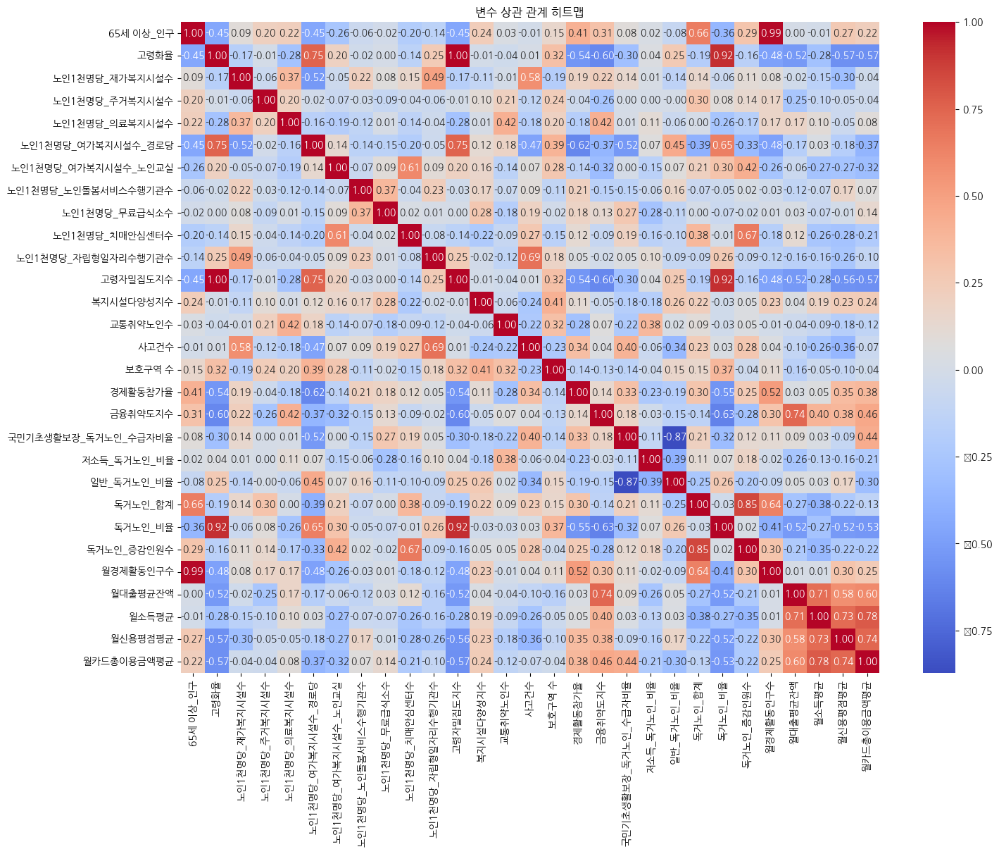

In [ ]:
# 상관관계 히트맵
plt.figure(figsize=(16, 12))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('변수 상관 관계 히트맵')
plt.show()

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import numpy as np
# X의 데이터 타입을 float으로 변환
data = data.astype(float)

# 상수항 추가
data_const = add_constant(data)

# VIF 계산
vif_data = pd.DataFrame()
vif_data['Variable'] = data_const.columns
vif_data['VIF'] = [variance_inflation_factor(data_const.values, i) for i in range(data_const.shape[1])]

# VIF 계산 후 무한값을 NaN으로 대체
vif_data['VIF'] = vif_data['VIF'].replace([np.inf, -np.inf], np.nan)

# VIF 값이 10 이상인 변수들만 출력
high_vif = vif_data[vif_data['VIF'] >= 10]
high_vif

,Variable,VIF
1,65세 이상_인구,2627.649347
2,고령화율,658465.952558
3,노인1천명당_재가복지시설수,50.934493
5,노인1천명당_의료복지시설수,11.661037
6,노인1천명당_여가복지시설수_경로당,32.075335
10,노인1천명당_치매안심센터수,33.361344
11,노인1천명당_자립형일자리수행기관수,30.228094
12,고령자밀집도지수,653850.088336
13,복지시설다양성지수,18.854091
14,교통취약노인수,11.294066


* 히트맵 및 VIF 기준으로 변수 drop

In [ ]:
data = data.drop(['경제활동참가율', '사고건수', '보호구역 수', '일반_독거노인_비율', '65세 이상_인구', '독거노인_증감인원수', '저소득_독거노인_비율','복지시설다양성지수',
                  '노인1천명당_의료복지시설수','노인1천명당_여가복지시설수_경로당','월경제활동인구수','교통취약노인수','독거노인_합계','노인1천명당_주거복지시설수','노인1천명당_노인돌봄서비스수행기관수'], axis=1)

In [ ]:
# 최종 data 변수들
data.columns

Index(['고령화율', '노인1천명당_재가복지시설수', '노인1천명당_여가복지시설수_노인교실', '노인1천명당_무료급식소수',
       '노인1천명당_치매안심센터수', '노인1천명당_자립형일자리수행기관수', '고령자밀집도지수', '금융취약도지수',
       '국민기초생활보장_독거노인_수급자비율', '독거노인_비율', '월대출평균잔액', '월소득평균', '월신용평점평균',
       '월카드총이용금액평균'],
      dtype='object')

In [ ]:
# 데이터 shape
data.shape

(31, 14)

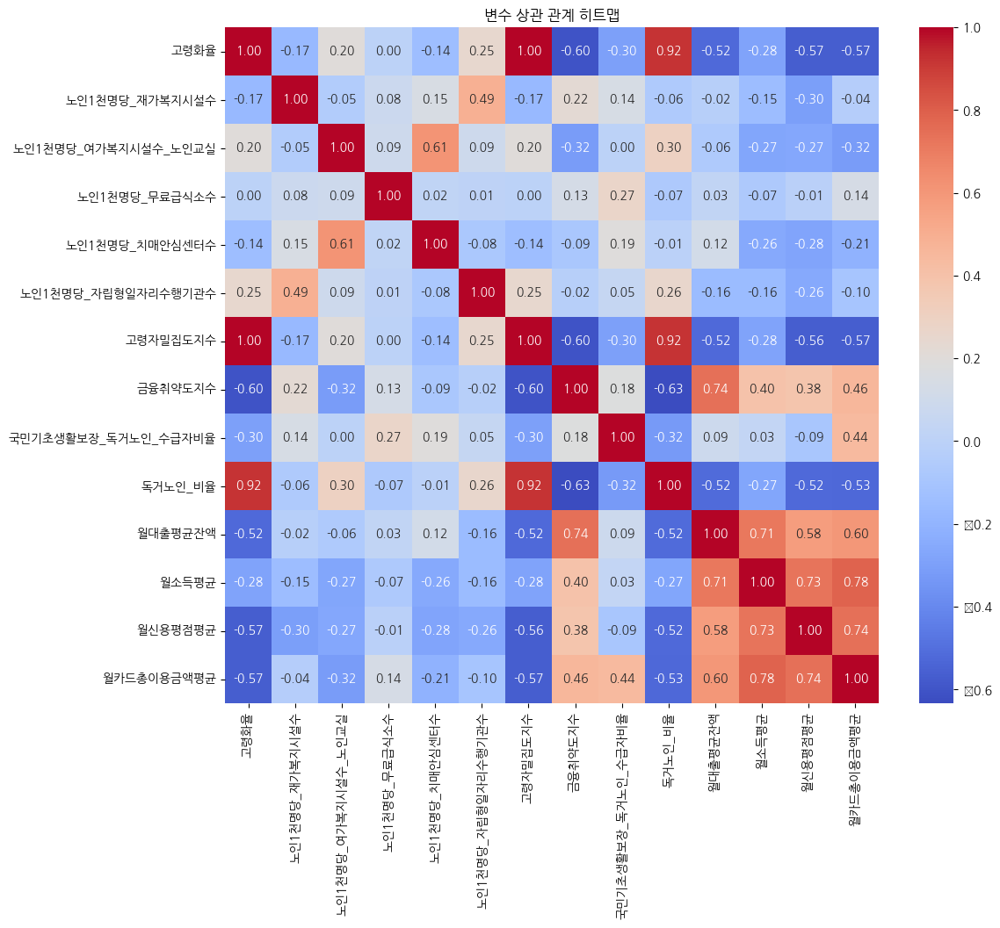

In [ ]:
# 상관관계 히트맵
plt.figure(figsize=(12, 10))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('변수 상관 관계 히트맵')
plt.show()

In [ ]:
# 데이터 정규화, 전처리
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import numpy as np
import pandas as pd

# 원본 복사
processed = data.copy()

# === ① 로그 변환 대상 (금융 금액류: 금액 범위 큼) ===
log_vars = ['월대출평균잔액', '월소득평균', '월카드총이용금액평균']
for col in log_vars:
    processed[col] = processed[col].apply(lambda x: np.log1p(x))  # log(1 + x)

# === ② 스케일링 ===

# (1) StandardScaler 대상: 비율/지수류
standard_scale_vars = [
    '고령화율', '고령자밀집도지수', '금융취약도지수',
    '국민기초생활보장_독거노인_수급자비율', '독거노인_비율',
    '월신용평점평균'  # log 처리 포함
]
scaler_std = StandardScaler()
processed[standard_scale_vars] = scaler_std.fit_transform(processed[standard_scale_vars])

# (2) MinMaxScaler 대상: 시설 수 / 드물게 등장하는 정수형 변수
minmax_scale_vars = [
    '노인1천명당_재가복지시설수',
    '노인1천명당_여가복지시설수_노인교실',
    '노인1천명당_무료급식소수',
    '노인1천명당_치매안심센터수',
    '노인1천명당_자립형일자리수행기관수'
]
scaler_mm = MinMaxScaler()
processed[minmax_scale_vars] = scaler_mm.fit_transform(processed[minmax_scale_vars])

# (3) log + StandardScaler 대상: 금융 금액류
log_std_vars = ['월대출평균잔액', '월소득평균', '월카드총이용금액평균']
scaler_log_std = StandardScaler()
processed[log_std_vars] = scaler_log_std.fit_transform(processed[log_std_vars])

# === ③ 반전 처리 (고위험도에 음의 영향인 변수) ===
reverse_vars = [
    '노인1천명당_재가복지시설수',
    '노인1천명당_여가복지시설수_노인교실',
    '노인1천명당_무료급식소수',
    '노인1천명당_치매안심센터수',
    '노인1천명당_자립형일자리수행기관수',
    '월소득평균',
    '월신용평점평균',
    '월카드총이용금액평균'
]

# 1.0 - 값으로 뒤집기 (스케일링된 값 기준)
for col in reverse_vars:
    processed[col] = -processed[col]  # 또는 1.0 - processed[col] 도 가능

# 결과 확인
processed.head()

,고령화율,노인1천명당_재가복지시설수,노인1천명당_여가복지시설수_노인교실,노인1천명당_무료급식소수,노인1천명당_치매안심센터수,노인1천명당_자립형일자리수행기관수,고령자밀집도지수,금융취약도지수,국민기초생활보장_독거노인_수급자비율,독거노인_비율,월대출평균잔액,월소득평균,월신용평점평균,월카드총이용금액평균
0,-0.040131,-0.329407,-0.00000,-0.0,-0.0,-0.000000,-0.040957,-1.417183,0.009304,0.460518,-1.564256,0.530867,0.294695,0.149838
1,-0.229103,-0.432841,-0.00000,-0.0,-0.0,-0.000000,-0.232919,1.403501,-1.090746,-0.323984,1.717757,-0.846513,0.411817,0.357939
2,1.605502,-0.256889,-0.70964,-0.0,-0.0,-0.470964,1.606989,-0.880066,-0.900049,1.735299,-0.661449,0.254444,0.376681,0.704844
3,1.361413,-0.269570,-0.00000,-0.0,-0.0,-0.000000,1.365113,-0.660357,-0.730917,1.328512,-0.489390,-0.397989,-0.080097,0.236485
4,1.810222,-0.345327,-0.00000,-0.0,-0.0,-0.000000,1.807702,-0.838773,-1.229703,1.785651,0.335870,-0.471891,0.575789,0.821630


In [ ]:
# Bartlett 검정
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity

chi_square_value, p_value = calculate_bartlett_sphericity(processed)
chi_square_value, p_value

(np.float64(601.9915592641623), np.float64(2.4792585869915832e-76))

p-value가 거의 0에 가까움. 검정이 통계적으로 유의하다는 것을 의미하며, 이는 변수들 간 상관관계 존재 → 요인분석을 진행할 수 있음을 의미.

In [ ]:
# KMO(Kaiser-Meyer-Olkin) 검사
from factor_analyzer.factor_analyzer import calculate_kmo

kmo_all, kmo_model = calculate_kmo(processed)
kmo_model

np.float64(0.6077521794710167)

데이터의 전체 KMO 값은 0.6077으로 이는 요인분석을 진행할 수 있음을 의미.

### **인자수 결정하기(Identify the Number of Factors)**
* 요인 수를 선택할 때는 Kaiser 기준(Kaiser criterion)과 스크리 플롯(Scree plot)을 사용할 수 있음. 이 두 방법 모두 고유값(eigenvalues)을 기반으로 함.

In [ ]:
from factor_analyzer import FactorAnalyzer

# Factor Analyzer 객체 생성
fa = FactorAnalyzer()

# 데이터프레임에 대해 요인분석 적합
fa.fit(data)

# 고유값(eigenvalues) 확인
ev, v = fa.get_eigenvalues() # eigenvalues

# 고유값 출력
ev

array([5.41086123e+00, 2.14326057e+00, 1.58847467e+00, 1.26795317e+00,
       1.17104220e+00, 8.25218783e-01, 6.23936945e-01, 4.56479263e-01,
       2.35947113e-01, 1.28096357e-01, 5.94583704e-02, 5.42851991e-02,
       3.49845406e-02, 1.58001567e-06])

* Kaiser 기준:
</br>이 규칙은 고유값이 1보다 큰 요인들을 유지할 것을 제안함.

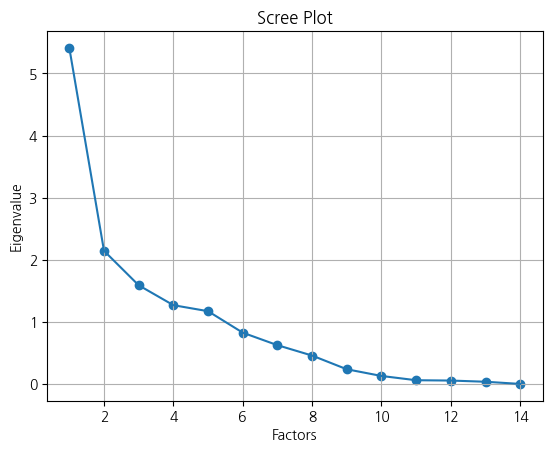

In [ ]:
# Scree plot 생성
import matplotlib.pyplot as plt
plt.scatter(range(1, data.shape[1]+1), ev)
plt.plot(range(1, data.shape[1]+1), ev)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

In [ ]:
import numpy as np
np.sum(ev>1)

np.int64(5)

Scree plot 방법은 각 요인과 그 고유값(eigenvalues)을 꺾은선 그래프로 나타냄. 1보다 큰 고유값의 개수를 요인 수로 간주함.

### **Factor Analysis 수행**
여기서는 요인 적재 행렬(factor loading matrix)에 대해 회전(rotation)을 수행. 회전의 목적은 각 변수들이 특정 요인(factor)에 더 뚜렷하게 연결되도록(극단적인 적재값을 갖도록) 만들어, 각 요인의 해석력을 높이고 명확한 의미를 부여하는 데 있음.
</br>From a mathematical point of view, there is no difference between a rotated and unrotated matrix. The fitted model is the same, the uniquenesses are the same, and the proportion of variance explained is the same.

In [ ]:
fa = FactorAnalyzer(n_factors = 5, rotation ='varimax',method = 'ml').fit(processed)

**공통성(Communality)**
</br>공통성(Communality)이란, 각 변수의 전체 분산 중에서 요인 분석을 통해 설명되는 비율을 의미.
즉, 각 변수의 분산을 요인(factor)들이 얼마나 잘 설명하는지를 나타내는 지표.
  * 공통성 해석 방법 (How to Interpret Communalities)
    * 범위: 공통성 값은 0에서 1 사이.
    - 0: 해당 변수의 분산을 요인들이 전혀 설명하지 못함
    - 1: 해당 변수의 분산이 전적으로 요인들에 의해 설명됨

In [ ]:
print("\nCommunalities (PAF):")

# Get communalities
communalities_df = pd.DataFrame(fa.get_communalities(), columns=['Communality'], index=data.columns)

# 높은 공통성을 갖는 변수에 highlight하는 함수
def highlight_high_communalities(val):
    if val > 0.6:
        return 'background-color: lightgreen'
    else:
        return ''

# 함수 적용
styled_communalities = communalities_df.style.applymap(highlight_high_communalities)

styled_communalities


Communalities (PAF):


,Communality
고령화율,0.997511
노인1천명당_재가복지시설수,0.307180
노인1천명당_여가복지시설수_노인교실,0.533552
노인1천명당_무료급식소수,0.091009
노인1천명당_치매안심센터수,0.913768
노인1천명당_자립형일자리수행기관수,0.194018
고령자밀집도지수,0.997503
금융취약도지수,0.875800
국민기초생활보장_독거노인_수급자비율,0.672157
독거노인_비율,0.879563


**요인 적재량**
</br>요인 적재량은 하나의 변수와 특정 요인(factor) 사이의 상관관계 또는 관련성의 정도를 의미. 즉, 어떤 변수가 특정 요인과 얼마나 밀접하게 연결되어 있는지를 보여주는 값.



In [ ]:
# 요인 적재량 출력
print("Factor loadings (PAF)")

# 요인적재 행렬 생성
lmatrix = pd.DataFrame(
    fa.loadings_,
    index=list(processed.columns),
    columns=['인자 1', '인자 2', '인자 3','인자 4', '인자 5']
)

# 각 변수별 최대 절대 적재값 위치 찾기
max_loading_mask = lmatrix.abs().eq(lmatrix.abs().max(axis=1), axis=0)

# 스타일링 함수: 최대 loading 셀에만 색칠
def highlight_max(df):
    # CSS 스타일 DataFrame 생성
    style_df = pd.DataFrame('', index=df.index, columns=df.columns)
    style_df[max_loading_mask] = 'background-color: lightblue'
    return style_df

# 스타일 적용
styled_lmatrix = lmatrix.style.apply(highlight_max, axis=None)

styled_lmatrix

Factor loadings (PAF)


,인자 1,인자 2,인자 3,인자 4,인자 5
고령화율,0.964623,0.185389,0.013974,-0.170918,0.056892
노인1천명당_재가복지시설수,0.191205,-0.298443,0.010465,-0.086647,0.417055
노인1천명당_여가복지시설수_노인교실,-0.176734,-0.110081,0.693068,0.072613,-0.067707
노인1천명당_무료급식소수,-0.032541,0.033084,-0.003358,-0.059583,0.292051
노인1천명당_치매안심센터수,0.154554,-0.165405,0.921554,-0.039537,0.108150
노인1천명당_자립형일자리수행기관수,-0.256762,-0.116734,-0.097005,-0.005938,0.324067
고령자밀집도지수,0.964683,0.185168,0.014407,-0.170847,0.056626
금융취약도지수,-0.458006,-0.138814,0.204465,0.753130,-0.194293
국민기초생활보장_독거노인_수급자비율,-0.264532,-0.084559,-0.101425,-0.089108,-0.759475
독거노인_비율,0.882705,0.129143,-0.125486,-0.252296,0.065706


In [ ]:
# 각 변수별 최대 loading 절대값이 있는 Factor 구하기
assigned_factors = lmatrix.abs().idxmax(axis=1) # 요인 적재 행렬

# 변수, 할당된 Factor, loading 값으로 DataFrame 만들기
assigned_df = pd.DataFrame({
    'Variable': lmatrix.index,
    'Assigned Factor': assigned_factors,
    'Loading': [lmatrix.loc[var, factor] for var, factor in zip(lmatrix.index, assigned_factors)]
})

# Assigned Factor별 정렬
assigned_df = assigned_df.sort_values('Assigned Factor').reset_index(drop=True)

# 보기 좋게 출력
assigned_df[['Assigned Factor','Variable','Loading']]

,Assigned Factor,Variable,Loading
0,인자 1,고령화율,0.964623
1,인자 1,고령자밀집도지수,0.964683
2,인자 1,독거노인_비율,0.882705
3,인자 2,월소득평균,0.857301
4,인자 2,월신용평점평균,0.766456
5,인자 2,월카드총이용금액평균,0.801661
6,인자 3,노인1천명당_여가복지시설수_노인교실,0.693068
7,인자 3,노인1천명당_치매안심센터수,0.921554
8,인자 4,금융취약도지수,0.753130
9,인자 4,월대출평균잔액,0.780338


In [ ]:
# Get variance of each factors
fa.get_factor_variance()

(array([3.56813692, 2.49961641, 1.55575692, 1.44973957, 1.16898838]),
 array([0.25486692, 0.17854403, 0.11112549, 0.10355283, 0.08349917]),
 array([0.25486692, 0.43341095, 0.54453645, 0.64808927, 0.73158844]))

총 72%의 누적 분산이 3개의 요인에 의해 설명됨

### **공통성(Communality)과 고유성(Uniqueness)**
요인분석(Factor Analysis)은 여러 변수들이 공유하는 공통된 패턴을 찾아내기 위해 수행됨. 이때 각 변수의 변동성(분산)은 두 부분으로 나눌 수 있음:

* 공통성 (Communality): 변수의 변동성 중 요인(factor)들로 설명되는 부분.
→ 즉, 변수와 다른 변수들 사이에 공통된 요인이 어느 정도 영향을 미치는지를 나타냄.

* 고유성 (Uniqueness): 변수의 변동성 중 요인들로 설명되지 않는 나머지 부분.
→ 해당 변수만의 독립적인 특성이나 오차로 볼 수 있음.

In [ ]:
# 공통성(communality)
fa.get_communalities()

array([0.99751115, 0.30717964, 0.53355248, 0.09100852, 0.91376804,
       0.19401835, 0.99750253, 0.87580048, 0.67215653, 0.87956284,
       0.9950246 , 0.8689557 , 0.92113329, 0.99506406])

In [ ]:
# 고유성(Uniqueness)
fa.get_uniquenesses()

array([0.00248885, 0.69282036, 0.46644752, 0.90899148, 0.08623196,
       0.80598165, 0.00249747, 0.12419952, 0.32784347, 0.12043716,
       0.0049754 , 0.1310443 , 0.07886671, 0.00493594])

**가중치 계산 방법**
공통성(Communality)은 각 변수가 전체 요인 구조 내에서 얼마나 잘 설명되는지를 나타내는 지표. 이 값을 활용해 가중치를 계산하는 방식은, 요인분석 결과를 종합 점수나 취약도 지수 등으로 통합할 때 자주 사용됨. 즉, 공통성이 높을수록 해당 변수는 요인 구조 안에서 설명력이 높고, 중요성이 크다고 판단할 수 있음. 따라서 각 변수의 가중치(weight_for_variable)는 전체 설명력 중 해당 변수가 차지하는 비중으로 정의.

In [ ]:
# 가중치 계산
communality = fa.get_communalities()
sum_communality = communality.sum()
weight_for_variable = communality / sum_communality

In [ ]:
# 표로 정리
# 절대값 기준 최대 요인
assigned_factors = lmatrix.abs().idxmax(axis=1)

# 각 변수별 loading 값
assigned_loadings = [lmatrix.loc[var, factor] for var, factor in zip(lmatrix.index, assigned_factors)]

assigned_df = pd.DataFrame({
    '인자': assigned_factors,
    '지표명': lmatrix.index,
    '가중치': weight_for_variable
})

assigned_df = assigned_df.sort_values(by='인자').reset_index(drop=True)

assigned_df[['인자', '지표명', '가중치']]

,인자,지표명,가중치
0,인자 1,고령화율,0.097392
1,인자 1,고령자밀집도지수,0.097391
2,인자 1,독거노인_비율,0.085876
3,인자 2,월소득평균,0.084840
4,인자 2,월신용평점평균,0.089935
5,인자 2,월카드총이용금액평균,0.097153
6,인자 3,노인1천명당_여가복지시설수_노인교실,0.052093
7,인자 3,노인1천명당_치매안심센터수,0.089216
8,인자 4,금융취약도지수,0.085509
9,인자 4,월대출평균잔액,0.097149


In [ ]:
# 행정동별 요인 점수(요인 분석 결과)와 가중 평균 점수 추가
factors = pd.DataFrame(fa.fit_transform(processed))  # 요인 점수
factors.columns = [f'인자{i+1}' for i in range(factors.shape[1])]

# 가중 평균 점수 함수
def weighted_average(data, weight):
    return [(data.iloc[i] * weight).sum() / weight.sum() for i in range(data.shape[0])]

# 가중 평균 점수 계산하여 factors에 추가
factors['점수'] = weighted_average(processed, weight_for_variable)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
factors['점수(0~100)'] = scaler.fit_transform(factors[['점수']])
factors['점수(0~100)'] = factors['점수(0~100)']*100

In [ ]:
factors.head()

,인자1,인자2,인자3,인자4,인자5,점수,점수(0~100)
0,-0.428516,0.244970,0.254566,-1.929201,0.116323,-0.164667,42.452270
1,0.097299,0.496733,0.108277,2.572931,0.598264,0.129501,65.404140
2,1.616034,-0.269363,-0.244159,-0.473698,0.314878,0.333659,81.333179
3,1.418237,-0.649956,0.104997,-0.502762,0.328843,0.201572,71.027351
4,2.063501,-0.356201,-0.251009,0.870997,0.646503,0.467121,91.746345


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ESAA OB 2조/방학 프로젝트/데이터/최종_병합_데이터.csv')
df = df[['구','이름']]
result = pd.concat([df, factors], axis=1)

In [ ]:
# 결과 정리
result.sort_values(by='점수(0~100)',ascending=True)

,구,이름,인자1,인자2,인자3,인자4,인자5,점수,점수(0~100)
28,서북구,불당2동,-1.208855,-1.910633,-0.060693,0.135007,0.725164,-0.708765,0.000000
26,서북구,백석동,-1.156310,-0.914657,0.281307,-0.819527,0.356986,-0.651418,4.474375
27,서북구,불당1동,-0.729503,-1.857567,-0.048789,1.377829,0.065210,-0.628339,6.275111
24,서북구,쌍용2동,-0.856995,-0.775426,0.225370,-0.841418,1.084695,-0.551688,12.255620
23,서북구,쌍용1동,-0.260493,-0.633753,0.290406,-1.226828,0.154453,-0.371585,26.307871
16,동남구,신안동,-0.413502,-0.596735,0.249596,0.339131,0.292617,-0.313065,30.873754
14,동남구,신방동,-1.077903,0.388819,0.558771,-0.370177,0.398974,-0.309248,31.171589
30,서북구,부성2동,-1.298782,0.343357,0.420103,1.244891,0.560075,-0.288667,32.777369
25,서북구,쌍용3동,0.268932,-2.590887,0.191039,-0.137702,-3.616438,-0.233378,37.091159
29,서북구,부성1동,-0.906663,0.181741,0.516897,1.813668,0.626128,-0.218420,38.258303


In [ ]:
result.describe()

,인자1,인자2,인자3,인자4,인자5,점수,점수(0~100)
count,3.100000e+01,3.100000e+01,3.100000e+01,3.100000e+01,3.100000e+01,31.000000,31.000000
mean,-2.865092e-17,4.297638e-17,-2.865092e-17,7.879002e-17,7.520866e-17,-0.023392,53.474993
std,1.014579e+00,1.001697e+00,9.763060e-01,1.001192e+00,9.530551e-01,0.350862,27.375317
min,-1.298782e+00,-2.590887e+00,-4.990374e+00,-1.929201e+00,-3.616438e+00,-0.708765,0.000000
25%,-7.867923e-01,-6.152438e-01,-2.556907e-02,-4.943282e-01,-1.385918e-01,-0.261023,34.934264
50%,-4.135025e-01,2.092538e-01,2.253697e-01,4.154762e-02,3.148778e-01,-0.047167,51.619932
75%,7.151217e-01,5.954608e-01,3.484381e-01,5.053455e-01,5.535044e-01,0.238048,73.873338
max,2.093620e+00,1.734857e+00,5.587715e-01,2.572931e+00,1.084695e+00,0.572906,100.000000


### **광역적 공간 자기 상관(Global Spatial Autocorrelation, Moran's I)**
* 복지 사각지대 고위험 지역을 클러스터링하는 근거로 쓸 수 있기에 활용해보자
* Moran's I는 지리적으로 가까운 지역들 간에 유사한 값들이 얼마나 공간적으로 클러스터(모여) 되어 있는지를 수치로 나타낸 지표

In [ ]:
# 광역적 공간 자기상관
y = gdf.점수
moran = esda.Moran(y, w)
moran.I, moran.p_sim # Moran의 I값, p-value 값

(np.float64(0.4281384986770038), np.float64(0.001))

* Moran's I = 0.4281: 어느 정도의 공간적 군집성 (양의 자기상관. 점수가 낮은 지역들끼리 모여 있고, 높은 지역도 어느 정도 모여 있다)
* p-value = 0.001: 통계적으로 유의미
</br>➡️ 활용 가능. 우리 데이터에서 Hot/Cold Spot 분석을 할 필요가 있다

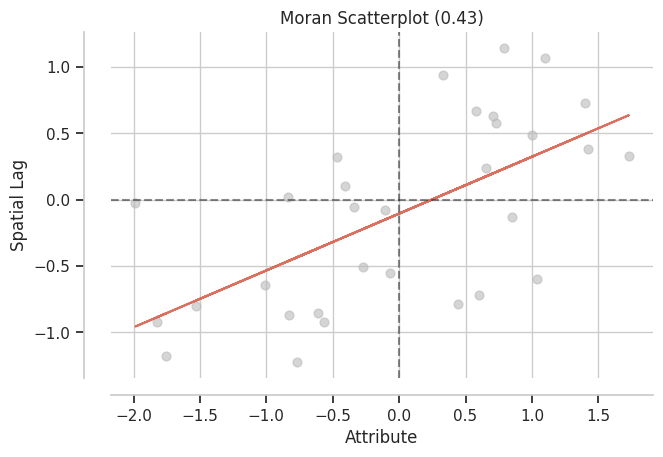

In [ ]:
from splot.esda import moran_scatterplot
import matplotlib.pyplot as plt

fig, ax = moran_scatterplot(moran)
plt.show()


### **지역적 공간 자기상관(Local Spatial Autocorrelation, Getis-Ord Gi)**

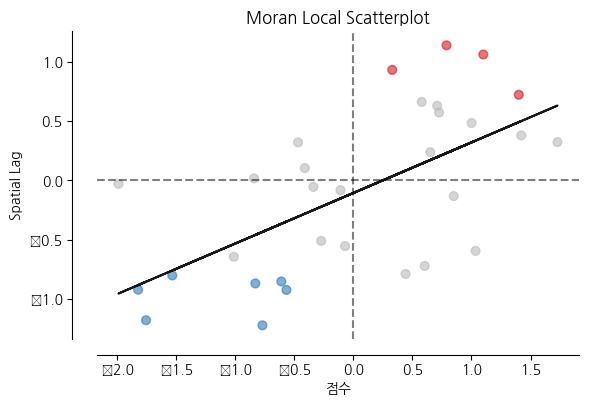

In [ ]:
# 지역 공간 자기상관
moran_local = Moran_Local(y, w)

fig, ax = plt.subplots(figsize=(8,4))
moran_scatterplot(Moran_Local(y, w), p=0.05, ax=ax)
ax.set_xlabel('점수')
ax.set_ylabel('Spatial Lag')

plt.show()

In [ ]:
gdf['moran_local']=moran_local.q
gdf.moran_local.value_counts()

,count
moran_local,
3,13
1,11
4,4
2,3


In [ ]:
# moran_local 숫자를 라벨로 바꾸기
moran_labels = {
    1: 'HH',  # High-High
    2: 'LH',  # Low-High
    3: 'LL',  # Low-Low
    4: 'HL'   # High-Low
}
gdf['moran_label'] = gdf['moran_local'].map(moran_labels)


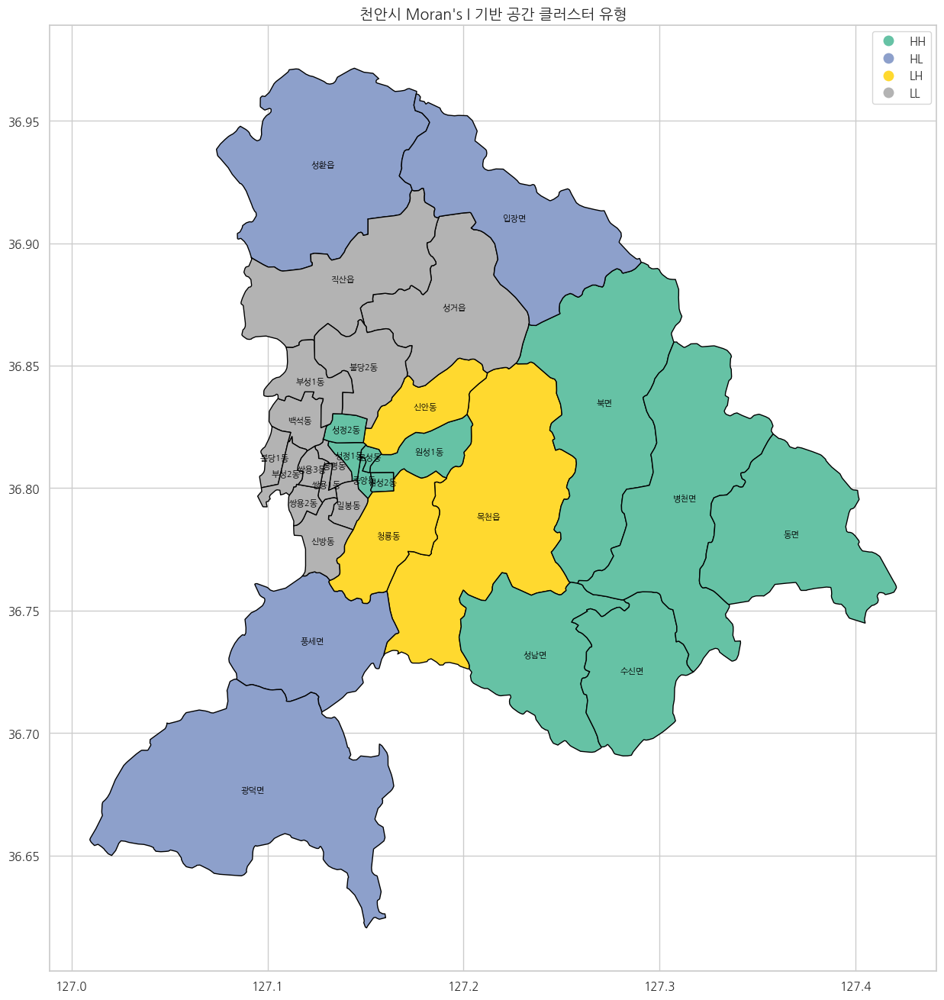

In [ ]:
# 시각화
fig, ax = plt.subplots(1, 1, figsize=(15,20))
gdf.plot(column='moran_label',
         cmap="Set2",  # 또는 'tab10', 'Pastel1' 등
         legend=True,
         edgecolor="black",
         ax=ax)

# 행정동 이름 표시
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['이름'], fontsize=8, ha='center', va='center', color='black')

# 타이틀
ax.set_title("천안시 Moran's I 기반 공간 클러스터 유형", fontsize=14)
plt.show()


## **공간 자기상관성을 이용한 위험군 필터링**

In [ ]:
risk_df = gdf[gdf['moran_local'] == 1]

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# 1. moran_local == 1인 행 필터링
risk_df = gdf[gdf['moran_local'] == 1].copy()

# 2. 클러스터링에 사용할 컬럼만 추출
factor_cols = ['인자1', '인자2', '인자3', '인자4', '인자5']
X = risk_df[factor_cols]

# 3. 정규화
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 4. 데이터프레임화 (인덱스 맞춤)
X_scaled_df = pd.DataFrame(X_scaled, columns=factor_cols, index=risk_df.index)

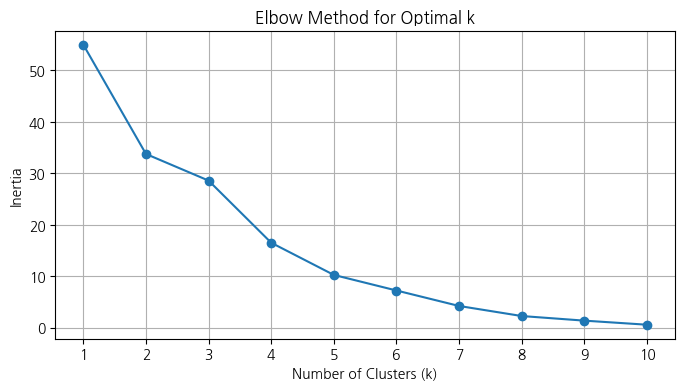

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# 1. 클러스터 수 범위 설정
inertia = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled_df)
    inertia.append(kmeans.inertia_)

# 2. Elbow Plot 시각화
plt.figure(figsize=(8, 4))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.xticks(k_range)
plt.grid(True)
plt.show()

In [ ]:
# 5. KMeans 클러스터링
kmeans = KMeans(n_clusters=3, random_state=42)
risk_df['cluster'] = kmeans.fit_predict(X_scaled_df)

# 6. 클러스터별 평균 확인
cluster_summary = risk_df.groupby('cluster')[factor_cols + ['점수', '점수(0~100)']].mean()
cluster_summary

,인자1,인자2,인자3,인자4,인자5,점수,점수(0~100)
cluster,,,,,,,
0,1.755929,-0.489304,-0.029140,-0.825806,0.478377,0.279001,77.068600
1,-0.040368,1.115880,-0.766326,0.035378,-0.718829,0.268481,76.247792
2,1.521519,0.069033,-0.088691,0.553548,0.613753,0.391993,85.884624


In [ ]:
# 7. 위험도 매핑 (필요시 cluster_summary 보고 수정)
risk_mapping = {
    2: '고위험',
    0: '중위험',
    1: '저위험'
}
risk_df['위험도'] = risk_df['cluster'].map(risk_mapping)

# 8. gdf에 위험도 및 클러스터 정보 병합 (moran_local==1인 행만 업데이트)
gdf.loc[risk_df.index, 'cluster'] = risk_df['cluster']
gdf.loc[risk_df.index, '위험도'] = risk_df['위험도']

In [ ]:
gdf.head()

,geometry,이름,인자1,인자2,인자3,인자4,인자5,점수,점수(0~100),spatial_lag,moran_local,cluster,위험도
0,"MULTIPOLYGON (((127.25464 36.7616, 127.25355 3...",목천읍,-0.428516,0.244970,0.254566,-1.929201,0.116323,-0.164667,42.452270,0.012926,2,0,None
1,"MULTIPOLYGON (((127.13169 36.76247, 127.13145 ...",풍세면,0.097299,0.496733,0.108277,2.572931,0.598264,0.129501,65.404140,-0.296245,4,1,None
2,"MULTIPOLYGON (((127.12771 36.70858, 127.12766 ...",광덕면,1.616034,-0.269363,-0.244159,-0.473698,0.314878,0.333659,81.333179,-0.228999,4,2,None
3,"MULTIPOLYGON (((127.30735 36.85967, 127.30704 ...",북면,1.418237,-0.649956,0.104997,-0.502762,0.328843,0.201572,71.027351,0.059313,1,0,중위험
4,"MULTIPOLYGON (((127.25464 36.7616, 127.25829 3...",성남면,2.063501,-0.356201,-0.251009,0.870997,0.646503,0.467121,91.746345,0.108216,1,2,고위험


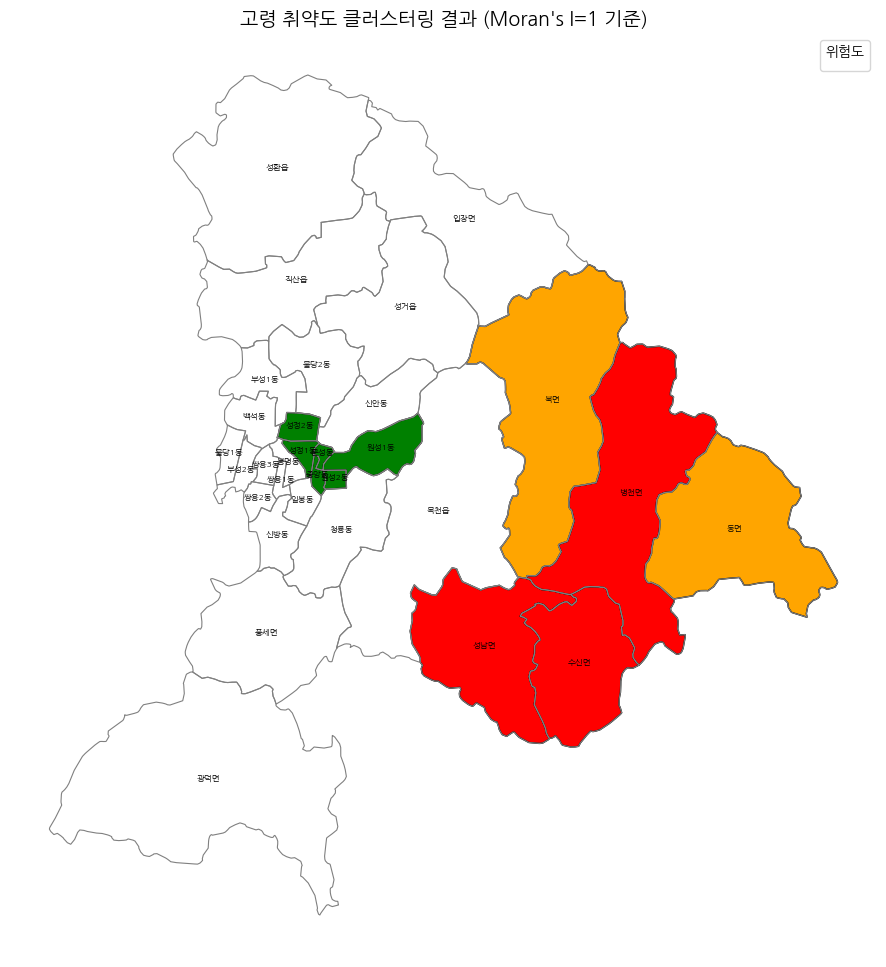

In [ ]:
# 9. 시각화 준비
color_dict = {
    '고위험': 'red',
    '중위험': 'orange',
    '저위험': 'green'
}

fig, ax = plt.subplots(figsize=(12, 12))

# 전체 행정동 테두리 회색으로 그림
gdf.boundary.plot(ax=ax, linewidth=0.8, edgecolor='gray')

# 행정동 이름 표시
for idx, row in gdf.iterrows():
    x = row.geometry.centroid.x
    y = row.geometry.centroid.y
    ax.text(x, y, row['이름'], fontsize=6, ha='center', color='black')

# moran_local == 1인 지역 중 위험도별 색칠
for risk_level, color in color_dict.items():
    subset = gdf[(gdf['moran_local'] == 1) & (gdf['위험도'] == risk_level)]
    subset.plot(ax=ax, color=color, edgecolor='black', linewidth=1, label=risk_level)

plt.legend(title="위험도", loc='upper right')
plt.title("고령 취약도 클러스터링 결과 (Moran's I=1 기준)", fontsize=14)
plt.axis('off')
plt.show()

In [ ]:
# 고위험 사각지대
gdf[gdf['cluster']==2]['이름']

,이름
2,광덕면
4,성남면
5,수신면
6,병천면
17,성환읍
20,입장면
25,쌍용3동


In [ ]:
# 중위험 사각지대
gdf[gdf['cluster']==0]['이름']

,이름
0,목천읍
3,북면
7,동면
12,봉명동
14,신방동
18,성거읍
19,직산읍
23,쌍용1동


In [ ]:
# 저위험 사각지대
gdf[gdf['cluster']==1]['이름']

,이름
1,풍세면
8,중앙동
9,문성동
10,원성1동
11,원성2동
13,일봉동
15,청룡동
16,신안동
21,성정1동
22,성정2동
